# Library Import and Drive connection

In [ ]:
#import libraries
from google.colab import drive
import os
from sklearn.preprocessing import MinMaxScaler
import numpy as np
import plotly.express as pexp
import tensorflow as tf
from tensorflow import keras
from keras.models import Sequential
from keras.layers import Bidirectional, Dropout, Activation, Dense, LSTM, CuDNNLSTM
from keras.layers import Input
from keras.models import Model
import plotly.graph_objects as go
import pandas as pd
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, explained_variance_score, median_absolute_error
from sklearn.metrics import roc_curve, roc_auc_score
import warnings
warnings.filterwarnings('ignore')
import plotly.graph_objects as go
import statsmodels.api as sm
from plotly.subplots import make_subplots
import matplotlib.pyplot as plt
from itertools import product
from statsmodels.tsa.arima.model import ARIMA
import pickle
import time
import datetime
from datetime import timedelta
import requests
!pip install yahooquery
from yahooquery import Screener
import yfinance as yf
!pip install pytrends
from pandas_datareader import data as pdr
!pip install pmdarima
import pmdarima as pm
from pmdarima.arima.utils import ndiffs
!pip install arch
from arch import arch_model
from sklearn.preprocessing import StandardScaler
from scipy.stats import boxcox
from scipy.special import inv_boxcox
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
from scipy.spatial.distance import pdist
from scipy.stats import anderson
from datetime import datetime, timedelta
import datetime
minMaxScl = MinMaxScaler()

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.8/49.8 kB 723.1 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 11.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 916.4/916.4 kB 6.4 MB/s eta 0:00:00


In [ ]:
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


# Google Search Trend

In [ ]:
import pandas as pd
from pytrends.request import TrendReq
import plotly.graph_objects as go

keywords = ["crypto", "cryptocurrency", "bitcoin", "blockchain"]
pt = TrendReq(hl='en')
custom_colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']
fig = go.Figure()

for i, keyword in enumerate(keywords):
    pt.build_payload([keyword],cat=0, timeframe='2013-01-01 2023-07-31')
    df = pt.interest_over_time()
    fig.add_trace(go.Scatter(x=df.index, y=df[keyword], mode='lines', name=keyword, line=dict(color=custom_colors[i])))

fig.update_layout(
    #title="Trend and popularity gain of Blockchain and cryptocurrency",
    xaxis_title="Year",
    yaxis_title="Searches (%)",
    legend=dict(x=0, y=1),
    autosize=False,
    width=1300,
    height=600,
    plot_bgcolor='white'
)
fig.show()


# Data Import using Yahoo Finance API

In [ ]:
src = Screener()
end_date='2023-08-01'
data = src.get_screeners('all_cryptocurrencies_us', count=250)['all_cryptocurrencies_us']['quotes']
symbol_name_list = [(d['symbol'], d['shortName']) for d in data]
combined_data= pd.DataFrame()
#period ='max',
for symbol_name in symbol_name_list:
  symbol, name = symbol_name[0],symbol_name[1]
  initial_data = yf.download(symbol, group_by="Ticker", keepna= False, end= end_date,  progress = False)
  initial_data['Symbol'] = symbol
  initial_data['Name'] = name
  initial_data['Percent Change Price'] = initial_data['Adj Close'].pct_change().fillna(0)
  combined_data = pd.concat([combined_data,initial_data])

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MNT27075-USD']: Exception("%ticker%: Period 'max' is invalid, must be one of ['1d', '5d']")
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['WEOS-USD']: Exception("%ticker%: Period 'max' is invalid, must be one of ['1d', '5d']")
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FDUSD-USD']: Exception("%ticker%: Period 'max' is invalid, must be one of ['1d', '5d']")
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['SEI-USD']: Exception("%ticker%: Period 'max' is invalid, must be one of ['1d', '5d']")
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LYX-USD']: Exception("%ticker%: Period 'max' is invalid, must be one of ['1d', '5d']")
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['FNSA-USD']: Exception("%ticker%: Period 'max' is invalid, must be one of ['1d', '5d']")
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['UNIBOT27009-USD']: Exception("%ticker%: Period 'max' is invalid, must be one of ['1d', '5d']")
ERROR:yfin

In [ ]:
combined_data

,Open,High,Low,Close,Adj Close,Volume,Symbol,Name,Percent Change Price
Date,,,,,,,,,
2014-09-17,465.864014,468.174011,452.421997,457.334015,457.334015,21056800.0,BTC-USD,Bitcoin USD,0.000000
2014-09-18,456.859985,456.859985,413.104004,424.440002,424.440002,34483200.0,BTC-USD,Bitcoin USD,-0.071926
2014-09-19,424.102997,427.834991,384.532013,394.795990,394.795990,37919700.0,BTC-USD,Bitcoin USD,-0.069843
2014-09-20,394.673004,423.295990,389.882996,408.903992,408.903992,36863600.0,BTC-USD,Bitcoin USD,0.035735
2014-09-21,408.084991,412.425995,393.181000,398.821014,398.821014,26580100.0,BTC-USD,Bitcoin USD,-0.024659
...,...,...,...,...,...,...,...,...,...
2023-07-27,0.000000,0.000000,0.000000,0.000000,0.000000,5024876.0,BRISE-USD,Bitgert USD,0.000000
2023-07-28,0.000000,0.000000,0.000000,0.000000,0.000000,4328481.0,BRISE-USD,Bitgert USD,0.000000
2023-07-29,0.000000,0.000000,0.000000,0.000000,0.000000,3250224.0,BRISE-USD,Bitgert USD,0.000000


# Cryptocurrencies Comparison Analysis

In [ ]:
stats_combined =pd.DataFrame()
symbol_counts = []
for symbol in combined_data['Symbol'].unique():
  combined_data_temp=combined_data[combined_data['Symbol']== symbol]
  Symbol =combined_data_temp['Symbol'][0]
  CloseStats = pd.DataFrame(combined_data_temp['Adj Close'].describe())
  CloseStats.columns = [Symbol]
  stats_combined=pd.concat([stats_combined,CloseStats], axis =1)

In [ ]:
stats_combined

,BTC-USD,ETH-USD,USDT-USD,BNB-USD,XRP-USD,USDC-USD,STETH-USD,ADA-USD,DOGE-USD,SOL-USD,...,PUNDIX-USD,CFG-USD,STPT-USD,KEEP-USD,SNT-USD,AMP-USD,MLK-USD,EDU24613-USD,VVS-USD,BRISE-USD
count,3240.000000,2091.000000,2091.000000,2091.000000,2091.000000,1758.000000,951.000000,2091.000000,2091.000000,1208.000000,...,849.000000,747.000000,1511.000000,1175.000000,2091.000000,1054.000000,1091.000000,95.000000,617.000000,7.340000e+02
mean,13731.013215,1192.713224,1.001458,161.521678,0.518769,1.002141,2205.623762,0.475843,0.062379,45.773159,...,0.928243,0.558522,0.044570,0.388550,0.054396,0.021919,0.646684,0.903042,0.000016,2.670300e-07
std,16014.797833,1142.916798,0.005431,179.096102,0.347390,0.005537,923.664092,0.593525,0.093380,56.529483,...,0.797114,0.474536,0.033296,0.271364,0.059535,0.021514,0.534676,0.251289,0.000025,4.457808e-07
min,178.102997,84.308296,0.966644,1.510360,0.139635,0.970124,588.655334,0.023961,0.001038,0.515273,...,0.305549,0.143563,0.006555,0.070323,0.008436,0.001976,0.136786,0.566489,0.000003,0.000000e+00
25%,769.331268,224.001167,0.999999,15.053590,0.296433,0.999935,1547.287842,0.073361,0.002645,6.617806,...,0.430360,0.252560,0.017337,0.173910,0.022897,0.004790,0.273333,0.676122,0.000004,0.000000e+00
50%,7765.231445,696.530029,1.000400,29.842478,0.403904,1.000135,1873.666382,0.249771,0.005539,24.599642,...,0.578066,0.314000,0.040519,0.297951,0.029809,0.009118,0.377149,0.791534,0.000006,0.000000e+00
75%,20557.433594,1843.145020,1.002114,305.961929,0.637330,1.001776,2878.922363,0.529088,0.081480,44.698380,...,1.160694,0.695453,0.053041,0.592119,0.069509,0.040271,0.983874,1.141930,0.000022,1.000000e-06
max,67566.828125,4812.087402,1.077880,675.684082,3.377810,1.044029,4777.916992,2.968239,0.684777,258.934326,...,6.563468,2.124399,0.193280,2.191009,0.665023,0.108954,3.878906,1.414034,0.000141,2.000000e-06


In [ ]:
symbols_list = [
    "BTC-USD", "ETH-USD", "USDT-USD", "BNB-USD", "XRP-USD", "USDC-USD",
    "STETH-USD", "DOGE-USD", "ADA-USD", "SOL-USD", "WTRX-USD", "TRX-USD",
    "MATIC-USD", "SHIB-USD", "DOT-USD", "LTC-USD", "DAI-USD", "TON11419-USD",
    "WBTC-USD", "BCH-USD", "AVAX-USD", "LINK-USD", "XLM-USD", "LEO-USD",
    "UNI7083-USD", "BUSD-USD", "TUSD-USD", "XMR-USD", "ATOM-USD", "OKB-USD",
    "ETC-USD", "WHBAR-USD", "HBAR-USD", "FIL-USD", "ICP-USD", "LDO-USD",
    "APT21794-USD", "BTCB-USD", "MNT27075-USD", "ARB11841-USD", "CRO-USD",
    "VET-USD", "NEAR-USD", "MKR-USD", "QNT-USD", "OP-USD", "GRT6719-USD",
    "AAVE-USD", "WEOS-USD", "ALGO-USD"
]
data = {'Rank': range(1, len(symbols_list) + 1), 'Symbol': symbols_list}
crypto_rank_50 = pd.DataFrame(data)
print(crypto_rank_50)

    Rank        Symbol
0      1       BTC-USD
1      2       ETH-USD
2      3      USDT-USD
3      4       BNB-USD
4      5       XRP-USD
5      6      USDC-USD
6      7     STETH-USD
7      8      DOGE-USD
8      9       ADA-USD
9     10       SOL-USD
10    11      WTRX-USD
11    12       TRX-USD
12    13     MATIC-USD
13    14      SHIB-USD
14    15       DOT-USD
15    16       LTC-USD
16    17       DAI-USD
17    18  TON11419-USD
18    19      WBTC-USD
19    20       BCH-USD
20    21      AVAX-USD
21    22      LINK-USD
22    23       XLM-USD
23    24       LEO-USD
24    25   UNI7083-USD
25    26      BUSD-USD
26    27      TUSD-USD
27    28       XMR-USD
28    29      ATOM-USD
29    30       OKB-USD
30    31       ETC-USD
31    32     WHBAR-USD
32    33      HBAR-USD
33    34       FIL-USD
34    35       ICP-USD
35    36       LDO-USD
36    37  APT21794-USD
37    38      BTCB-USD
38    39  MNT27075-USD
39    40  ARB11841-USD
40    41       CRO-USD
41    42       VET-USD
42    43   

## Listing based on Volatility

In [ ]:
#current_date = datetime.datetime.today()
current_date =combined_data.index[-1]
days_before = datetime.timedelta(days=30)
date_30_days_before = current_date - days_before
combined_data_recent_30 = combined_data[combined_data.index > date_30_days_before]

days_before = datetime.timedelta(days=7)
date_7_days_before = current_date - days_before
combined_data_recent_7 = combined_data[combined_data.index > date_7_days_before]

grouped_df = combined_data_recent_30.groupby(['Symbol', 'Name'])['Percent Change Price'].std()
grouped_df = grouped_df.sort_values(ascending=False)
top_15_currencies = grouped_df.head(15)
top_15_currencies_30 = top_15_currencies.reset_index('Name')

grouped_df = combined_data_recent_7.groupby(['Symbol', 'Name'])['Percent Change Price'].std()
grouped_df = grouped_df.sort_values(ascending=False)
top_15_currencies = grouped_df.head(15)
top_15_currencies_7 = top_15_currencies.reset_index('Name')

fig_30_days = go.Figure()
fig_30_days.add_trace(
    go.Bar(x=top_15_currencies_30['Percent Change Price'], y=top_15_currencies_30['Name'].str.replace(' USD', ''), orientation='h', name='Top 15 Cryptos(30 Days)',marker=dict(color='blue'))
)
fig_30_days.update_xaxes(title_text='Percent Change Price', title_font=dict(family='Times New Roman', size=19), tickfont=dict(family='Times New Roman', size=19))
fig_30_days.update_yaxes(title_text='Crypto Currency', title_font=dict(family='Times New Roman', size=19), tickfont=dict(family='Times New Roman', size=19))
fig_30_days.update_layout(title='Top 15 Cryptocurrencies based Volatility over 30 days ', font=dict(family='Times New Roman', size=20))


# Plot for last 7 days
fig_7_days = go.Figure()
fig_7_days.add_trace(
    go.Bar(x=top_15_currencies_7['Percent Change Price'], y=top_15_currencies_7['Name'].str.replace(' USD', ''), orientation='h', name='Top 15 Cryptos(7 Days)',marker=dict(color='red'))
)
fig_7_days.update_xaxes(title_text='Percent Change Price', title_font=dict(family='Times New Roman', size=19), tickfont=dict(family='Times New Roman', size=19))
fig_7_days.update_yaxes(title_text='Crypto Currency', title_font=dict(family='Times New Roman', size=19), tickfont=dict(family='Times New Roman', size=19))
fig_7_days.update_layout(title='Top 15 Cryptocurrencies based Volatility over 7 days ', font=dict(family='Times New Roman', size=20))
#fig_30_days.update_layout( width=1200,height=700)
#fig_7_days.update_layout( width=1200,height=700)
fig_30_days.show()
fig_7_days.show()



## Listing based on Volume

In [ ]:
#current_date = datetime.datetime.today()
days_before = datetime.timedelta(days=30)
date_30_days_before = current_date - days_before
combined_data_recent_30 = combined_data[combined_data.index > date_30_days_before]
days_before = datetime.timedelta(days=7)
date_7_days_before = current_date - days_before
combined_data_recent_7 = combined_data[combined_data.index > date_7_days_before]
grouped_df = combined_data_recent_30.groupby(['Symbol', 'Name'])['Volume'].mean()
grouped_df = grouped_df.sort_values(ascending=False)
top_15_currencies = grouped_df.head(15)
top_15_currencies_30 = top_15_currencies.reset_index('Name')

grouped_df = combined_data_recent_7.groupby(['Symbol', 'Name'])['Volume'].mean()
grouped_df = grouped_df.sort_values(ascending=False)
top_15_currencies = grouped_df.head(15)
top_15_currencies_7 = top_15_currencies.reset_index('Name')




fig_30_days = go.Figure()
fig_30_days.add_trace(
    go.Bar(x=top_15_currencies_30['Volume'], y=top_15_currencies_30['Name'].str.replace(' USD', ''), orientation='h', name='Top 15 Cryptos(30 Days)',marker=dict(color='blue'))
)
fig_30_days.update_xaxes(title_text='Volume', title_font=dict(family='Times New Roman', size=19), tickfont=dict(family='Times New Roman', size=19))
fig_30_days.update_yaxes(title_text='Crypto Currency', title_font=dict(family='Times New Roman', size=19), tickfont=dict(family='Times New Roman', size=19))
fig_30_days.update_layout(title='Top 15 Cryptocurrencies based on Average Volume over 30 days ', font=dict(family='Times New Roman', size=20))

# Plot for last 7 days
fig_7_days = go.Figure()
fig_7_days.add_trace(
    go.Bar(x=top_15_currencies_7['Volume'], y=top_15_currencies_7['Name'].str.replace(' USD', ''), orientation='h', name='Top 15 Cryptos(7 Days)',marker=dict(color='red'))
)
fig_7_days.update_xaxes(title_text='Volume', title_font=dict(family='Times New Roman', size=19), tickfont=dict(family='Times New Roman', size=19))
fig_7_days.update_yaxes(title_text='Crypto Currency', title_font=dict(family='Times New Roman', size=19), tickfont=dict(family='Times New Roman', size=19))
fig_7_days.update_layout(title='Top 15 Cryptocurrencies based on Average Volume over 7 days', font=dict(family='Times New Roman', size=20))

# Show the plots separately
fig_30_days.show()
fig_7_days.show()






## Listing based on Price

In [ ]:
def create_individual_plot(title, x_data, y_data, color):
    fig = go.Figure()
    fig.add_trace(go.Bar(x=x_data, y=y_data, orientation='h', marker=dict(color=color)))

    fig.update_xaxes(title_text='Price', title_font=dict(family='Times New Roman', size=19), tickfont=dict(family='Times New Roman', size=19))
    fig.update_yaxes(title_text='Crypto Currency', title_font=dict(family='Times New Roman', size=19), tickfont=dict(family='Times New Roman', size=19))
    fig.update_layout(title=title, font=dict(family='Times New Roman', size=20))
    return fig
days_before = datetime.timedelta(days=365)
date_before = current_date - days_before
combined_data_recent = combined_data[combined_data.index > date_before]
grouped_df = combined_data_recent.groupby(['Symbol', 'Name'])['Adj Close'].mean()
grouped_df = grouped_df.sort_values(ascending=False)
top_15_currencies = grouped_df.head(15)
top_15_currencies = top_15_currencies.reset_index('Name')
plot_365_days = create_individual_plot('Last 365 Days', top_15_currencies['Adj Close'], top_15_currencies['Name'].str.replace(' USD', ''), color='blue')

days_before = datetime.timedelta(days=180)
date_before = current_date - days_before
combined_data_recent = combined_data[combined_data.index > date_before]
grouped_df = combined_data_recent.groupby(['Symbol', 'Name'])['Adj Close'].mean()
grouped_df = grouped_df.sort_values(ascending=False)
top_15_currencies = grouped_df.head(15)
top_15_currencies = top_15_currencies.reset_index('Name')
plot_180_days = create_individual_plot('Last 180 Days', top_15_currencies['Adj Close'], top_15_currencies['Name'].str.replace(' USD', ''), color='green')

days_before = datetime.timedelta(days=30)
date_before = current_date - days_before
combined_data_recent = combined_data[combined_data.index > date_before]
grouped_df = combined_data_recent.groupby(['Symbol', 'Name'])['Adj Close'].mean()
grouped_df = grouped_df.sort_values(ascending=False)
top_15_currencies = grouped_df.head(15)
top_15_currencies = top_15_currencies.reset_index('Name')
plot_30_days = create_individual_plot('Last 30 Days', top_15_currencies['Adj Close'], top_15_currencies['Name'].str.replace(' USD', ''), color='orange')

days_before = datetime.timedelta(days=7)
date_before = current_date - days_before
combined_data_recent = combined_data[combined_data.index > date_before]
grouped_df = combined_data_recent.groupby(['Symbol', 'Name'])['Adj Close'].mean()
grouped_df = grouped_df.sort_values(ascending=False)
top_15_currencies = grouped_df.head(15)
top_15_currencies = top_15_currencies.reset_index('Name')
plot_7_days = create_individual_plot('Last 7 Days', top_15_currencies['Adj Close'], top_15_currencies['Name'].str.replace(' USD', ''), color='red')

# Show the individual plots
plot_365_days.show()
plot_180_days.show()
plot_30_days.show()
plot_7_days.show()


In [ ]:
fig = make_subplots(rows=2, cols=2, subplot_titles=['Last 365 Days','Last 180 Days','Last 30 Days', 'Last 7 Days'], horizontal_spacing=0.15, vertical_spacing=0.15)
days_before = datetime.timedelta(days=365)
date_before = current_date - days_before
combined_data_recent = combined_data[combined_data.index > date_before]
grouped_df = combined_data_recent.groupby(['Symbol', 'Name'])['Adj Close'].mean()
grouped_df = grouped_df.sort_values(ascending=False)
top_15_currencies = grouped_df.head(15)
top_15_currencies = top_15_currencies.reset_index('Name')
# Plot for last 365 days
fig.add_trace(
    go.Bar(x=top_15_currencies['Adj Close'], y=top_15_currencies['Name'].str.replace(' USD', ''), orientation='h'),
    row=1, col=1
)
fig.update_xaxes(title_text='Price', row=1, col=1)
days_before = datetime.timedelta(days=180)
date_before = current_date - days_before
combined_data_recent = combined_data[combined_data.index > date_before]
grouped_df = combined_data_recent.groupby(['Symbol', 'Name'])['Adj Close'].mean()
grouped_df = grouped_df.sort_values(ascending=False)
top_15_currencies = grouped_df.head(15)
top_15_currencies = top_15_currencies.reset_index('Name')
fig.add_trace(
    go.Bar(x=top_15_currencies['Adj Close'], y=top_15_currencies['Name'].str.replace(' USD', ''), orientation='h'),
    row=1, col=2
)
fig.update_xaxes(title_text='Price', row=1, col=2)
days_before = datetime.timedelta(days=30)
date_before = current_date - days_before
combined_data_recent = combined_data[combined_data.index > date_before]
grouped_df = combined_data_recent.groupby(['Symbol', 'Name'])['Adj Close'].mean()
grouped_df = grouped_df.sort_values(ascending=False)
top_15_currencies = grouped_df.head(15)
top_15_currencies = top_15_currencies.reset_index('Name')
fig.add_trace(
    go.Bar(x=top_15_currencies['Adj Close'], y=top_15_currencies['Name'].str.replace(' USD', ''), orientation='h'),
    row=2, col=1
)
fig.update_xaxes(title_text='Price', row=2, col=1)

days_before = datetime.timedelta(days=7)
date_before = current_date - days_before
combined_data_recent = combined_data[combined_data.index > date_before]
grouped_df = combined_data_recent.groupby(['Symbol', 'Name'])['Adj Close'].mean()
grouped_df = grouped_df.sort_values(ascending=False)
top_15_currencies = grouped_df.head(15)
top_15_currencies = top_15_currencies.reset_index('Name')
fig.add_trace(
    go.Bar(x=top_15_currencies['Adj Close'], y=top_15_currencies['Name'].str.replace(' USD', ''), orientation='h'),
    row=2, col=2
)
fig.update_xaxes(title_text='Price', row=2, col=2)

fig.update_layout(title='Top 15 Cryptocurrencies based on Latest Price', height=800, width=1200
)
# Show the subplot
fig.update_traces(showlegend=False)
fig.show()

## Correlation Analysis - Clustering

In [ ]:
cluster_data=pd.DataFrame()
for i in crypto_rank_50['Symbol']:
  clean_combined_data = combined_data.dropna(how='all').dropna(axis=1)
  selected_data = clean_combined_data[clean_combined_data['Symbol'] == i]['Percent Change Price'].dropna().tail(356)
  cluster_data[i]=selected_data
cluster_data.dropna(axis =1, inplace=True)
corr_matrix = cluster_data.corr(method='spearman')
corr_matrix = corr_matrix.sort_values(['BTC-USD', 'ETH-USD', 'USDT-USD', 'BNB-USD', 'XRP-USD', 'USDC-USD',
       'STETH-USD', 'DOGE-USD', 'ADA-USD', 'SOL-USD', 'WTRX-USD', 'TRX-USD',
       'MATIC-USD', 'SHIB-USD', 'DOT-USD', 'LTC-USD', 'DAI-USD',
       'TON11419-USD', 'WBTC-USD', 'BCH-USD'], axis=1)
corr_matrix = corr_matrix.sort_values(['BTC-USD', 'ETH-USD', 'USDT-USD', 'BNB-USD', 'XRP-USD', 'USDC-USD',
       'STETH-USD', 'DOGE-USD', 'ADA-USD', 'SOL-USD', 'WTRX-USD', 'TRX-USD',
       'MATIC-USD', 'SHIB-USD', 'DOT-USD', 'LTC-USD', 'DAI-USD',
       'TON11419-USD', 'WBTC-USD', 'BCH-USD'], axis=0)
lower_triangle = corr_matrix.where(pd.np.tril(pd.np.ones(corr_matrix.shape)).astype(pd.np.bool))
fig = pexp.imshow(corr_matrix, color_continuous_scale='plotly3',width=1000,height=1000)
fig.update_layout(
    title='Correlation Matrix',
    showlegend=False, plot_bgcolor='white',xaxis_tickangle=-90 )
#coloraxis_showscale=False
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

In [ ]:
cluster_data=pd.DataFrame()
for i in crypto_rank_50['Symbol']:
  clean_combined_data = combined_data.dropna(how='all').dropna(axis=1)
  selected_data = clean_combined_data[clean_combined_data['Symbol'] == i]['Percent Change Price'].dropna().tail(356)
  cluster_data[i]=selected_data
cluster_data.dropna(axis =1, inplace=True)
corr_matrix = cluster_data.corr(method='spearman')

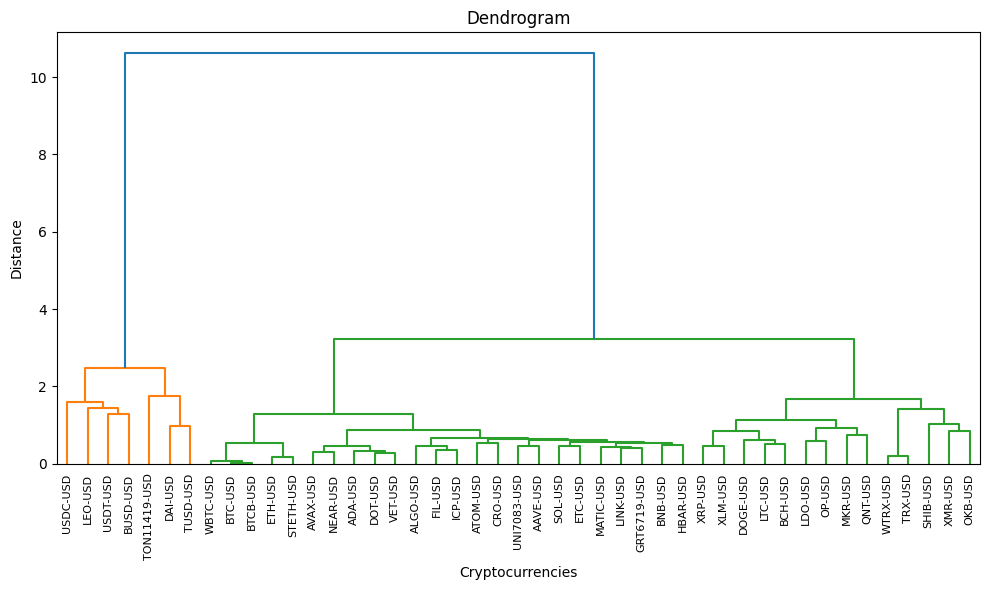

In [ ]:
distance= linkage(pdist(corr_matrix.values), method='ward')
plt.figure(figsize=(10, 6))
dendrogram(distance, labels=corr_matrix.columns, leaf_rotation=90)
plt.title('Dendrogram')
plt.xlabel('Cryptocurrencies')
plt.ylabel('Distance')
plt.tight_layout()
plt.show()

In [ ]:
num_clusters = 4
clusters = fcluster(distance, num_clusters, criterion='maxclust')
crypto_clusters = pd.DataFrame({'Crypto Name': cluster_data.columns, 'Cluster': clusters}).sort_values('Cluster')
print("Cluster Assignments:", crypto_clusters)

Cluster Assignments:      Crypto Name  Cluster
23       LEO-USD        1
2       USDT-USD        1
5       USDC-USD        1
25      BUSD-USD        1
17  TON11419-USD        2
16       DAI-USD        2
26      TUSD-USD        2
0        BTC-USD        3
24   UNI7083-USD        3
28      ATOM-USD        3
30       ETC-USD        3
31      HBAR-USD        3
32       FIL-USD        3
33       ICP-USD        3
35      BTCB-USD        3
36       CRO-USD        3
37       VET-USD        3
38      NEAR-USD        3
42   GRT6719-USD        3
43      AAVE-USD        3
21      LINK-USD        3
44      ALGO-USD        3
8        ADA-USD        3
18      WBTC-USD        3
1        ETH-USD        3
14       DOT-USD        3
12     MATIC-USD        3
3        BNB-USD        3
9        SOL-USD        3
20      AVAX-USD        3
6      STETH-USD        3
41        OP-USD        4
40       QNT-USD        4
39       MKR-USD        4
4        XRP-USD        4
19       BCH-USD        4
34       LDO-USD 

## Fear & Greed Index - Market Sentiment

In [ ]:
combined_data.index[0],combined_data.index[-1]

(Timestamp('2014-09-17 00:00:00'), Timestamp('2023-07-31 00:00:00'))

In [ ]:
import requests
api_url = f'https://api.alternative.me/fng/?limit=0&date_format=world'
raw_df = requests.get(api_url)
raw_df = raw_df.json()
data_list = raw_df['data']
df = pd.DataFrame(data_list)
df.drop(df.columns[-1], axis=1, inplace=True)
df['timestamp'] = pd.to_datetime(df['timestamp'], format='%d-%m-%Y')
df['value'] = pd.to_numeric(df['value'])
df.set_index('timestamp', inplace=True)
df= df.asfreq(freq='D').fillna(method='ffill')
df.sort_index(inplace=True)

In [ ]:
df['value_classification'].unique()

array(['Fear', 'Extreme Fear', 'Neutral', 'Greed', 'Extreme Greed'],
      dtype=object)

In [ ]:
df.head()

,value,value_classification
timestamp,,
2018-02-01,30.0,Fear
2018-02-02,15.0,Extreme Fear
2018-02-03,40.0,Fear
2018-02-04,24.0,Extreme Fear
2018-02-05,11.0,Extreme Fear


In [ ]:
df.groupby(['value_classification'])['value'].min()

value_classification
Extreme Fear      5.0
Extreme Greed    76.0
Fear             26.0
Greed            55.0
Neutral          47.0
Name: value, dtype: float64

In [ ]:
df.groupby(['value_classification'])['value'].max()

value_classification
Extreme Fear     25.0
Extreme Greed    95.0
Fear             46.0
Greed            75.0
Neutral          54.0
Name: value, dtype: float64

In [ ]:
window_size = 7
df['smoothed_value'] = df['value'].rolling(window=window_size).mean()
figure = pexp.line(df, y="smoothed_value", x=df.index, hover_data={"value_classification"})
figure.update_layout(title="Fear and Greed Index")
figure.update_traces(line=dict(width=2))
y_range_min = df['smoothed_value'].min()
y_range_max = df['smoothed_value'].max()
y_ticks = [5, 26,47,55,76,95]
figure.update_layout(
    shapes=[
        dict(
            type="rect",
            xref="paper", yref="y",
            x0=0, x1=1,
            y0=y_ticks[0], y1=y_ticks[1],
            fillcolor='lightslategrey',
            layer="below",
            line_width=0,
        ),
        dict(
            type="rect",
            xref="paper", yref="y",
            x0=0, x1=1,
            y0=y_ticks[1], y1=y_ticks[2],
            fillcolor="lightgrey",
            layer="below",
            line_width=0,
        ),
        dict(
            type="rect",
            xref="paper", yref="y",
            x0=0, x1=1,
            y0=y_ticks[2], y1=y_ticks[3],
            fillcolor="lightgreen",
            layer="below",
            line_width=0,
        ),
        dict(
            type="rect",
            xref="paper", yref="y",
            x0=0, x1=1,
            y0=y_ticks[3], y1=y_ticks[4],
            fillcolor="lightpink",
            layer="below",
            line_width=0,
        ),
        dict(
            type="rect",
            xref="paper", yref="y",
            x0=0, x1=1,
            y0=y_ticks[4], y1=y_ticks[5],
            fillcolor="lightcoral",
            layer="below",
            line_width=0,
        )
    ]
)

# Update y-axis ticks to show the division
figure.update_yaxes(ticks="outside", tickvals=y_ticks, ticktext=['0','Extreme Fear', ' Fear', 'Neutral', 'Greed', 'Extreme Greed'])

figure.show()

In [ ]:
MinMaxScale= MinMaxScaler()
top_symbols = crypto_rank_50.head(5)['Symbol'].tolist()
combined_data_top = combined_data[combined_data['Symbol'].isin(top_symbols)]
combined_data_top = combined_data_top.loc[combined_data_top.index > df.index[0]]
for symbol in top_symbols:
    mask = combined_data_top['Symbol'] == symbol
    combined_data_top.loc[mask, 'Volume'] = MinMaxScale.fit_transform(
        combined_data_top.loc[mask, 'Volume'].values.reshape(-1, 1))
fig_top = pexp.line(combined_data_top, y=combined_data_top['Volume'].rolling(window=60).mean(), color='Symbol', labels={'Volume': 'Price'})

df['value'] = MinMaxScale.fit_transform(df['value'].values.reshape(-1, 1))
fig_bottom = pexp.line(y=df["value"].rolling(window=60).mean(), x=df.index)
fig_bottom.update_traces(line=dict(color='black'))
fig_bottom.update_traces(showlegend=True, name='Fear and Greed Index')
combined_fig = fig_top.add_trace(fig_bottom.data[0])
combined_fig.update_xaxes(showgrid=False,title_text='Symbol scaled value', title_font=dict(family='Times New Roman', size=19), tickfont=dict(family='Times New Roman', size=19))
combined_fig.update_yaxes(showgrid=False,title_text='Year', title_font=dict(family='Times New Roman', size=19), tickfont=dict(family='Times New Roman', size=19))
fig_top.update_layout(title="Average Traded Volume of top 5 Cryptocurrencies versus Fear and Greed Index", font=dict(family='Times New Roman', size=20))
combined_fig.show()

In [ ]:
MinMaxScale= MinMaxScaler()
top_symbols = crypto_rank_50.head(5)['Symbol'].tolist()
combined_data_top = combined_data[combined_data['Symbol'].isin(top_symbols)]
combined_data_top = combined_data_top.loc[combined_data_top.index > df.index[0]]
for symbol in top_symbols:
    mask = combined_data_top['Symbol'] == symbol
    combined_data_top.loc[mask, 'Adj Close'] = MinMaxScale.fit_transform(
        combined_data_top.loc[mask, 'Adj Close'].values.reshape(-1, 1))
fig_top = pexp.line(combined_data_top, y=combined_data_top['Adj Close'].rolling(window=60).mean(), color='Symbol', labels={'Adj Close': 'Price'})
fig_top.update_layout(title="Price Top 5 Cryptocurrencies with Fear and Greed Index")
df['value'] = MinMaxScale.fit_transform(df['value'].values.reshape(-1, 1))
fig_bottom = pexp.line(y=df["value"].rolling(window=60).mean(), x=df.index)
fig_bottom.update_layout(title="Fear and Greed Index")
fig_bottom.update_traces(line=dict(color='black'))
#fig_bottom.update_traces(name='Fear and Greed Index')
fig_bottom.update_traces(showlegend=True, name='Fear and Greed Index')
combined_fig = fig_top.add_trace(fig_bottom.data[0])
combined_fig.update_xaxes(showgrid=False)
combined_fig.update_yaxes(showgrid=False)
combined_fig.update_xaxes(showgrid=False,title_text='Symbol scaled value', title_font=dict(family='Times New Roman', size=19), tickfont=dict(family='Times New Roman', size=19))
combined_fig.update_yaxes(showgrid=False,title_text='Year', title_font=dict(family='Times New Roman', size=19), tickfont=dict(family='Times New Roman', size=19))
combined_fig.update_layout(title="Mean Price of top 5 Cryptocurrencies versus Fear and Greed Index", font=dict(family='Times New Roman', size=20))
combined_fig.show()

In [ ]:
MinMaxScale= MinMaxScaler()
top_symbols = crypto_rank_50.head(5)['Symbol'].tolist()
combined_data_top = combined_data[combined_data['Symbol'].isin(top_symbols)]
combined_data_top = combined_data_top.loc[combined_data_top.index > df.index[0]]
for symbol in top_symbols:
    mask = combined_data_top['Symbol'] == symbol
    combined_data_top.loc[mask, 'Percent Change Price'] = MinMaxScale.fit_transform(
        combined_data_top.loc[mask, 'Percent Change Price'].values.reshape(-1, 1))
fig_top = pexp.line(combined_data_top, y=combined_data_top['Percent Change Price'].rolling(window=60).mean(), color='Symbol', labels={'Percent Change Price': 'Price'})
fig_top.update_layout(title="Price Top 5 Cryptocurrencies with Fear and Greed Index")
df['value'] = MinMaxScale.fit_transform(df['value'].values.reshape(-1, 1))
fig_bottom = pexp.line(y=df["value"].rolling(window=60).mean(), x=df.index)
fig_bottom.update_layout(title="Fear and Greed Index")
fig_bottom.update_traces(line=dict(color='black'))
fig_bottom.update_traces(showlegend=True, name='Fear and Greed Index')
combined_fig = fig_top.add_trace(fig_bottom.data[0])
combined_fig.update_xaxes(showgrid=False)
combined_fig.update_yaxes(showgrid=False)
combined_fig.show()

# Common Code for resuse

In [ ]:
def InitialDataExplore(CryptoHistData):
    # Printing the first five rows of the DataFile
    print("\nFirst five rows:")
    print(CryptoHistData.head())

    # Printing the last five rows of the DataFile
    print("\nLast five rows:")
    print(CryptoHistData.tail())

    # Printing a sample of five random rows from the DataFile
    print("\nRandom sample of five rows:")
    print(CryptoHistData.sample(5))

    # Printing summary information about the DataFile
    print("\nData summary:")
    print(CryptoHistData.info())

    # Counting the number of missing values in each column
    missing_values = CryptoHistData.isnull().sum()
    print("\nMissing values:")
    print(missing_values)

    # Counting the number of duplicate values in the DataFile
    duplicate_values = CryptoHistData.duplicated().sum()
    print("\nNumber of duplicate values:", duplicate_values)
    Symbol =CryptoHistData['Symbol'][0]
    print(Symbol)
    CloseStats = pd.DataFrame(CryptoHistData['Adj Close'].describe())
    CloseStats.columns = [Symbol]
    print(CloseStats)
    #return  missing_values, duplicate_values, CloseStats

def GraphicalDataExplore(CryptoHistData):
    # graph for Close Price Distribution
    CryptoName =CryptoHistData['Symbol'][0]
    Title = CryptoName+'- Close Price Distribution'
    figure = pexp.box(CryptoHistData, y="Adj Close")
    figure.update_layout(
      height=800,
      width=700,
      title=Title,
      xaxis_title="Cryptocurrency",
      yaxis_title="Price (USD)")
    figure.show()
   #Histogram of Close Prices
    Title = CryptoName+' Histogram of Close Prices'
    figure = pexp.histogram(CryptoHistData, x="Adj Close", nbins=30, labels={"Close": "Price (USD)"})
    figure.update_xaxes(title_text='Year', title_font=dict(family='Times New Roman', size=19), tickfont=dict(family='Times New Roman', size=19))
    figure.update_yaxes(title_text='Frequency', title_font=dict(family='Times New Roman', size=19), tickfont=dict(family='Times New Roman', size=19))

    figure.update_layout(
      title=Title,
      xaxis_title="Price (USD)",
      yaxis_title="Frequency",
      font=dict(family='Times New Roman', size=20))
    figure.show()

    #Graph for Historical Price Data trend
    Title = CryptoName+' Price Historical Data'
    figure = pexp.line(CryptoHistData, y="Adj Close",
              #hover_data={"Start": "|%Y-%m-%d"},
              labels={"Adj Close": "Price($)"})
    figure.update_xaxes(title_text='Year', title_font=dict(family='Times New Roman', size=19), tickfont=dict(family='Times New Roman', size=19))
    figure.update_yaxes(title_text='Price', title_font=dict(family='Times New Roman', size=19), tickfont=dict(family='Times New Roman', size=19))
    figure.update_layout(title=Title, hoverlabel=dict(bgcolor="white",font_size=12,font_family="Arial"),font=dict(family='Times New Roman', size=20))
    figure.show()

def TrendSeasonalityAnalysis(CryptoHistData):
    # Extracting cryptocurrency name from the filename
    CryptoName = CryptoHistData['Symbol'][0]
    CryptoHistData.sort_index(inplace=True)
    CryptoHistData = CryptoHistData.asfreq(freq='D')
    # Determining if there is a significant upward or downward trend
    mean_returns = np.mean(CryptoHistData['Percent Change Price'])
    if mean_returns > 0:
        trend_direction = 'upward'
    elif mean_returns < 0:
        trend_direction = 'downward'
    else:
        trend_direction = 'sideways'
    print('Trend direction:', trend_direction)

    decomposition = sm.tsa.seasonal_decompose(CryptoHistData['Adj Close'].dropna())
    figure = make_subplots(rows=4, cols=1, subplot_titles=('Observed', 'Trend', 'Seasonal', 'Residual'))
    figure.add_trace(go.Scatter(x=CryptoHistData.index, y=decomposition.observed, name='Observed'), row=1, col=1)
    figure.add_trace(go.Scatter(x=CryptoHistData.index, y=decomposition.trend, name='Trend'), row=2, col=1)
    figure.add_trace(go.Scatter(x=CryptoHistData.index, y=decomposition.seasonal, name='Seasonal'), row=3, col=1)
    figure.add_trace(go.Scatter(x=CryptoHistData.index, y=decomposition.resid, name='Residual'), row=4, col=1)
    figure.update_xaxes(title_font=dict(family='Times New Roman', size=19), tickfont=dict(family='Times New Roman', size=19))
    figure.update_yaxes( title_font=dict(family='Times New Roman', size=19), tickfont=dict(family='Times New Roman', size=19))
    #figure.update_layout(title=Title, hoverlabel=dict(bgcolor="white",font_size=12,font_family="Arial"),font=dict(family='Times New Roman', size=20))
    figure.update_layout(
      title='Seasonal decomposition of Adj Close' ,
      height=800,
      showlegend=True,font=dict(family='Times New Roman', size=20)
    )
    figure.show()
    seasonal=decomposition.seasonal.round(2)
    # Determining if there is seasonality in the data
    has_seasonality = any(abs(seasonal) > 0)
    if has_seasonality:
        print('The data exhibits seasonality.',seasonal, sep='\n')
    else:
        print('The data does not exhibit seasonality.')
    CryptoHistData['Adj Close boxCox'], lambda_value = boxcox(CryptoHistData['Adj Close'])
    decomposition = sm.tsa.seasonal_decompose(CryptoHistData['Adj Close boxCox'])
    figure = make_subplots(rows=4, cols=1, subplot_titles=('Observed', 'Trend', 'Seasonal', 'Residual'))
    figure.add_trace(go.Scatter(x=CryptoHistData.index, y=decomposition.observed, name='Observed'), row=1, col=1)
    figure.add_trace(go.Scatter(x=CryptoHistData.index, y=decomposition.trend, name='Trend'), row=2, col=1)
    figure.add_trace(go.Scatter(x=CryptoHistData.index, y=decomposition.seasonal, name='Seasonal'), row=3, col=1)
    figure.add_trace(go.Scatter(x=CryptoHistData.index, y=decomposition.resid, name='Residual'), row=4, col=1)
    figure.update_xaxes(title_font=dict(family='Times New Roman', size=19), tickfont=dict(family='Times New Roman', size=19))
    figure.update_yaxes( title_font=dict(family='Times New Roman', size=19), tickfont=dict(family='Times New Roman', size=19))
    figure.update_layout(
      title='Seasonal decomposition after first order differentiation of Adj Close' ,
      height=800,
      showlegend=True,font=dict(family='Times New Roman', size=20)
    )
    figure.show()
    seasonal=decomposition.seasonal.round(2)
    # Determining if there is seasonality in the data
    has_seasonality = any(abs(seasonal) > 0)
    if has_seasonality:
        print('The data exhibits seasonality.',seasonal, sep='\n')
    else:
        print('The data does not exhibit seasonality.',seasonal, sep='\n')

    trend=decomposition.trend.round(2)
    fig = pexp.scatter(x=CryptoHistData.index, y=trend, title='Scatter Plot of Trend Data', labels={'x': 'Date', 'y': 'Trend'})
    fig.update_xaxes(title_text='trend', title_font=dict(family='Times New Roman', size=19), tickfont=dict(family='Times New Roman', size=19))
    fig.update_yaxes(title_text='Year', title_font=dict(family='Times New Roman', size=19), tickfont=dict(family='Times New Roman', size=19))
    fig.update_layout(title='Bitcoin Price Trend visualisation ', hoverlabel=dict(bgcolor="white",font_size=12,font_family="Arial"),font=dict(family='Times New Roman', size=20))
    fig.show()

def CorrelationAnalysis(CryptoHistData):
    # Extracting cryptocurrency name from the filename
    CryptoName = CryptoHistData['Symbol'][0]
    correlation_matrix = CryptoHistData[['Open','High','Low','Close','Adj Close','Volume']].corr()

    # Displaying the correlation matrix
    print("Correlation Matrix:")
    print(correlation_matrix)
    corr_matrix = CryptoHistData[['Open','High','Low','Close','Adj Close','Volume']].corr()

    # Creating a subplot for the correlation plot (heatmap)
    fig_corr = go.Figure(go.Heatmap(z=corr_matrix.values,
                                    x=corr_matrix.columns,
                                    y=corr_matrix.index,
                                    colorscale='Earth',
                                    colorbar=dict(title='Correlation'),
                                    text=corr_matrix.values.round(3),
                                    hoverinfo='text'))

    # Adding annotations for the correlation plot
    annotations = []
    for i, row in enumerate(corr_matrix.index):
        for j, col in enumerate(corr_matrix.columns):
            annotations.append(dict(
                x=col,
                y=row,
                text=str(corr_matrix.iloc[i, j].round(3)),
                xref='x',
                yref='y',
                showarrow=False,
                font=dict(size=12),
            ))

    fig_corr.update_layout(title_text='Correlation Plot', height=500, width=500, annotations=annotations)

    # Creating a subplot for the pair plot (scatter matrix)
    fig_pairplot = pexp.scatter_matrix(CryptoHistData,
                                    title='Pair Plot',
                                    dimensions=['Open','High','Low','Close','Adj Close','Volume'],
                                    opacity=0.5,
                                    color_discrete_sequence=pexp.colors.qualitative.Plotly)

    # Displaying the figures separately
    fig_corr.show()
    fig_pairplot.show()


def VolatilityAnalysis(CryptoHistData):
    CryptoName = CryptoHistData['Symbol'][0]

    # Using percentage change
    fig_percent_change = pexp.line(CryptoHistData, y='Percent Change Price',
                                 title=f'{CryptoName} Price Percent Change')
    fig_percent_change.update_xaxes(title_text='Year', title_font=dict(family='Times New Roman', size=19), tickfont=dict(family='Times New Roman', size=19))
    fig_percent_change.update_yaxes(title_text='Percent Change Price', title_font=dict(family='Times New Roman', size=19), tickfont=dict(family='Times New Roman', size=19))
    fig_percent_change.update_layout(title='Volatility of Bitcoin Price using percent change', hoverlabel=dict(bgcolor="white",font_size=12,font_family="Arial"),font=dict(family='Times New Roman', size=20))
    fig_percent_change.show()
    volatility_percent_change = np.std(CryptoHistData['Percent Change Price'])
    print('Volatility (standard deviation of Price Percent Change):', volatility_percent_change)

    # Using log return
    log_returns = np.log(CryptoHistData['Adj Close'] / CryptoHistData['Adj Close'].shift(1))
    fig_log_returns = pexp.line(x=CryptoHistData.index, y=log_returns,
                              title=f'{CryptoName} Log Returns')
    fig_log_returns.update_xaxes(title_text='Year', title_font=dict(family='Times New Roman', size=19), tickfont=dict(family='Times New Roman', size=19))
    fig_log_returns.update_yaxes(title_text='Percent Change Price', title_font=dict(family='Times New Roman', size=19), tickfont=dict(family='Times New Roman', size=19))
    fig_log_returns.update_layout(title='Volatility of Bitcoin Price using log return', hoverlabel=dict(bgcolor="white",font_size=12,font_family="Arial"),font=dict(family='Times New Roman', size=20))
    fig_log_returns.show()

    volatility_log_returns = np.std(log_returns)
    print('Volatility (standard deviation of Log Returns):', volatility_log_returns)

def StationarityAnalysis(CryptoHistData):
    adf_result = sm.tsa.adfuller(CryptoHistData['Adj Close'], autolag='AIC')
    print("Dickey-Fuller Test Result")
    print("Test Statistic = %f" % adf_result[0])
    print("P-Value = %f" % adf_result[1])

    i = 1
    while adf_result[1] > 0.05:
        CryptoHistData['Price_trf1'] = CryptoHistData['Adj Close'].diff(periods=i)
        adf_result = sm.tsa.adfuller(CryptoHistData['Price_trf1'].dropna(), autolag='AIC')
        print("Dickey-Fuller Test Result for Differenced Data (Period %d)" % i)
        print("Test Statistic = %f" % adf_result[0])
        print("P-Value = %f" % adf_result[1])
        i += 1

# **BITCOIN**

In [ ]:
BTC_data =combined_data[combined_data['Symbol']== 'BTC-USD']

In [ ]:
BTC_data.sort_index(inplace=True)

## Data exploration

In [ ]:
#Statistical Data Exploration
InitialDataExplore(BTC_data)


First five rows:
                  Open        High         Low       Close   Adj Close  \
Date                                                                     
2014-09-17  465.864014  468.174011  452.421997  457.334015  457.334015   
2014-09-18  456.859985  456.859985  413.104004  424.440002  424.440002   
2014-09-19  424.102997  427.834991  384.532013  394.795990  394.795990   
2014-09-20  394.673004  423.295990  389.882996  408.903992  408.903992   
2014-09-21  408.084991  412.425995  393.181000  398.821014  398.821014   

                Volume   Symbol         Name  Percent Change Price  
Date                                                                
2014-09-17  21056800.0  BTC-USD  Bitcoin USD              0.000000  
2014-09-18  34483200.0  BTC-USD  Bitcoin USD             -0.071926  
2014-09-19  37919700.0  BTC-USD  Bitcoin USD             -0.069843  
2014-09-20  36863600.0  BTC-USD  Bitcoin USD              0.035735  
2014-09-21  26580100.0  BTC-USD  Bitcoin USD     

In [ ]:
#Graphical Data File Exploration
GraphicalDataExplore(BTC_data)

In [ ]:
#Correlation Analysis
CorrelationAnalysis(BTC_data)

Correlation Matrix:
               Open      High       Low     Close  Adj Close    Volume
Open       1.000000  0.999502  0.999102  0.998795   0.998795  0.700696
High       0.999502  1.000000  0.998981  0.999461   0.999461  0.705235
Low        0.999102  0.998981  1.000000  0.999364   0.999364  0.691863
Close      0.998795  0.999461  0.999364  1.000000   1.000000  0.699401
Adj Close  0.998795  0.999461  0.999364  1.000000   1.000000  0.699401
Volume     0.700696  0.705235  0.691863  0.699401   0.699401  1.000000


In [ ]:
#Volatility Analysis
VolatilityAnalysis(BTC_data)

Volatility (standard deviation of Price Percent Change): 0.03755783563958701


Volatility (standard deviation of Log Returns): 0.03786658450047172


In [ ]:
#Trend Seasonality Analysis
TrendSeasonalityAnalysis(BTC_data)

Trend direction: upward


The data exhibits seasonality.
Date
2014-09-17    22.24
2014-09-18   -22.78
2014-09-19    -8.98
2014-09-20     4.43
2014-09-21     0.30
              ...  
2023-07-27   -22.78
2023-07-28    -8.98
2023-07-29     4.43
2023-07-30     0.30
2023-07-31     6.01
Freq: D, Name: seasonal, Length: 3240, dtype: float64


The data does not exhibit seasonality.
Date
2014-09-17    0.0
2014-09-18   -0.0
2014-09-19   -0.0
2014-09-20    0.0
2014-09-21   -0.0
             ... 
2023-07-27   -0.0
2023-07-28   -0.0
2023-07-29    0.0
2023-07-30   -0.0
2023-07-31    0.0
Freq: D, Name: seasonal, Length: 3240, dtype: float64


In [ ]:
#Stationarity Analysis
StationarityAnalysis(BTC_data)

Dickey-Fuller Test Result
Test Statistic = -1.562702
P-Value = 0.502297
Dickey-Fuller Test Result for Differenced Data (Period 1)
Test Statistic = -9.534161
P-Value = 0.000000


## Dataset Split

In [ ]:
total_length = len(BTC_data)
train_size = int(0.95 * total_length)
test_size = int(total_length-train_size)
print(total_length,train_size,test_size)

3240 3078 162


In [ ]:
btc_train_data = BTC_data[:train_size]
btc_test_data = BTC_data[train_size:train_size + test_size]
print(btc_train_data.shape, btc_test_data.shape)

(3078, 10) (162, 10)


## Price Prediction Models

## LSTM Model

### Preprocessing

In [ ]:
AdjCloseScale_train = btc_train_data['Adj Close'].values.reshape(-1, 1)
AdjCloseScale_test = btc_test_data['Adj Close'].values.reshape(-1, 1)

In [ ]:
AdjCloseScale_train = minMaxScl.fit_transform(AdjCloseScale_train)
AdjCloseScale_test = minMaxScl.fit_transform(AdjCloseScale_test)

In [ ]:
WindowSize = 61
btc_Data_train = np.array([AdjCloseScale_train[Index : Index + WindowSize] for Index in range(len(AdjCloseScale_train) - WindowSize)])
btc_Data_test = np.array([AdjCloseScale_test[Index : Index + WindowSize] for Index in range(len(AdjCloseScale_test) - WindowSize)])
print(btc_Data_train.shape, btc_Data_test.shape)

(3017, 61, 1) (101, 61, 1)


In [ ]:
btc_InputTrain = btc_Data_train[:, :-1, :]
btc_OutputTrain = btc_Data_train[:, -1, :]
btc_InputTest = btc_Data_test[:, :-1, :]
btc_OutputTest = btc_Data_test[:, -1, :]

In [ ]:
print("Training input fetaure shape",btc_InputTrain.shape)
print("Training label shape",btc_OutputTrain.shape)
print("Testing input fetaure shape",btc_InputTest.shape)
print("Testing label shape",btc_OutputTest.shape)

Training input fetaure shape (3017, 60, 1)
Training label shape (3017, 1)
Testing input fetaure shape (101, 60, 1)
Testing label shape (101, 1)


### Model fitting

In [ ]:
DropOutVal = 0.1
SlidingWindowLen = 60
input_shape = (SlidingWindowLen, btc_InputTrain.shape[-1])
dropout_rate = DropOutVal
from keras.regularizers import l2
inputs = Input(shape=input_shape)

lstm_1 = Bidirectional(CuDNNLSTM(SlidingWindowLen, return_sequences=True))(inputs)
dropout_1 = Dropout(rate=dropout_rate)(lstm_1)

lstm_2 = Bidirectional(CuDNNLSTM(SlidingWindowLen, return_sequences=True))(dropout_1)
dropout_2 = Dropout(rate=dropout_rate)(lstm_2)

lstm_3 = Bidirectional(CuDNNLSTM(SlidingWindowLen, return_sequences=False))(dropout_2)

dense = Dense(units=1)(lstm_3)
output = Activation('linear')(dense)

LSTMModel = Model(inputs=inputs, outputs=output)
LSTMModel.compile(loss= tf.keras.losses.MeanSquaredError(), optimizer=tf.keras.optimizers.Adam(learning_rate=0.01))
ModelHistory = LSTMModel.fit(
    btc_InputTrain,
    btc_OutputTrain,
    epochs=100,
    validation_split=0.1,
    batch_size=256,
    shuffle=False,
    verbose=1
    )


Epoch 1/100
11/11 [==============================] - 35s 136ms/step - loss: 0.1432 - val_loss: 0.0031
Epoch 2/100
11/11 [==============================] - 0s 28ms/step - loss: 0.0475 - val_loss: 0.7362
Epoch 3/100
11/11 [==============================] - 0s 28ms/step - loss: 0.1973 - val_loss: 0.0170
Epoch 4/100
11/11 [==============================] - 0s 37ms/step - loss: 0.1064 - val_loss: 0.0138
Epoch 5/100
11/11 [==============================] - 0s 39ms/step - loss: 0.0242 - val_loss: 0.0047
Epoch 6/100
11/11 [==============================] - 0s 38ms/step - loss: 0.0379 - val_loss: 0.0559
Epoch 7/100
11/11 [==============================] - 0s 37ms/step - loss: 0.0596 - val_loss: 0.0125
Epoch 8/100
11/11 [==============================] - 0s 36ms/step - loss: 0.0798 - val_loss: 0.0309
Epoch 9/100
11/11 [==============================] - 0s 40ms/step - loss: 0.0402 - val_loss: 0.0068
Epoch 10/100
11/11 [==============================] - 0s 37ms/step - loss: 0.0240 - val_loss: 0.00

In [ ]:
figure = go.Figure()
figure.add_trace(go.Scatter(
    x=list(range(1, len(ModelHistory.history['loss']) + 1)),
    y=ModelHistory.history['loss'],
    mode='lines',
    name='Train Loss'
))
figure.add_trace(go.Scatter(
    x=list(range(1, len(ModelHistory.history['val_loss']) + 1)),
    y=ModelHistory.history['val_loss'],
    mode='lines',
    name='Validation Loss'
))
figure.update_layout(
    title='Model Loss',
    xaxis_title='Epoch',
    yaxis_title='Loss',
    legend=dict(x=0, y=1.1, orientation='h'),
    autosize=True
)
figure.show()

In [ ]:
print(LSTMModel.summary())

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 60, 1)]           0         
                                                                 
 bidirectional_12 (Bidirecti  (None, 60, 120)          30240     
 onal)                                                           
                                                                 
 dropout_8 (Dropout)         (None, 60, 120)           0         
                                                                 
 bidirectional_13 (Bidirecti  (None, 60, 120)          87360     
 onal)                                                           
                                                                 
 dropout_9 (Dropout)         (None, 60, 120)           0         
                                                                 
 bidirectional_14 (Bidirecti  (None, 120)              8736

In [ ]:
fitted_train = LSTMModel.predict(btc_InputTrain)
output_train_inverse = minMaxScl.inverse_transform(btc_OutputTrain)
fitted_train_inverse = minMaxScl.inverse_transform(fitted_train)

95/95 [==============================] - 1s 8ms/step


In [ ]:
compare_data = pd.DataFrame({'Actual Price': output_train_inverse.flatten(), 'Fitted Price': fitted_train_inverse.flatten()})
figure = pexp.line(compare_data, title='Residual plot for LSTM Model', labels={'index': 'Time [days]', 'value': 'Price'})
figure.show()

In [ ]:
compare_data['Residuals'] = compare_data['Actual Price'] - compare_data['Fitted Price']
figure = pexp.line(compare_data['Residuals'] ,
                   title='Fitted Residual Plot for LSTM Model',
                   labels={'index': 'Time [days]', 'value': 'Residual / Error'})

figure.update_layout(legend_title_text='Legend')
figure.show()

### Model Evaluation on test set

In [ ]:
output_pridicted = LSTMModel.predict(btc_InputTest)
output_test_inverse = minMaxScl.inverse_transform(btc_OutputTest)
predicted_test_inverse = minMaxScl.inverse_transform(output_pridicted)

4/4 [==============================] - 0s 11ms/step


In [ ]:
compare_data = pd.DataFrame({'Actual Price': output_test_inverse.flatten(), 'Predicted Price': predicted_test_inverse.flatten()})
figure = pexp.line(compare_data, title='Cryptocurrency price prediction by LSTM on validation set', labels={'index': 'Time [days]', 'value': 'Price'})
figure.show()

In [ ]:
MeanAbsoluteError = mean_absolute_error(output_test_inverse, predicted_test_inverse)
print("Mean Absolute Error - MAE :", MeanAbsoluteError)
RootMeanSquaredError = np.sqrt(mean_squared_error(output_test_inverse, predicted_test_inverse))
print("Root Mean Squared Error - RMSE :", RootMeanSquaredError)
ExplainedVariance = explained_variance_score(output_test_inverse, predicted_test_inverse)
print("Explained Variance Score:", ExplainedVariance)
MedianAbsoluteError = median_absolute_error(output_test_inverse, predicted_test_inverse)
print("Median Absolute Error:", MedianAbsoluteError)
MeanAbsolutePercentageError = np.mean(np.abs((output_test_inverse - predicted_test_inverse) / output_test_inverse))*100
print("Mean Absolute Percentage Error - MAPE :", MeanAbsolutePercentageError)
SymmetricMeanAbsolutePercentageError = np.mean(2 * np.abs(output_test_inverse - predicted_test_inverse) / (np.abs(output_test_inverse) + np.abs(predicted_test_inverse))) * 100
print("Symmetric Mean Absolute Percentage Error (SMAPE):", SymmetricMeanAbsolutePercentageError)
ForecastBias = np.mean(predicted_test_inverse- output_test_inverse)
print("Forecast Bias:", ForecastBias)

Mean Absolute Error - MAE : 572.6337600556933
Root Mean Squared Error - RMSE : 740.8849275385721
Explained Variance Score: 0.8287388523730188
Median Absolute Error: 466.578125
Mean Absolute Percentage Error - MAPE : 1.9826895102083932
Symmetric Mean Absolute Percentage Error (SMAPE): 2.0020920065360985
Forecast Bias: -296.42858524133663


In [ ]:
#training model o full data for forecast purpose
AdjCloseScale_train_full = BTC_data['Adj Close'].values.reshape(-1, 1)
AdjCloseScale_train_full = minMaxScl.fit_transform(AdjCloseScale_train_full)
btc_Data_train_full = np.array([AdjCloseScale_train_full[Index : Index + WindowSize] for Index in range(len(AdjCloseScale_train_full) - WindowSize)])
btc_InputTrain_full = btc_Data_train_full[:, :-1, :]
btc_OutputTrain_full = btc_Data_train_full[:, -1, :]

In [ ]:
input_shape = (SlidingWindowLen, btc_InputTrain_full.shape[-1])
dropout_rate = DropOutVal
inputs = Input(shape=input_shape)

lstm_1 = Bidirectional(CuDNNLSTM(SlidingWindowLen, return_sequences=True))(inputs)
dropout_1 = Dropout(rate=dropout_rate)(lstm_1)

lstm_2 = Bidirectional(CuDNNLSTM(SlidingWindowLen, return_sequences=True))(dropout_1)
dropout_2 = Dropout(rate=dropout_rate)(lstm_2)

lstm_3 = Bidirectional(CuDNNLSTM(SlidingWindowLen, return_sequences=False))(dropout_2)

dense = Dense(units=1)(lstm_3)
output = Activation('linear')(dense)

LSTMModel = Model(inputs=inputs, outputs=output)
LSTMModel.compile(loss= tf.keras.losses.MeanSquaredError(), optimizer=tf.keras.optimizers.Adam(learning_rate=0.01))
ModelHistory = LSTMModel.fit(
    btc_InputTrain_full,
    btc_OutputTrain_full,
    epochs=100,
    validation_split=0.1,
    batch_size=256,
    shuffle=False,
    verbose=1
    )

Epoch 1/100
12/12 [==============================] - 9s 163ms/step - loss: 0.1722 - val_loss: 0.0483
Epoch 2/100
12/12 [==============================] - 0s 33ms/step - loss: 0.0336 - val_loss: 0.0070
Epoch 3/100
12/12 [==============================] - 0s 28ms/step - loss: 0.0779 - val_loss: 0.0657
Epoch 4/100
12/12 [==============================] - 0s 29ms/step - loss: 0.1197 - val_loss: 0.0183
Epoch 5/100
12/12 [==============================] - 0s 28ms/step - loss: 0.0840 - val_loss: 0.0044
Epoch 6/100
12/12 [==============================] - 0s 27ms/step - loss: 0.0606 - val_loss: 0.0977
Epoch 7/100
12/12 [==============================] - 0s 28ms/step - loss: 0.1496 - val_loss: 0.0188
Epoch 8/100
12/12 [==============================] - 0s 27ms/step - loss: 0.0607 - val_loss: 0.0137
Epoch 9/100
12/12 [==============================] - 0s 27ms/step - loss: 0.0125 - val_loss: 0.0040
Epoch 10/100
12/12 [==============================] - 0s 28ms/step - loss: 0.0338 - val_loss: 0.004

In [ ]:
LSTMModelSave = LSTMModel.to_json()
with open("/content/drive/MyDrive/LSTMModel.json", "w") as model_file:
    model_file.write(LSTMModelSave)

In [ ]:
from keras.models import model_from_json
json_file = open('/content/drive/MyDrive/LSTMModel.json', 'r')
ReadModel = json_file.read()
json_file.close()
loaded_lstm_model = model_from_json(ReadModel)

## ARIMA Model

#### Preprocessing

In [ ]:
split_index = int(len(btc_train_data) * 0.9)
train_data = btc_train_data[:split_index]
validation_data = btc_train_data[split_index:]

In [ ]:
train_data = train_data.asfreq(freq='D')
validation_data = validation_data.asfreq(freq='D')
btc_test_data = btc_test_data.asfreq(freq='D')

### Model Fitting and tuning

In [ ]:
decomposition = sm.tsa.seasonal_decompose(train_data['Adj Close'])
fig = make_subplots(rows=4, cols=1, subplot_titles=('Observed', 'Trend', 'Seasonal', 'Residual'))
fig.add_trace(go.Scatter(x=train_data.index, y=decomposition.observed, name='Observed'), row=1, col=1)
fig.add_trace(go.Scatter(x=train_data.index, y=decomposition.trend, name='Trend'), row=2, col=1)
fig.add_trace(go.Scatter(x=train_data.index, y=decomposition.seasonal, name='Seasonal'), row=3, col=1)
fig.add_trace(go.Scatter(x=train_data.index, y=decomposition.resid, name='Residual'), row=4, col=1)
fig.update_layout(
    title='Seasonal Decomposition of Cryptocurrency Price',
    xaxis_title='Date',
    height=800,
    showlegend=True
)
fig.show()
adf_result = sm.tsa.stattools.adfuller(train_data['Adj Close'], autolag='AIC')
print("Dickey-Fuller test Result")
print("Test Statistic = %f" % adf_result[0])
print("P-Value = %f" % adf_result[1])

Dickey-Fuller test Result
Test Statistic = -1.115365
P-Value = 0.708906


In [ ]:
acf_values = sm.tsa.acf(train_data['Adj Close'].dropna())
figure = pexp.bar(x=list(range(len(acf_values))), y=acf_values, labels={"x": "Lag", "y": "Autocorrelation Plot"})
figure.update_layout(
    title=" Autocorrelation Function (ACF) Plot",
    xaxis=dict(title="Lag"),
    yaxis=dict(title=" Autocorrelation"),
    width=800,
    height=400
)
figure.show()

In [ ]:
pacf_values = sm.tsa.pacf(train_data['Adj Close'].dropna())
figure = pexp.bar(x=list(range(len(pacf_values))), y=pacf_values, labels={"x": "Lag", "y": "Partial Autocorrelation"})
figure.add_shape(
    type="line",
    x0=0, x1=len(pacf_values) - 1, y0=0.05, y1=0.05,
    line=dict(color="red", width=2, dash="dash")
)

figure.add_shape(
    type="line",
    x0=0, x1=len(pacf_values) - 1, y0=-0.05, y1=-0.05,
    line=dict(color="red", width=2, dash="dash")
)

figure.update_layout(
    title="Partial Autocorrelation Function (PACF) Plot",
    xaxis=dict(title="Lag"),
    yaxis=dict(title="Partial Autocorrelation"),
    width=800,
    height=400,
    bargap=0.1,
    showlegend=False,
    #template="plotly_white"
)
figure.show()

In [ ]:
train_data['Price_trf1'] = train_data['Adj Close'].diff(periods=1)
adf_result = sm.tsa.stattools.adfuller(train_data.Price_trf1[1:], autolag='AIC' )
print("Dickey-Fuller test Result")
print("Test Statistic = %f" % adf_result[0])
print("P-Value = %f" % adf_result[1])

Dickey-Fuller test Result
Test Statistic = -8.813028
P-Value = 0.000000


In [ ]:
decomposition = sm.tsa.seasonal_decompose(train_data['Price_trf1'][1:])
figure = make_subplots(rows=4, cols=1, subplot_titles=('Observed', 'Trend', 'Seasonal', 'Residual'))
figure.add_trace(go.Scatter(x=train_data.index, y=decomposition.observed, name='Observed'), row=1, col=1)
figure.add_trace(go.Scatter(x=train_data.index, y=decomposition.trend, name='Trend'), row=2, col=1)
figure.add_trace(go.Scatter(x=train_data.index, y=decomposition.seasonal, name='Seasonal'), row=3, col=1)
figure.add_trace(go.Scatter(x=train_data.index, y=decomposition.resid, name='Residual'), row=4, col=1)
figure.update_layout(
    title='Seasonal Decomposition of Cryptocurrency Price',
    xaxis_title='Date',
    height=800,
    showlegend=True
)
figure.show()
adf_result = sm.tsa.stattools.adfuller(train_data.Price_trf1[1:], autolag='AIC' )
print("Dickey-Fuller test Result")
print("Test Statistic = %f" % adf_result[0])
print("P-Value = %f" % adf_result[1])

Dickey-Fuller test Result
Test Statistic = -8.813028
P-Value = 0.000000


In [ ]:
acf_values = sm.tsa.acf(train_data['Price_trf1'].dropna())
figure = pexp.bar(x=list(range(len(acf_values))), y=acf_values, labels={"x": "Lag", "y": "Autocorrelation Plot"}, width =10)
figure.add_shape(
    type="line",
    x0=0, x1=len(acf_values) - 1, y0=0.05, y1=0.05,
    line=dict(color="red", width=2, dash="dash"))
figure.add_shape(
    type="line",
    x0=0, x1=len(acf_values) - 1, y0=-0.05, y1=-0.05,
    line=dict(color="red", width=2, dash="dash"))
figure.update_layout(
    title=" Autocorrelation Function (ACF) Plot",
    xaxis=dict(title="Lag"),
    yaxis=dict(title=" Autocorrelation"),
    width=800,
    height=400)
figure.show()

In [ ]:
pacf_values = sm.tsa.pacf(train_data['Price_trf1'].dropna())
figure = pexp.bar(x=list(range(len(pacf_values))), y=pacf_values, labels={"x": "Lag", "y": "Partial Autocorrelation"})
figure.add_shape(
    type="line",
    x0=0, x1=len(pacf_values) - 1, y0=0.05, y1=0.05,
    line=dict(color="red", width=2, dash="dash"))
figure.add_shape(
    type="line",
    x0=0, x1=len(pacf_values) - 1, y0=-0.05, y1=-0.05,
    line=dict(color="red", width=2, dash="dash"))
figure.update_layout(
    title="Partial Autocorrelation Function (PACF) Plot",
    xaxis=dict(title="Lag"),
    yaxis=dict(title="Partial Autocorrelation"),
    width=800,
    height=400,
    bargap=0.1,
    showlegend=False)
figure.show()

In [ ]:
train_data['Price_trf2'] = train_data['Price_trf1'].diff(periods=1)
adf_result = sm.tsa.stattools.adfuller(train_data.Price_trf2[2:], autolag='AIC' )
print("Dickey-Fuller test Result")
print("Test Statistic = %f" % adf_result[0])
print("P-Value = %f" % adf_result[1])

Dickey-Fuller test Result
Test Statistic = -17.398910
P-Value = 0.000000


In [ ]:
acf_values = sm.tsa.acf(train_data['Price_trf2'].dropna())
figure = pexp.bar(x=list(range(len(acf_values))), y=acf_values, labels={"x": "Lag", "y": "Autocorrelation Plot"}, width =10)
figure.add_shape(
    type="line",
    x0=0, x1=len(acf_values) - 1, y0=0.05, y1=0.05,
    line=dict(color="red", width=2, dash="dash"))
figure.add_shape(
    type="line",
    x0=0, x1=len(acf_values) - 1, y0=-0.05, y1=-0.05,
    line=dict(color="red", width=2, dash="dash"))
figure.update_layout(
    title=" Autocorrelation Function (ACF) Plot",
    xaxis=dict(title="Lag"),
    yaxis=dict(title=" Autocorrelation"),
    width=800,
    height=400)
figure.show()

In [ ]:
pacf_values = sm.tsa.pacf(train_data['Price_trf2'].dropna())
figure = pexp.bar(x=list(range(len(pacf_values))), y=pacf_values, labels={"x": "Lag", "y": "Partial Autocorrelation"})
figure.add_shape(
    type="line",
    x0=0, x1=len(acf_values) - 1, y0=0.05, y1=0.05,
    line=dict(color="red", width=2, dash="dash"))
figure.add_shape(
    type="line",
    x0=0, x1=len(acf_values) - 1, y0=-0.05, y1=-0.05,
    line=dict(color="red", width=2, dash="dash"))
figure.update_layout(
    title="Partial Autocorrelation Function (PACF) Plot",
    xaxis=dict(title="Lag"),
    yaxis=dict(title="Partial Autocorrelation"),
    width=800,
    height=400,
    bargap=0.1,
    showlegend=False)
figure.show()

Dropping second differentiation as over-differencing  lead to extreme values in ACF and PACF plots.  it may remove too much information from the data, leading to abnormal negative autocorrelations.

In [ ]:
train_data =train_data.drop(['Price_trf2'], axis =1)

In [ ]:
ndiffs(train_data['Adj Close'], test='adf')

1

In [ ]:
p_values =q_values= list(range(10))
best_model = None
best_aic = float("inf")
best_bic = float("inf")
best_order_aic =0
best_order_bic =0
d=1
for p in p_values:
    for q in q_values:
        print(p,d,q)
        try:
            model = ARIMA(train_data['Adj Close'], order=(p, d, q))
            #print(model.summary())
            results = model.fit()
            aic = results.aic
            bic = results.bic
            print(results.summary())
            if aic < best_aic:
                best_aic = aic
                best_model = results
                best_order_aic = (p, d, q)
                best_criterion = "AIC"
            if bic < best_bic:
                best_bic = bic
                best_model_bic = results
                best_order_bic = (p, d, q)
                best_criterion_bic = "BIC"
        except ValueError:
          print('Invalid parameters')


# Print best models and their criteria
print(f"Best model based on AIC (p, d, q): {best_order_aic}")
print(f"Best AIC value: {best_aic}")
print(f"Best model based on BIC (p, d, q): {best_order_bic}")
print(f"Best BIC value: {best_bic}")


0 1 0
                               SARIMAX Results                                
Dep. Variable:              Adj Close   No. Observations:                 2770
Model:                 ARIMA(0, 1, 0)   Log Likelihood              -22412.567
Date:                Thu, 24 Aug 2023   AIC                          44827.135
Time:                        00:43:50   BIC                          44833.061
Sample:                    09-17-2014   HQIC                         44829.275
                         - 04-17-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      6.278e+05   5305.811    118.322      0.000    6.17e+05    6.38e+05
Ljung-Box (L1) (Q):                   1.56   Jarque-Bera (JB):             38350.38
Prob(Q):                              0.2

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



                               SARIMAX Results                                
Dep. Variable:              Adj Close   No. Observations:                 2770
Model:                 ARIMA(2, 1, 7)   Log Likelihood              -22389.190
Date:                Thu, 24 Aug 2023   AIC                          44798.380
Time:                        00:44:30   BIC                          44857.642
Sample:                    09-17-2014   HQIC                         44819.784
                         - 04-17-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1670      0.013    -12.481      0.000      -0.193      -0.141
ar.L2         -0.9000      0.012    -77.317      0.000      -0.923      -0.877
ma.L1          0.1429      0.016      8.689      0.0

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



                               SARIMAX Results                                
Dep. Variable:              Adj Close   No. Observations:                 2770
Model:                 ARIMA(3, 1, 2)   Log Likelihood              -22397.011
Date:                Thu, 24 Aug 2023   AIC                          44806.022
Time:                        00:44:43   BIC                          44841.579
Sample:                    09-17-2014   HQIC                         44818.864
                         - 04-17-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8349      0.011     78.039      0.000       0.814       0.856
ar.L2         -0.9639      0.009   -107.688      0.000      -0.981      -0.946
ar.L3       9.862e-05      0.010      0.010      0.9

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



                               SARIMAX Results                                
Dep. Variable:              Adj Close   No. Observations:                 2770
Model:                 ARIMA(3, 1, 6)   Log Likelihood              -22389.518
Date:                Thu, 24 Aug 2023   AIC                          44799.035
Time:                        00:45:04   BIC                          44858.298
Sample:                    09-17-2014   HQIC                         44820.439
                         - 04-17-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5314      0.108     -4.904      0.000      -0.744      -0.319
ar.L2         -0.9679      0.023    -42.469      0.000      -1.013      -0.923
ar.L3         -0.3323      0.102     -3.257      0.0

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



                               SARIMAX Results                                
Dep. Variable:              Adj Close   No. Observations:                 2770
Model:                 ARIMA(4, 1, 3)   Log Likelihood              -22407.470
Date:                Thu, 24 Aug 2023   AIC                          44830.940
Time:                        00:45:28   BIC                          44878.350
Sample:                    09-17-2014   HQIC                         44848.063
                         - 04-17-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.6016      0.115     -5.242      0.000      -0.827      -0.377
ar.L2          0.1634      0.155      1.052      0.293      -0.141       0.468
ar.L3          0.7817      0.110      7.085      0.0

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



                               SARIMAX Results                                
Dep. Variable:              Adj Close   No. Observations:                 2770
Model:                 ARIMA(4, 1, 4)   Log Likelihood              -22391.426
Date:                Thu, 24 Aug 2023   AIC                          44800.852
Time:                        00:45:33   BIC                          44854.188
Sample:                    09-17-2014   HQIC                         44820.115
                         - 04-17-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4692      0.019    -24.917      0.000      -0.506      -0.432
ar.L2          0.7060      0.011     62.747      0.000       0.684       0.728
ar.L3         -0.5413      0.010    -56.828      0.0

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



                               SARIMAX Results                                
Dep. Variable:              Adj Close   No. Observations:                 2770
Model:                 ARIMA(4, 1, 5)   Log Likelihood              -22400.891
Date:                Thu, 24 Aug 2023   AIC                          44821.783
Time:                        00:45:37   BIC                          44881.045
Sample:                    09-17-2014   HQIC                         44843.186
                         - 04-17-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2632      0.931      0.283      0.777      -1.562       2.088
ar.L2         -0.2951      1.060     -0.278      0.781      -2.372       1.782
ar.L3         -0.4991      1.164     -0.429      0.6

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



                               SARIMAX Results                                
Dep. Variable:              Adj Close   No. Observations:                 2770
Model:                 ARIMA(4, 1, 6)   Log Likelihood              -22389.299
Date:                Thu, 24 Aug 2023   AIC                          44800.599
Time:                        00:45:45   BIC                          44865.787
Sample:                    09-17-2014   HQIC                         44824.143
                         - 04-17-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3560      0.128     -2.777      0.005      -0.607      -0.105
ar.L2         -0.9859      0.123     -8.022      0.000      -1.227      -0.745
ar.L3         -0.1759      0.119     -1.472      0.1

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



                               SARIMAX Results                                
Dep. Variable:              Adj Close   No. Observations:                 2770
Model:                 ARIMA(4, 1, 7)   Log Likelihood              -22385.566
Date:                Thu, 24 Aug 2023   AIC                          44795.131
Time:                        00:45:51   BIC                          44866.246
Sample:                    09-17-2014   HQIC                         44820.816
                         - 04-17-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.4793      0.082      5.852      0.000       0.319       0.640
ar.L2         -1.4001      0.072    -19.437      0.000      -1.541      -1.259
ar.L3          0.4761      0.071      6.683      0.0

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



                               SARIMAX Results                                
Dep. Variable:              Adj Close   No. Observations:                 2770
Model:                 ARIMA(4, 1, 8)   Log Likelihood              -22388.610
Date:                Thu, 24 Aug 2023   AIC                          44803.219
Time:                        00:46:00   BIC                          44880.260
Sample:                    09-17-2014   HQIC                         44831.044
                         - 04-17-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5285      0.324     -1.632      0.103      -1.163       0.106
ar.L2         -0.6699      0.308     -2.177      0.029      -1.273      -0.067
ar.L3         -0.2741      0.298     -0.920      0.3

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



                               SARIMAX Results                                
Dep. Variable:              Adj Close   No. Observations:                 2770
Model:                 ARIMA(5, 1, 4)   Log Likelihood              -22396.298
Date:                Thu, 24 Aug 2023   AIC                          44812.595
Time:                        00:46:19   BIC                          44871.857
Sample:                    09-17-2014   HQIC                         44833.999
                         - 04-17-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.6744      0.276     -2.440      0.015      -1.216      -0.133
ar.L2         -0.2816      0.121     -2.332      0.020      -0.518      -0.045
ar.L3         -0.9654      0.119     -8.128      0.0

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



                               SARIMAX Results                                
Dep. Variable:              Adj Close   No. Observations:                 2770
Model:                 ARIMA(5, 1, 5)   Log Likelihood              -22380.555
Date:                Thu, 24 Aug 2023   AIC                          44783.111
Time:                        00:46:29   BIC                          44848.299
Sample:                    09-17-2014   HQIC                         44806.655
                         - 04-17-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3766      0.089     -4.216      0.000      -0.552      -0.202
ar.L2         -1.1295      0.057    -19.730      0.000      -1.242      -1.017
ar.L3         -1.1260      0.153     -7.352      0.0

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



                               SARIMAX Results                                
Dep. Variable:              Adj Close   No. Observations:                 2770
Model:                 ARIMA(5, 1, 6)   Log Likelihood              -22381.081
Date:                Thu, 24 Aug 2023   AIC                          44786.163
Time:                        00:46:36   BIC                          44857.277
Sample:                    09-17-2014   HQIC                         44811.847
                         - 04-17-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3807      0.054     -7.089      0.000      -0.486      -0.275
ar.L2         -1.1167      0.038    -29.344      0.000      -1.191      -1.042
ar.L3         -1.0547      0.086    -12.330      0.0

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



                               SARIMAX Results                                
Dep. Variable:              Adj Close   No. Observations:                 2770
Model:                 ARIMA(5, 1, 7)   Log Likelihood              -22380.514
Date:                Thu, 24 Aug 2023   AIC                          44787.027
Time:                        00:46:47   BIC                          44864.068
Sample:                    09-17-2014   HQIC                         44814.852
                         - 04-17-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0004      0.396      0.001      0.999      -0.776       0.777
ar.L2         -1.3174      0.239     -5.513      0.000      -1.786      -0.849
ar.L3         -0.4646      0.675     -0.688      0.4

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



                               SARIMAX Results                                
Dep. Variable:              Adj Close   No. Observations:                 2770
Model:                 ARIMA(5, 1, 8)   Log Likelihood              -22381.756
Date:                Thu, 24 Aug 2023   AIC                          44791.512
Time:                        00:46:58   BIC                          44874.479
Sample:                    09-17-2014   HQIC                         44821.477
                         - 04-17-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3930      0.026    -15.245      0.000      -0.444      -0.342
ar.L2         -1.1118      0.026    -42.863      0.000      -1.163      -1.061
ar.L3         -1.1085      0.032    -34.679      0.0

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



                               SARIMAX Results                                
Dep. Variable:              Adj Close   No. Observations:                 2770
Model:                 ARIMA(6, 1, 3)   Log Likelihood              -22392.883
Date:                Thu, 24 Aug 2023   AIC                          44805.765
Time:                        00:47:17   BIC                          44865.028
Sample:                    09-17-2014   HQIC                         44827.169
                         - 04-17-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.9041      0.088    -10.246      0.000      -1.077      -0.731
ar.L2         -1.1002      0.025    -44.716      0.000      -1.148      -1.052
ar.L3         -0.6836      0.086     -7.925      0.0

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



                               SARIMAX Results                                
Dep. Variable:              Adj Close   No. Observations:                 2770
Model:                 ARIMA(6, 1, 4)   Log Likelihood              -22392.719
Date:                Thu, 24 Aug 2023   AIC                          44807.437
Time:                        00:47:22   BIC                          44872.626
Sample:                    09-17-2014   HQIC                         44830.981
                         - 04-17-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.7808      0.164     -4.750      0.000      -1.103      -0.459
ar.L2         -0.9026      0.201     -4.483      0.000      -1.297      -0.508
ar.L3         -0.5243      0.187     -2.807      0.0

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



                               SARIMAX Results                                
Dep. Variable:              Adj Close   No. Observations:                 2770
Model:                 ARIMA(6, 1, 6)   Log Likelihood              -22377.683
Date:                Thu, 24 Aug 2023   AIC                          44781.366
Time:                        00:47:43   BIC                          44858.407
Sample:                    09-17-2014   HQIC                         44809.190
                         - 04-17-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.9258      0.105     -8.798      0.000      -1.132      -0.720
ar.L2         -1.5186      0.048    -31.968      0.000      -1.612      -1.426
ar.L3         -1.6274      0.133    -12.265      0.0

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



                               SARIMAX Results                                
Dep. Variable:              Adj Close   No. Observations:                 2770
Model:                 ARIMA(6, 1, 7)   Log Likelihood              -22379.633
Date:                Thu, 24 Aug 2023   AIC                          44787.266
Time:                        00:47:56   BIC                          44870.234
Sample:                    09-17-2014   HQIC                         44817.231
                         - 04-17-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2065      0.343     -0.601      0.548      -0.879       0.466
ar.L2         -1.5248      0.240     -6.352      0.000      -1.995      -1.054
ar.L3         -0.6554      0.492     -1.332      0.1

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



                               SARIMAX Results                                
Dep. Variable:              Adj Close   No. Observations:                 2770
Model:                 ARIMA(6, 1, 8)   Log Likelihood              -22373.101
Date:                Thu, 24 Aug 2023   AIC                          44776.202
Time:                        00:48:07   BIC                          44865.096
Sample:                    09-17-2014   HQIC                         44808.307
                         - 04-17-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0552      1.553     -0.036      0.972      -3.100       2.989
ar.L2         -0.6467      1.351     -0.479      0.632      -3.295       2.001
ar.L3         -0.1250      2.083     -0.060      0.9

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



                               SARIMAX Results                                
Dep. Variable:              Adj Close   No. Observations:                 2770
Model:                 ARIMA(6, 1, 9)   Log Likelihood              -22384.704
Date:                Thu, 24 Aug 2023   AIC                          44801.409
Time:                        00:48:16   BIC                          44896.229
Sample:                    09-17-2014   HQIC                         44835.655
                         - 04-17-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.3658      0.134      2.728      0.006       0.103       0.629
ar.L2         -0.2266      0.171     -1.325      0.185      -0.562       0.109
ar.L3         -0.0890      0.180     -0.495      0.6

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



                               SARIMAX Results                                
Dep. Variable:              Adj Close   No. Observations:                 2770
Model:                 ARIMA(7, 1, 3)   Log Likelihood              -22389.586
Date:                Thu, 24 Aug 2023   AIC                          44801.172
Time:                        00:48:29   BIC                          44866.361
Sample:                    09-17-2014   HQIC                         44824.716
                         - 04-17-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0135      3.144      0.004      0.997      -6.149       6.176
ar.L2         -0.9125      0.654     -1.396      0.163      -2.193       0.368
ar.L3          0.2015      3.014      0.067      0.9

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



                               SARIMAX Results                                
Dep. Variable:              Adj Close   No. Observations:                 2770
Model:                 ARIMA(7, 1, 4)   Log Likelihood              -22386.819
Date:                Thu, 24 Aug 2023   AIC                          44797.637
Time:                        00:48:38   BIC                          44868.752
Sample:                    09-17-2014   HQIC                         44823.321
                         - 04-17-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.5593      0.108      5.164      0.000       0.347       0.772
ar.L2         -1.3736      0.076    -17.992      0.000      -1.523      -1.224
ar.L3          0.6335      0.103      6.129      0.0

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



                               SARIMAX Results                                
Dep. Variable:              Adj Close   No. Observations:                 2770
Model:                 ARIMA(7, 1, 5)   Log Likelihood              -22391.175
Date:                Thu, 24 Aug 2023   AIC                          44808.351
Time:                        00:48:49   BIC                          44885.392
Sample:                    09-17-2014   HQIC                         44836.175
                         - 04-17-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3618      0.041     -8.929      0.000      -0.441      -0.282
ar.L2          0.2354      0.029      7.992      0.000       0.178       0.293
ar.L3         -0.3949      0.022    -17.553      0.0

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



                               SARIMAX Results                                
Dep. Variable:              Adj Close   No. Observations:                 2770
Model:                 ARIMA(7, 1, 6)   Log Likelihood              -22370.301
Date:                Thu, 24 Aug 2023   AIC                          44768.602
Time:                        00:48:58   BIC                          44851.569
Sample:                    09-17-2014   HQIC                         44798.567
                         - 04-17-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.1190      2.098      0.057      0.955      -3.994       4.231
ar.L2         -1.0324      0.868     -1.189      0.235      -2.734       0.670
ar.L3         -0.1606      2.550     -0.063      0.9

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



                               SARIMAX Results                                
Dep. Variable:              Adj Close   No. Observations:                 2770
Model:                 ARIMA(7, 1, 7)   Log Likelihood              -22377.788
Date:                Thu, 24 Aug 2023   AIC                          44785.576
Time:                        00:49:10   BIC                          44874.469
Sample:                    09-17-2014   HQIC                         44817.681
                         - 04-17-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0747      0.119     -0.628      0.530      -0.308       0.158
ar.L2         -0.4403      0.123     -3.594      0.000      -0.680      -0.200
ar.L3         -0.2541      0.161     -1.574      0.1

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



                               SARIMAX Results                                
Dep. Variable:              Adj Close   No. Observations:                 2770
Model:                 ARIMA(7, 1, 8)   Log Likelihood              -22400.578
Date:                Thu, 24 Aug 2023   AIC                          44833.156
Time:                        00:49:27   BIC                          44927.976
Sample:                    09-17-2014   HQIC                         44867.402
                         - 04-17-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2258      0.150      1.509      0.131      -0.068       0.519
ar.L2         -0.1268      0.146     -0.871      0.384      -0.412       0.158
ar.L3         -0.2293      0.123     -1.865      0.0

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



                               SARIMAX Results                                
Dep. Variable:              Adj Close   No. Observations:                 2770
Model:                 ARIMA(7, 1, 9)   Log Likelihood              -22372.137
Date:                Thu, 24 Aug 2023   AIC                          44778.274
Time:                        00:49:44   BIC                          44879.020
Sample:                    09-17-2014   HQIC                         44814.660
                         - 04-17-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.1656      0.058      2.879      0.004       0.053       0.278
ar.L2          0.2532      0.041      6.242      0.000       0.174       0.333
ar.L3         -0.5059      0.029    -17.353      0.0

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



                               SARIMAX Results                                
Dep. Variable:              Adj Close   No. Observations:                 2770
Model:                 ARIMA(8, 1, 4)   Log Likelihood              -22388.707
Date:                Thu, 24 Aug 2023   AIC                          44803.413
Time:                        00:50:11   BIC                          44880.454
Sample:                    09-17-2014   HQIC                         44831.238
                         - 04-17-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.6462      0.228     -2.836      0.005      -1.093      -0.200
ar.L2         -0.6517      0.263     -2.478      0.013      -1.167      -0.136
ar.L3         -0.3366      0.239     -1.406      0.1

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



                               SARIMAX Results                                
Dep. Variable:              Adj Close   No. Observations:                 2770
Model:                 ARIMA(8, 1, 5)   Log Likelihood              -22394.208
Date:                Thu, 24 Aug 2023   AIC                          44816.415
Time:                        00:50:25   BIC                          44899.383
Sample:                    09-17-2014   HQIC                         44846.380
                         - 04-17-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0135      0.094     -0.143      0.886      -0.198       0.171
ar.L2         -0.4479      0.097     -4.594      0.000      -0.639      -0.257
ar.L3          0.2375      0.120      1.975      0.0

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



                               SARIMAX Results                                
Dep. Variable:              Adj Close   No. Observations:                 2770
Model:                 ARIMA(8, 1, 6)   Log Likelihood              -22374.267
Date:                Thu, 24 Aug 2023   AIC                          44778.533
Time:                        00:50:38   BIC                          44867.427
Sample:                    09-17-2014   HQIC                         44810.639
                         - 04-17-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.8683      0.462     -1.880      0.060      -1.773       0.037
ar.L2         -1.1780      0.361     -3.268      0.001      -1.885      -0.471
ar.L3         -1.0517      0.568     -1.851      0.0

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



                               SARIMAX Results                                
Dep. Variable:              Adj Close   No. Observations:                 2770
Model:                 ARIMA(8, 1, 7)   Log Likelihood              -22369.342
Date:                Thu, 24 Aug 2023   AIC                          44770.685
Time:                        00:50:52   BIC                          44865.505
Sample:                    09-17-2014   HQIC                         44804.931
                         - 04-17-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2254      0.029     -7.804      0.000      -0.282      -0.169
ar.L2         -0.2826      0.034     -8.435      0.000      -0.348      -0.217
ar.L3         -0.4060      0.039    -10.301      0.0

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



                               SARIMAX Results                                
Dep. Variable:              Adj Close   No. Observations:                 2770
Model:                 ARIMA(8, 1, 8)   Log Likelihood              -22370.784
Date:                Thu, 24 Aug 2023   AIC                          44775.567
Time:                        00:51:07   BIC                          44876.314
Sample:                    09-17-2014   HQIC                         44811.954
                         - 04-17-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.6532      0.267     -2.447      0.014      -1.176      -0.130
ar.L2         -0.4435      0.276     -1.609      0.108      -0.984       0.097
ar.L3         -0.5824      0.354     -1.643      0.1

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



                               SARIMAX Results                                
Dep. Variable:              Adj Close   No. Observations:                 2770
Model:                 ARIMA(8, 1, 9)   Log Likelihood              -22366.545
Date:                Thu, 24 Aug 2023   AIC                          44769.090
Time:                        00:51:23   BIC                          44875.762
Sample:                    09-17-2014   HQIC                         44807.616
                         - 04-17-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.4316      0.068      6.356      0.000       0.299       0.565
ar.L2         -0.1026      0.040     -2.570      0.010      -0.181      -0.024
ar.L3         -0.3136      0.043     -7.210      0.0

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



                               SARIMAX Results                                
Dep. Variable:              Adj Close   No. Observations:                 2770
Model:                 ARIMA(9, 1, 5)   Log Likelihood              -22381.946
Date:                Thu, 24 Aug 2023   AIC                          44793.892
Time:                        00:51:53   BIC                          44882.786
Sample:                    09-17-2014   HQIC                         44825.998
                         - 04-17-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2143      0.020     10.793      0.000       0.175       0.253
ar.L2         -0.4177      0.021    -19.894      0.000      -0.459      -0.377
ar.L3         -0.4910      0.019    -25.222      0.0

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



                               SARIMAX Results                                
Dep. Variable:              Adj Close   No. Observations:                 2770
Model:                 ARIMA(9, 1, 6)   Log Likelihood              -22375.874
Date:                Thu, 24 Aug 2023   AIC                          44783.748
Time:                        00:52:05   BIC                          44878.567
Sample:                    09-17-2014   HQIC                         44817.993
                         - 04-17-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4955      0.061     -8.105      0.000      -0.615      -0.376
ar.L2         -0.4021      0.020    -20.203      0.000      -0.441      -0.363
ar.L3         -0.7911      0.039    -20.539      0.0

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



                               SARIMAX Results                                
Dep. Variable:              Adj Close   No. Observations:                 2770
Model:                 ARIMA(9, 1, 7)   Log Likelihood              -22370.338
Date:                Thu, 24 Aug 2023   AIC                          44774.676
Time:                        00:52:17   BIC                          44875.422
Sample:                    09-17-2014   HQIC                         44811.062
                         - 04-17-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0879      0.073      1.199      0.230      -0.056       0.232
ar.L2          0.1591      0.055      2.890      0.004       0.051       0.267
ar.L3         -0.3765      0.047     -8.039      0.0

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



                               SARIMAX Results                                
Dep. Variable:              Adj Close   No. Observations:                 2770
Model:                 ARIMA(9, 1, 8)   Log Likelihood              -22366.767
Date:                Thu, 24 Aug 2023   AIC                          44769.535
Time:                        00:52:39   BIC                          44876.207
Sample:                    09-17-2014   HQIC                         44808.061
                         - 04-17-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.5125      0.051     10.102      0.000       0.413       0.612
ar.L2         -0.1685      0.033     -5.044      0.000      -0.234      -0.103
ar.L3         -0.2911      0.037     -7.954      0.0

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



                               SARIMAX Results                                
Dep. Variable:              Adj Close   No. Observations:                 2770
Model:                 ARIMA(9, 1, 9)   Log Likelihood              -22362.472
Date:                Thu, 24 Aug 2023   AIC                          44762.944
Time:                        00:52:59   BIC                          44875.542
Sample:                    09-17-2014   HQIC                         44803.611
                         - 04-17-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.3395      0.135      2.510      0.012       0.074       0.605
ar.L2          0.0230      0.078      0.294      0.769      -0.130       0.176
ar.L3         -0.4103      0.039    -10.600      0.0

In [ ]:
from pmdarima.arima import auto_arima
auto_ARIMAModel = auto_arima(train_data['Adj Close'], information_criterion='aic')
print(auto_ARIMAModel.summary())

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 2770
Model:               SARIMAX(0, 1, 0)   Log Likelihood              -22412.567
Date:                Wed, 23 Aug 2023   AIC                          44827.135
Time:                        23:21:08   BIC                          44833.061
Sample:                    09-17-2014   HQIC                         44829.275
                         - 04-17-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      6.278e+05   5305.811    118.322      0.000    6.17e+05    6.38e+05
Ljung-Box (L1) (Q):                   1.56   Jarque-Bera (JB):             38350.38
Prob(Q):                              0.21   Pr

### Model fitting

In [ ]:
listorder = [
    (0, 1, 1), (0, 1, 4), (0, 1, 7), (0, 1, 8), (0, 1, 9),
    (1, 1, 0), (1, 1, 2), (1, 1, 3), (1, 1, 8), (1, 1, 9),
    (2, 1, 0), (2, 1, 5), (2, 1, 6), (2, 1, 7), (2, 1, 8),
    (3, 1, 6), (3, 1, 8), (3, 1, 9), (6, 1, 2), (7, 1, 4),
    (8, 1, 0), (8, 1, 1), (8, 1, 2), (9, 1, 4)
]

validation_data1=validation_data.head(10)
for ordr in listorder:
  print(ordr)
  arima_order=ordr
  try:
    ARIMAModel=ARIMA(train_data['Adj Close'], order=arima_order).fit()
  except ValueError:
    print('Invalid parameters')
  predicted_values1=[]
  window_size = validation_data1.shape[0]
  BTC_data = BTC_data.asfreq(freq='D')
  for i in range(window_size):
      train_data1 = BTC_data['Adj Close'].iloc[:train_data.shape[0]+i]
      ARIMAModel=ARIMA(train_data1, order=arima_order).fit()
      forecast=ARIMAModel.forecast()
      predicted_values1.append(forecast[0])
  print("AIC:", ARIMAModel.aic)
  predicted_values = pd.Series(predicted_values1, index=BTC_data.index[train_data.shape[0]:len(validation_data1)+train_data.shape[0]])
  validation_data1['predictions']= predicted_values
  MeanAbsolutePercentageError = np.mean(np.abs((validation_data1['Adj Close'] - validation_data1['predictions']) / validation_data1['Adj Close']))*100
  print("Mean Absolute Percentage Error (MAPE):", MeanAbsolutePercentageError)
  MeanAbsoluteError = mean_absolute_error(validation_data1['Adj Close'], validation_data1['predictions'])
  print("Mean Absolute Error (MAE):", MeanAbsoluteError)

(0, 1, 1)
AIC: 44979.42123056829
Mean Absolute Percentage Error (MAPE): 2.076065307253918
Mean Absolute Error (MAE): 823.353095668726
(0, 1, 4)
AIC: 44981.027502881014
Mean Absolute Percentage Error (MAPE): 2.092190572496711
Mean Absolute Error (MAE): 829.81744823341
(0, 1, 7)
AIC: 44976.5713887687
Mean Absolute Percentage Error (MAPE): 2.059699164984275
Mean Absolute Error (MAE): 816.6178941797909
(0, 1, 8)
AIC: 44976.5036355761
Mean Absolute Percentage Error (MAPE): 2.0310749858983446
Mean Absolute Error (MAE): 804.8424459458423
(0, 1, 9)
AIC: 44959.70892271709
Mean Absolute Percentage Error (MAPE): 2.0667811886552063
Mean Absolute Error (MAE): 820.2085201708906
(1, 1, 0)
AIC: 44979.434585956675
Mean Absolute Percentage Error (MAPE): 2.07616250738365
Mean Absolute Error (MAE): 823.3969088261052
(1, 1, 2)
AIC: 44981.24665140339
Mean Absolute Percentage Error (MAPE): 2.073758992223449
Mean Absolute Error (MAE): 822.6327753229765
(1, 1, 3)
AIC: 44982.24596541477
Mean Absolute Percentage

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



AIC: 44949.06039862479
Mean Absolute Percentage Error (MAPE): 2.0600857720947863
Mean Absolute Error (MAE): 815.8818643067134
(2, 1, 7)


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



AIC: 44950.09502172319
Mean Absolute Percentage Error (MAPE): 2.1576468639567694
Mean Absolute Error (MAE): 856.0687760647758
(2, 1, 8)
AIC: 44950.36105541336
Mean Absolute Percentage Error (MAPE): 2.0874924956277816
Mean Absolute Error (MAE): 827.8238740677596
(3, 1, 6)


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

/usr/local/lib/python3

AIC: 44950.68836450808
Mean Absolute Percentage Error (MAPE): 2.1357376267486496
Mean Absolute Error (MAE): 847.154814216352
(3, 1, 8)


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



AIC: 44952.694947915385
Mean Absolute Percentage Error (MAPE): 2.0852216363735327
Mean Absolute Error (MAE): 827.0308625264952
(3, 1, 9)
AIC: 44951.201743887934
Mean Absolute Percentage Error (MAPE): 2.0991167735871112
Mean Absolute Error (MAE): 832.9223791459677
(6, 1, 2)


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



AIC: 44949.22603660564
Mean Absolute Percentage Error (MAPE): 2.1424963813512665
Mean Absolute Error (MAE): 849.8114123442967
(7, 1, 4)


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

/usr/local/lib/python3

AIC: 44946.18936316094
Mean Absolute Percentage Error (MAPE): 2.1570833006945236
Mean Absolute Error (MAE): 856.1963222600796
(8, 1, 0)
AIC: 44975.529216877716
Mean Absolute Percentage Error (MAPE): 2.0334229437325972
Mean Absolute Error (MAE): 805.8040692156268
(8, 1, 1)
AIC: 44970.135281223644
Mean Absolute Percentage Error (MAPE): 2.045098952936027
Mean Absolute Error (MAE): 810.7206176967331
(8, 1, 2)
AIC: 44951.513282715
Mean Absolute Percentage Error (MAPE): 2.093447063229121
Mean Absolute Error (MAE): 829.7791051487395
(9, 1, 4)
AIC: 44959.80119059212
Mean Absolute Percentage Error (MAPE): 2.0877480913502953
Mean Absolute Error (MAE): 828.5936695384619


In [ ]:
arima_order=(0,1,9)
try:
  ARIMAModel=ARIMA(train_data['Adj Close'], order=arima_order).fit()
except ValueError:
  print('Invalid parameters')
print(ARIMAModel.summary())

                               SARIMAX Results                                
Dep. Variable:              Adj Close   No. Observations:                 2770
Model:                 ARIMA(0, 1, 9)   Log Likelihood              -22394.452
Date:                Wed, 23 Aug 2023   AIC                          44808.904
Time:                        23:21:09   BIC                          44868.166
Sample:                    09-17-2014   HQIC                         44830.307
                         - 04-17-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.0301      0.010     -3.080      0.002      -0.049      -0.011
ma.L2          0.0056      0.009      0.597      0.551      -0.013       0.024
ma.L3          0.0283      0.010      2.784      0.0

In [ ]:
train_data['fitted']= ARIMAModel.predict()
train_data.tail()

,Open,High,Low,Close,Adj Close,Volume,Symbol,Name,Percent Change Price,Price_trf1,fitted
Date,,,,,,,,,,,
2022-04-13,40123.570312,41430.054688,39712.746094,41166.730469,41166.730469,2.769111e+10,BTC-USD,Bitcoin USD,0.025906,1039.546875,40278.894640
2022-04-14,41160.218750,41451.480469,39695.746094,39935.515625,39935.515625,2.434200e+10,BTC-USD,Bitcoin USD,-0.029908,-1231.214844,40993.992032
2022-04-15,39939.402344,40617.722656,39866.832031,40553.464844,40553.464844,2.175686e+10,BTC-USD,Bitcoin USD,0.015474,617.949219,39809.141824
2022-04-16,40552.316406,40633.679688,40078.425781,40424.484375,40424.484375,1.683315e+10,BTC-USD,Bitcoin USD,-0.003181,-128.980469,40524.368317
2022-04-17,40417.777344,40570.726562,39620.894531,39716.953125,39716.953125,1.908763e+10,BTC-USD,Bitcoin USD,-0.017503,-707.531250,40236.947905


In [ ]:
figure = pexp.line(train_data[['Adj Close','fitted']], title='Fitted Model plot for LSTM Model', labels={'index': 'Time [days]', 'value': 'Price'})
figure.show()

In [ ]:
train_data['Residuals'] = train_data['Adj Close'] - train_data['fitted']
figure = pexp.line(train_data['Residuals'] ,
                   title='Fitted Residual Plot for ARIMA Model',
                   labels={'index': 'Time [days]', 'value': 'Residual / Error'},
                   line_shape='linear')

figure.update_layout(legend_title_text='Legend')
figure.show()

### Model Validation

In [ ]:
forecast = ARIMAModel.get_forecast(validation_data.shape[0])
yhat_conf_int = forecast.conf_int(alpha=0.05)
validation_data['predictions'] = forecast.predicted_mean
validation_data['upper Adj Close']= yhat_conf_int['upper Adj Close']
validation_data['lower Adj Close']= yhat_conf_int['lower Adj Close']
color_map = {
    'Adj Close': 'blue',
    'predictions': 'green',
    'lower Adj Close': 'grey',
    'upper Adj Close': 'grey'
}
figure = pexp.line(validation_data[['Adj Close','predictions', 'lower Adj Close', 'upper Adj Close']],
                   title='Cryptocurrency price prediction on validation', labels={'index': 'Time [days]', 'value': 'Price'},
                   color_discrete_map=color_map)
figure.show()

In [ ]:
MeanAbsoluteError = mean_absolute_error(validation_data['Adj Close'], validation_data['predictions'])
print("Mean Absolute Error (MAE):", MeanAbsoluteError)
RootMeanSquaredError = mean_squared_error(validation_data['Adj Close'], validation_data['predictions'])
print("Root Mean Squared Error (MSE):", RootMeanSquaredError)
RootMeanSquaredError = np.sqrt(mean_squared_error(validation_data['Adj Close'], validation_data['predictions']))
print("Root Mean Squared Error (RMSE):", RootMeanSquaredError)
MeanAbsolutePercentageError = np.mean(np.abs((validation_data['Adj Close'] - validation_data['predictions']) / validation_data['Adj Close']))*100
print("Mean Absolute Percentage Error (MAPE):", MeanAbsolutePercentageError)
SymmetricMeanAbsolutePercentageError = np.mean(2 * np.abs(validation_data['Adj Close'] - validation_data['predictions']) / (np.abs(validation_data['Adj Close']) + np.abs(validation_data['predictions']))) * 100
print("Symmetric Mean Absolute Percentage Error (SMAPE):", SymmetricMeanAbsolutePercentageError)
ForecastBias = np.mean(validation_data['predictions'] - validation_data['Adj Close'])
print("Forecast Bias:", ForecastBias)

Mean Absolute Error (MAE): 17343.359208309244
Root Mean Squared Error (MSE): 333320888.5018706
Root Mean Squared Error (RMSE): 18257.077764578607
Mean Absolute Percentage Error (MAPE): 86.6600361746693
Symmetric Mean Absolute Percentage Error (SMAPE): 57.712824543934516
Forecast Bias: 17307.828830618804


In [ ]:
validation_data_near_future=pd.DataFrame(validation_data['Adj Close'].head(10), columns =['Adj Close'])
forecast = ARIMAModel.get_forecast(10)
yhat_conf_int = forecast.conf_int(alpha=0.01)
validation_data_near_future['predictions'] = forecast.predicted_mean
validation_data_near_future['upper predictions']= yhat_conf_int['upper Adj Close']
validation_data_near_future['lower predictions']= yhat_conf_int['lower Adj Close']
color_map = {
    'Adj Close': 'blue',
    'predictions': 'green',
    'lower predictions': 'grey',
    'upper predictions': 'grey'
}
figure = pexp.line(validation_data_near_future[['Adj Close','predictions', 'lower predictions', 'upper predictions']].head(10),
                   title='Cryptocurrency price prediction', labels={'index': 'Time [days]', 'value': 'Price'},
                   color_discrete_map=color_map)
figure.show()

In [ ]:
predicted_values1=[]
window_size = validation_data.shape[0]
BTC_data = BTC_data.asfreq(freq='D')
for i in range(window_size):
    train_data1 = BTC_data['Adj Close'].iloc[:train_data.shape[0]+i]
    ARIMAModel=ARIMA(train_data1, order=arima_order).fit()
    forecast=ARIMAModel.forecast()
    predicted_values1.append(forecast[0])

In [ ]:
predicted_values = pd.Series(predicted_values1, index=BTC_data.index[train_data.shape[0]:len(validation_data)+train_data.shape[0]])
validation_data['predictions']= predicted_values
figure = pexp.line(validation_data[['Adj Close', 'predictions']],
                   title='Cryptocurrency price prediction- validation set', labels={'index': 'Time [days]', 'value': 'Price'})
figure.show()

In [ ]:
MeanAbsoluteError = mean_absolute_error(validation_data['Adj Close'], validation_data['predictions'])
print("Mean Absolute Error (MAE):", MeanAbsoluteError)
RootMeanSquaredError = mean_squared_error(validation_data['Adj Close'], validation_data['predictions'])
print("Mean Squared Error (MSE):", RootMeanSquaredError)
RootMeanSquaredError = np.sqrt(mean_squared_error(validation_data['Adj Close'], validation_data['predictions']))
print("Root Mean Squared Error (RMSE):", RootMeanSquaredError)
MeanAbsolutePercentageError = np.mean(np.abs((validation_data['Adj Close'] - validation_data['predictions']) / validation_data['Adj Close']))*100
print("Mean Absolute Percentage Error (MAPE):", MeanAbsolutePercentageError)
SymmetricMeanAbsolutePercentageError = np.mean(2 * np.abs(validation_data['Adj Close'] - validation_data['predictions']) / (np.abs(validation_data['Adj Close']) + np.abs(validation_data['predictions']))) * 100
print("Symmetric Mean Absolute Percentage Error (SMAPE):", SymmetricMeanAbsolutePercentageError)
ForecastBias = np.mean(validation_data['predictions'] - validation_data['Adj Close'])
print("Forecast Bias:", ForecastBias)

Mean Absolute Error (MAE): 501.84462382103595
Mean Squared Error (MSE): 606671.9571743078
Root Mean Squared Error (RMSE): 778.8914925548409
Mean Absolute Percentage Error (MAPE): 2.165270166738576
Symmetric Mean Absolute Percentage Error (SMAPE): 2.152250199623241
Forecast Bias: 45.9333473226614


In [ ]:
filename = '/content/drive/MyDrive/ARIMAModel.pkl'
pickle.dump(ARIMAModel, open(filename, 'wb'))

In [ ]:
filename = '/content/drive/MyDrive/ARIMAModel.pkl'
loaded_arima_model = pickle.load(open(filename, 'rb'))

### Model Evaluation on test set

In [ ]:
predicted_values1=[]
window_size = btc_test_data.shape[0]
BTC_data = BTC_data.asfreq(freq='D')
for i in range(window_size):
    train_data1 = BTC_data['Adj Close'].iloc[:train_data.shape[0]+validation_data.shape[0]+i]
    #print(train_data.shape)
    ARIMAModel=ARIMA(train_data1, order=arima_order).fit()
    forecast=ARIMAModel.forecast()
    predicted_values1.append(forecast[0])

In [ ]:
predicted_values = pd.Series(predicted_values1, index=BTC_data.index[btc_train_data.shape[0]:])
btc_test_data['predictions']= predicted_values

In [ ]:
figure = pexp.line(btc_test_data[['Adj Close', 'predictions']],
                   title='Cryptocurrency price prediction - testing set', labels={'index': 'Time [days]', 'value': 'Price'})
figure.show()

In [ ]:
btc_test_data

,Open,High,Low,Close,Adj Close,Volume,Symbol,Name,Percent Change Price,Price_trf1,predictions
Date,,,,,,,,,,,
2023-02-20,24336.623047,25020.458984,23927.910156,24829.148438,24829.148438,2.898738e+10,BTC-USD,Bitcoin USD,0.020615,501.505859,24413.377867
2023-02-21,24833.048828,25126.851562,24200.363281,24436.353516,24436.353516,3.125210e+10,BTC-USD,Bitcoin USD,-0.015820,-392.794922,24859.037856
2023-02-22,24437.417969,24472.339844,23644.318359,24188.843750,24188.843750,3.020000e+10,BTC-USD,Bitcoin USD,-0.010129,-247.509766,24313.308587
2023-02-23,24190.718750,24572.089844,23693.919922,23947.492188,23947.492188,3.047626e+10,BTC-USD,Bitcoin USD,-0.009978,-241.351562,24218.906186
2023-02-24,23946.007812,24103.705078,23007.072266,23198.126953,23198.126953,2.681174e+10,BTC-USD,Bitcoin USD,-0.031292,-749.365234,24138.715745
...,...,...,...,...,...,...,...,...,...,...,...
2023-07-27,29353.798828,29560.966797,29099.351562,29210.689453,29210.689453,1.077078e+10,BTC-USD,Bitcoin USD,-0.004915,-144.283203,29315.128907
2023-07-28,29212.164062,29521.513672,29125.845703,29319.246094,29319.246094,1.121847e+10,BTC-USD,Bitcoin USD,0.003716,108.556641,29193.199881
2023-07-29,29319.445312,29396.843750,29264.166016,29356.917969,29356.917969,6.481776e+09,BTC-USD,Bitcoin USD,0.001285,37.671875,29320.619241


In [ ]:
MeanAbsoluteError = mean_absolute_error(btc_test_data['Adj Close'], btc_test_data['predictions'])
print("Mean Absolute Error (MAE):", MeanAbsoluteError)
RootMeanSquaredError = mean_squared_error(btc_test_data['Adj Close'], btc_test_data['predictions'])
print("Mean Squared Error (MSE):", RootMeanSquaredError)
RootMeanSquaredError = np.sqrt(mean_squared_error(btc_test_data['Adj Close'], btc_test_data['predictions']))
print("Root Mean Squared Error (RMSE):", RootMeanSquaredError)
MeanAbsolutePercentageError = np.mean(np.abs((btc_test_data['Adj Close'] - btc_test_data['predictions']) / btc_test_data['Adj Close']))*100
print("Mean Absolute Percentage Error (MAPE):", MeanAbsolutePercentageError)
SymmetricMeanAbsolutePercentageError = np.mean(2 * np.abs(btc_test_data['Adj Close'] - btc_test_data['predictions']) / (np.abs(btc_test_data['Adj Close']) + np.abs(btc_test_data['predictions']))) * 100
print("Symmetric Mean Absolute Percentage Error (SMAPE):", SymmetricMeanAbsolutePercentageError)
ForecastBias = np.mean(btc_test_data['predictions'] - btc_test_data['Adj Close'])
print("Forecast Bias:", ForecastBias)

Mean Absolute Error (MAE): 434.8645434373677
Mean Squared Error (MSE): 380100.7395031997
Root Mean Squared Error (RMSE): 616.5231054090347
Mean Absolute Percentage Error (MAPE): 1.6047857806102177
Symmetric Mean Absolute Percentage Error (SMAPE): 1.6100938432223468
Forecast Bias: -27.001640917190443


In [ ]:
try:
  ARIMAModel=ARIMA(BTC_data['Adj Close'], order=arima_order).fit()
except ValueError:
  print('Invalid parameters')

In [ ]:
filename = '/content/drive/MyDrive/ARIMAModel.pkl'
pickle.dump(ARIMAModel, open(filename, 'wb'))

In [ ]:
filename = '/content/drive/MyDrive/ARIMAModel.pkl'
loaded_arima_model = pickle.load(open(filename, 'rb'))

## 7 days out-of-Sample Forecast

In [ ]:
from keras.models import model_from_json
json_file = open('/content/drive/MyDrive/LSTMModel.json', 'r')
ReadModel = json_file.read()
json_file.close()
loaded_lstm_model = model_from_json(ReadModel)

In [ ]:
end = combined_data.index[-1]+timedelta(days=1)
start = end - timedelta(days=60)

In [ ]:
forecast_input_data = yf.download('BTC-USD', group_by="Ticker", keepna= False,  start=start,end=end, progress = False)
reshape_forecast_input_data = forecast_input_data['Adj Close'].values.reshape(-1, 1)
Scale_forecast_input_data = minMaxScl.fit_transform(reshape_forecast_input_data)
Scale_forecast_input_data = Scale_forecast_input_data.reshape(1,60,1)
output_pred=[]
for i in range(7):
  output = LSTMModel.predict(Scale_forecast_input_data)
  output_reshape= output.reshape(1,1,1)
  Scale_forecast_input_data = np.concatenate((Scale_forecast_input_data, output_reshape), axis=1)
  Scale_forecast_input_data = Scale_forecast_input_data[:, 1:, :]
  output = minMaxScl.inverse_transform(output)
  output_pred.append(output[0][0])
tomorrow_date = forecast_input_data.index[-1] + timedelta(days=1)
date_range = pd.date_range(start=tomorrow_date, periods=len(output_pred), freq='D')
output_pred1 = pd.DataFrame(output_pred, index=date_range, columns=['LSTM Forecast'])

predicted_values1=[]
start_index =BTC_data.index[0]
train_data= BTC_data['Adj Close']
for i in range(7):
    ARIMAModel=ARIMA(train_data, order=arima_order).fit()
    output=ARIMAModel.forecast()
    predicted_values1.append(output[0])
    train_data = np.concatenate([train_data, output])
    date_range = pd.date_range(start=start_index.date(), periods=len(train_data), freq='D')
tomorrow_date = BTC_data.index[-1] + timedelta(days=1)
date_range = pd.date_range(start=tomorrow_date, periods=len(predicted_values1), freq='D')
output_pred = pd.DataFrame(predicted_values1, index=date_range, columns=['ARIMA Forecast'])

1/1 [==============================] - 0s 36ms/step


In [ ]:
output_pred= pd.concat([output_pred,output_pred1], axis=1)
combined_index = BTC_data.index.append(output_pred.index)
BTC_data_recent = BTC_data['Adj Close'].tail(30)
figure = pexp.line(x=BTC_data_recent.index, y=BTC_data_recent, title='Cryptocurrency Price Forecast')
for column in output_pred.columns:
    figure.add_scatter(x=output_pred.index, y=output_pred[column], mode='lines', name=column)
figure.update_layout(xaxis_title='Time [days]', yaxis_title='Price')
figure.show()

In [ ]:
output_pred1

,LSTM Forecast
2023-08-01,29364.949219
2023-08-02,29372.277344
2023-08-03,29352.757812
2023-08-04,29305.906250
2023-08-05,29344.521484
2023-08-06,29288.328125
2023-08-07,29259.791016


In [ ]:
output_pred

,ARIMA Forecast,LSTM Forecast
2023-08-01,29308.153430,29364.949219
2023-08-02,29218.535037,29372.277344
2023-08-03,29220.789845,29352.757812
2023-08-04,29230.054420,29305.906250
2023-08-05,29211.441635,29344.521484
2023-08-06,29222.269063,29288.328125
2023-08-07,29230.733556,29259.791016


In [ ]:
actual_input_data = yf.download('BTC-USD', group_by="Ticker", keepna= False,  start=end,end=end + timedelta(days=7), progress = False)

In [ ]:
output_pred= pd.concat([output_pred,actual_input_data['Adj Close']], axis=1)

In [ ]:
output_pred

,ARIMA Forecast,LSTM Forecast,Adj Close
2023-08-01,29308.153430,29364.949219,29675.732422
2023-08-02,29218.535037,29372.277344,29151.958984
2023-08-03,29220.789845,29352.757812,29178.679688
2023-08-04,29230.054420,29305.906250,29074.091797
2023-08-05,29211.441635,29344.521484,29042.126953
2023-08-06,29222.269063,29288.328125,29041.855469
2023-08-07,29230.733556,29259.791016,29180.578125


In [ ]:
MeanAbsoluteError = mean_absolute_error(output_pred['Adj Close'], output_pred['LSTM Forecast'])
print("Mean Absolute Error (MAE):", MeanAbsoluteError)
RootMeanSquaredError = mean_squared_error(output_pred['Adj Close'], output_pred['LSTM Forecast'])
print("Mean Squared Error (MSE):", RootMeanSquaredError)
RootMeanSquaredError = np.sqrt(mean_squared_error(output_pred['Adj Close'], output_pred['LSTM Forecast']))
print("Root Mean Squared Error (RMSE):", RootMeanSquaredError)
MeanAbsolutePercentageError = np.mean(np.abs((output_pred['Adj Close'] - output_pred['LSTM Forecast']) / output_pred['Adj Close']))*100
print("Mean Absolute Percentage Error (MAPE):", MeanAbsolutePercentageError)
SymmetricMeanAbsolutePercentageError = np.mean(2 * np.abs(output_pred['Adj Close'] - output_pred['LSTM Forecast']) / (np.abs(output_pred['Adj Close']) + np.abs(output_pred['LSTM Forecast']))) * 100
print("Symmetric Mean Absolute Percentage Error (SMAPE):", SymmetricMeanAbsolutePercentageError)
ForecastBias = np.mean(output_pred['LSTM Forecast'] - output_pred['Adj Close'])
print("Forecast Bias:", ForecastBias)

Mean Absolute Error (MAE): 223.58203125
Mean Squared Error (MSE): 55376.20256478446
Root Mean Squared Error (RMSE): 235.32148768181892
Mean Absolute Percentage Error (MAPE): 0.7654720605144806
Symmetric Mean Absolute Percentage Error (SMAPE): 0.7638121354885813
Forecast Bias: 134.78683035714286


In [ ]:
MeanAbsoluteError = mean_absolute_error(output_pred['Adj Close'], output_pred['ARIMA Forecast'])
print("Mean Absolute Error (MAE):", MeanAbsoluteError)
RootMeanSquaredError = mean_squared_error(output_pred['Adj Close'], output_pred['ARIMA Forecast'])
print("Mean Squared Error (MSE):", RootMeanSquaredError)
RootMeanSquaredError = np.sqrt(mean_squared_error(output_pred['Adj Close'], output_pred['ARIMA Forecast']))
print("Root Mean Squared Error (RMSE):", RootMeanSquaredError)
MeanAbsolutePercentageError = np.mean(np.abs((output_pred['Adj Close'] - output_pred['ARIMA Forecast']) / output_pred['Adj Close']))*100
print("Mean Absolute Percentage Error (MAPE):", MeanAbsolutePercentageError)
SymmetricMeanAbsolutePercentageError = np.mean(2 * np.abs(output_pred['Adj Close'] - output_pred['ARIMA Forecast']) / (np.abs(output_pred['Adj Close']) + np.abs(output_pred['ARIMA Forecast']))) * 100
print("Symmetric Mean Absolute Percentage Error (SMAPE):", SymmetricMeanAbsolutePercentageError)
ForecastBias = np.mean(output_pred['ARIMA Forecast'] - output_pred['Adj Close'])
print("Forecast Bias:", ForecastBias)

Mean Absolute Error (MAE): 147.44450474119887
Mean Squared Error (MSE): 32768.05502179379
Root Mean Squared Error (RMSE): 181.0194879613623
Mean Absolute Percentage Error (MAPE): 0.5034104505840885
Symmetric Mean Absolute Percentage Error (SMAPE): 0.503718156720723
Forecast Bias: 42.42193563654395


In [ ]:
combined_index = BTC_data.index.append(output_pred.index)
BTC_data_recent = BTC_data['Adj Close'].tail(30)
figure = pexp.line(x=BTC_data_recent.index, y=BTC_data_recent, title='Cryptocurrency Price Forecast')
for column in output_pred.columns:
    figure.add_scatter(x=output_pred.index, y=output_pred[column], mode='lines', name=column)
figure.update_layout(xaxis_title='Time [days]', yaxis_title='Price')
figure.show()

## Volatility Prediction

In [ ]:
def correlation_coefficient(actual, prediction):
    n = len(actual)
    mean_actual = np.mean(actual)
    mean_pred = np.mean(prediction)
    numerator = np.sum((actual - mean_actual) * (prediction - mean_pred))
    denominator = np.sqrt(np.sum((actual - mean_actual)**2) * np.sum((prediction - mean_pred)**2))
    correlation = numerator / denominator
    return correlation
def percentage_correct_sign( actual, prediction):
    correct_sign_count = sum((prediction > 0) == (actual > 0))
    total_prediction = len(prediction)
    percentage_correct = (correct_sign_count / total_prediction) * 100
    return percentage_correct

## Preprocessing

In [ ]:
def calculate_volatility(series_data):
  n = len(series_data)
  return np.sqrt(np.sum(series_data**2)/(n - 1))
series_data = BTC_data['Percent Change Price'].rolling(window=7).apply(calculate_volatility).values
BTC_data['volatility'] = pd.DataFrame(series_data, index=BTC_data.index)

In [ ]:
btc_train_data = BTC_data[:train_size]
btc_test_data = BTC_data[train_size:train_size + test_size]
print(btc_train_data.shape, btc_test_data.shape)

(3078, 11) (162, 11)


In [ ]:
split_index = int(len(btc_train_data) * 0.9)
train_data = btc_train_data[:split_index]
validation_data = btc_train_data[split_index:]

In [ ]:
train_data = train_data.asfreq(freq='D')
validation_data = validation_data.asfreq(freq='D')
btc_test_data = btc_test_data.asfreq(freq='D')
print(btc_train_data.shape,validation_data.shape, btc_test_data.shape)

(3078, 11) (308, 12) (162, 12)


## Volatility Analysis

In [ ]:
Title='Percentage Change in the Price of - Bitcoin'
figure = pexp.line(BTC_data['Percent Change Price'],
          labels={"Percent Change Price": "Change(%)"})
figure.update_layout(title=Title, hoverlabel=dict(bgcolor="white",font_size=12,font_family="Arial"))
figure.show()

In [ ]:
Title='Data Distribution of Percentage Change in the Price of - Bitcoin'
figure = pexp.histogram(BTC_data['Percent Change Price'],
          #hover_data={"End": "|%Y-%m-%d"},
          labels={"Percent Change Price": "Change(%)"})
figure.update_layout(title=Title, hoverlabel=dict(bgcolor="white",font_size=12,font_family="Arial"))

figure.show()

In [ ]:
BTC_data['Percent Change Price'].describe()

count    3240.000000
mean        0.001996
std         0.037564
min        -0.371695
25%        -0.013140
50%         0.001469
75%         0.017391
max         0.252472
Name: Percent Change Price, dtype: float64

In [ ]:
BTC_data['Percent Change Price'].skew()

-0.14303830940653384

In [ ]:
BTC_data['volatility'] = BTC_data['Percent Change Price'].rolling(window=7).std()

In [ ]:
Title='Volatility in Percentage Change in the Price of Bitcoin'
figure = pexp.line(BTC_data['volatility'],
          labels={"Percent Change Price": "Change(%)"})
figure.update_layout(title=Title, hoverlabel=dict(bgcolor="white",font_size=12,font_family="Arial"))
figure.show()

In [ ]:
Title='Volatility and Percentage Change in the Price of Bitcoin'
figure = pexp.line(BTC_data[['Percent Change Price','volatility']],
          labels={"Percent Change Price": "Change(%)"})
figure.update_layout(title=Title, hoverlabel=dict(bgcolor="white",font_size=12,font_family="Arial"))
figure.show()

## GARCH Model

### Esimating (p,q) using validation set

In [ ]:
acf_values = sm.tsa.acf(train_data['Percent Change Price'].dropna()**2)
figure = pexp.bar(x=list(range(len(acf_values))), y=acf_values, labels={"x": "Lag", "y": " Autocorrelation"})
figure.add_shape(
    type="line",
    x0=0, x1=len(acf_values) - 1, y0=0.05, y1=0.05,
    line=dict(color="red", width=2, dash="dash")
)

figure.add_shape(
    type="line",
    x0=0, x1=len(acf_values) - 1, y0=-0.05, y1=-0.05,
    line=dict(color="red", width=2, dash="dash")
)

figure.update_layout(
    title=" Autocorrelation Function (ACF) Plot",
    xaxis=dict(title="Lag"),
    yaxis=dict(title=" Autocorrelation"),
    width=800,
    height=400,
    bargap=0.1,
    showlegend=False,
    #template="plotly_white"
)
figure.show()

In [ ]:
pacf_values = sm.tsa.pacf(train_data['Percent Change Price']**2)
figure = pexp.bar(x=list(range(len(pacf_values))), y=pacf_values, labels={"x": "Lag", "y": "Partial Autocorrelation"})
figure.add_shape(
    type="line",
    x0=0, x1=len(pacf_values) - 1, y0=0.05, y1=0.05,
    line=dict(color="red", width=2, dash="dash")
)

figure.add_shape(
    type="line",
    x0=0, x1=len(pacf_values) - 1, y0=-0.05, y1=-0.05,
    line=dict(color="red", width=2, dash="dash")
)

figure.update_layout(
    title="Partial Autocorrelation Function (PACF) Plot",
    xaxis=dict(title="Lag"),
    yaxis=dict(title="Partial Autocorrelation"),
    width=800,
    height=400,
    bargap=0.1,
    showlegend=False,
    #template="plotly_white"
)
figure.show()

In [ ]:
q_values =list(range(7))
p_values= list(range(1,8))
for p in p_values:
    for q in q_values:
        print(p,q)
        try:
            predicted_values1=[]
            window_size = validation_data.shape[0]
            for i in range(window_size):
                train_data1 = BTC_data['Percent Change Price'][:train_data.shape[0]+i]
                GARCHModel=arch_model(train_data1.dropna(),p=p, q=q,vol='GARCH' ).fit(disp='off')
                forecast=GARCHModel.forecast(horizon =1)
                pred=np.sqrt(forecast.variance.values[-1:][0])
                predicted_values1.append(pred[0])
            print("AIC",GARCHModel.aic)
            predicted_values = pd.Series(predicted_values1, index=BTC_data.index[train_data.shape[0]:len(validation_data)+train_data.shape[0]])
            validation_data['pred_volatility']=predicted_values
            MeanAbsoluteError = mean_absolute_error(validation_data['volatility'], validation_data['pred_volatility'])
            print("Mean Absolute Error (MAE):", MeanAbsoluteError)
            corr_coeff = correlation_coefficient(validation_data['volatility'], validation_data['pred_volatility'])
            print("Correlation coefficient :", corr_coeff)
            per_correct_sign = percentage_correct_sign(validation_data['volatility'], validation_data['pred_volatility'])
            print("Percentage Correct sign :", per_correct_sign)
        except ValueError:
          print('Invalid parameters')

1 0
AIC -11158.731366195349
Mean Absolute Error (MAE): 0.011847437304114168
Correlation coefficient : 0.4545826059212414
Percentage Correct sign : 100.0
1 1
AIC -11804.201830658578
Mean Absolute Error (MAE): 0.010019198513428907
Correlation coefficient : 0.8359984555037324
Percentage Correct sign : 100.0
1 2
AIC -11848.461512567917
Mean Absolute Error (MAE): 0.008987407677282476
Correlation coefficient : 0.855679606665915
Percentage Correct sign : 100.0
1 3
AIC -11860.834396839138
Mean Absolute Error (MAE): 0.009711888483079915
Correlation coefficient : 0.7915939461268531
Percentage Correct sign : 100.0
1 4
AIC -11858.834394952213
Mean Absolute Error (MAE): 0.009838249533370933
Correlation coefficient : 0.782611333026546
Percentage Correct sign : 100.0
1 5
AIC -11856.83439920252
Mean Absolute Error (MAE): 0.009844904851829577
Correlation coefficient : 0.7901032780128469
Percentage Correct sign : 100.0
1 6
AIC -11854.834398582956
Mean Absolute Error (MAE): 0.010051791374566429
Correlati

### Model fitting

In [ ]:
p=3
q=1
model = arch_model(train_data['Percent Change Price'],p=p, q=q,vol='GARCH' ).fit(disp='off')
model.summary

<bound method ARCHModelResult.summary of                       Constant Mean - GARCH Model Results                       
Dep. Variable:     Percent Change Price   R-squared:                       0.000
Mean Model:               Constant Mean   Adj. R-squared:                  0.000
Vol Model:                        GARCH   Log-Likelihood:                5299.16
Distribution:                    Normal   AIC:                          -10586.3
Method:              Maximum Likelihood   BIC:                          -10550.8
                                          No. Observations:                 2770
Date:                  Wed, Aug 23 2023   Df Residuals:                     2769
Time:                          23:41:04   Df Model:                            1
                                 Mean Model                                 
                 coef    std err          t      P>|t|      95.0% Conf. Int.
----------------------------------------------------------------------------

### Model evaluation on test set

In [ ]:
predicted_values1=[]
window_size = btc_test_data.shape[0]
for i in range(window_size):
    train_data1 = BTC_data['Percent Change Price'][:-window_size+i-2]
    GARCHModel=arch_model(train_data1.dropna(),p=p, q=q,vol='GARCH' ).fit(disp='off')
    forecast=GARCHModel.forecast(horizon =1)
    pred=np.sqrt(forecast.variance.values[-1:][0])
    predicted_values1.append(pred[0])
predicted_values = pd.Series(predicted_values1, index=BTC_data.index[btc_train_data.shape[0]:])
btc_test_data['pred_volatility']=predicted_values

In [ ]:
predicted_values = pd.Series(predicted_values1, index=BTC_data.index[btc_train_data.shape[0]:])
btc_test_data['pred_volatility']=predicted_values

In [ ]:
Title='Percentage Change in the Price of - Bitcoin'
figure = pexp.line(btc_test_data[['volatility','pred_volatility' ]],
          labels={"Percent Change Price": "Change(%)"})
figure.update_layout(title=Title, hoverlabel=dict(bgcolor="white",font_size=12,font_family="Arial"))
figure.show()

In [ ]:
btc_test_data[['volatility','pred_volatility' ]]

,volatility,pred_volatility
Date,,
2023-02-20,0.045017,0.044827
2023-02-21,0.044817,0.041325
2023-02-22,0.023567,0.036567
2023-02-23,0.020974,0.034668
2023-02-24,0.018385,0.032302
...,...,...
2023-07-27,0.013559,0.024165
2023-07-28,0.013549,0.024189
2023-07-29,0.013430,0.025617


In [ ]:
MeanAbsoluteError = mean_absolute_error(btc_test_data['volatility'], btc_test_data['pred_volatility'])
print("Mean Absolute Error (MAE):", MeanAbsoluteError)
RootMeanSquaredError = mean_squared_error(btc_test_data['volatility'], btc_test_data['pred_volatility'])
print("Root Mean Squared Error (MSE):", RootMeanSquaredError)
RootMeanSquaredError = np.sqrt(mean_squared_error(btc_test_data['volatility'], btc_test_data['pred_volatility']))
print("Root Mean Squared Error (RMSE):", RootMeanSquaredError)
corr_coeff = correlation_coefficient(btc_test_data['volatility'], btc_test_data['pred_volatility'])
print("Correlation coefficient :", corr_coeff)
per_correct_sign = percentage_correct_sign(btc_test_data['volatility'], btc_test_data['pred_volatility'])
print("Percentage Correct sign :", per_correct_sign)

Mean Absolute Error (MAE): 0.008781999658141445
Root Mean Squared Error (MSE): 0.0001021343162757958
Root Mean Squared Error (RMSE): 0.010106152397218033
Correlation coefficient : 0.7707047515344938
Percentage Correct sign : 100.0


## AVGARCH Model Fitting

In [ ]:
std_resid = GARCHModel.resid / GARCHModel.conditional_volatility

#fig = make_subplots(rows=1, cols=2)
histogram = pexp.histogram(x=std_resid, nbins=50)
#fig.add_trace(histogram['data'][0], row=1, col=2)
histogram.update_layout(height=500, width=1200, title_text="Distribution GARCH model residual", showlegend= False)
histogram.show()

line_plot = pexp.line(x=std_resid.index, y=std_resid)
line_plot.update_traces(line=dict(color='green'))
line_plot.update_layout(height=500, width=1200, title_text="GARCH model residual and its Distribution", showlegend= False)

line_plot.show()

result = anderson(std_resid, 'norm')
print("Anderson-Darling test statistic:", result.statistic)
print("Critical values:", result.critical_values)

Anderson-Darling test statistic: 55.45332906361364
Critical values: [0.575 0.655 0.786 0.917 1.091]


### Model evaluation on validation set

In [ ]:
p_values =list(range(1,8))
q_values= list(range(7))
for p in p_values:
    for q in q_values:
        print(p,q)
        try:
            predicted_values1=[]
            window_size = validation_data.shape[0]
            for i in range(window_size):
                train_data1 = BTC_data['Percent Change Price'][:train_data.shape[0]+i]
                AVGARCHModel=arch_model(train_data1,p=p, q=q,vol='GARCH', dist='generalized error', power=1.0 ).fit(disp='off')
                forecast=AVGARCHModel.forecast(horizon =1)
                pred=np.sqrt(forecast.variance.values[-1:][0])
                predicted_values1.append(pred[0])
            print("AIC:", AVGARCHModel.aic)
            predicted_values = pd.Series(predicted_values1, index=BTC_data.index[train_data.shape[0]:len(validation_data)+train_data.shape[0]])
            validation_data['pred_volatility']=predicted_values
            MeanAbsoluteError = mean_absolute_error(validation_data['volatility'], validation_data['pred_volatility'])
            print("Mean Absolute Error (MAE):", MeanAbsoluteError)
            corr_coeff = correlation_coefficient(validation_data['volatility'], validation_data['pred_volatility'])
            print("Correlation coefficient :", corr_coeff)
            per_correct_sign = percentage_correct_sign(validation_data['volatility'], validation_data['pred_volatility'])
            print("Percentage Correct sign :", per_correct_sign)
        except ValueError:
          print('Invalid parameters')

1 0
AIC: -12357.150320303794
Mean Absolute Error (MAE): 0.01297350820370961
Correlation coefficient : 0.47701501296486315
Percentage Correct sign : 100.0
1 1
AIC: -12663.402478288639
Mean Absolute Error (MAE): 0.008502630138206835
Correlation coefficient : 0.8337139848253584
Percentage Correct sign : 100.0
1 2
AIC: -12664.851066426396
Mean Absolute Error (MAE): 0.008599898569117258
Correlation coefficient : 0.8245242406902573
Percentage Correct sign : 100.0
1 3
AIC: -12664.55289801293
Mean Absolute Error (MAE): 0.008742643982245028
Correlation coefficient : 0.8111542375320421
Percentage Correct sign : 100.0
1 4
AIC: -12662.552918684625
Mean Absolute Error (MAE): 0.0087427636035568
Correlation coefficient : 0.8111495828864626
Percentage Correct sign : 100.0
1 5
AIC: -12660.552914790698
Mean Absolute Error (MAE): 0.008742793473603528
Correlation coefficient : 0.811136486232611
Percentage Correct sign : 100.0
1 6
AIC: -12658.552918952711
Mean Absolute Error (MAE): 0.008742777564619756
Cor

/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:766: ConvergenceWarning:

The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.


/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:766: ConvergenceWarning:

The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.


/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:766: ConvergenceWarning:

The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.


/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:766: ConvergenceWarning:

The optimizer returned code 8. The message is:
Positive directional derivative for linesearch
See scipy.optimize.fmin_slsqp for code meaning.




AIC: -12658.54841058659
Mean Absolute Error (MAE): 0.008502683738554095
Correlation coefficient : 0.8206156875913487
Percentage Correct sign : 100.0
4 6


/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:766: ConvergenceWarning:

The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.


/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:766: ConvergenceWarning:

The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.


/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:766: ConvergenceWarning:

The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.




AIC: -12656.548431231022
Mean Absolute Error (MAE): 0.008507554355717241
Correlation coefficient : 0.8206837905171692
Percentage Correct sign : 100.0
5 0
AIC: -12562.414560403957
Mean Absolute Error (MAE): 0.007759157295691014
Correlation coefficient : 0.8751011134727248
Percentage Correct sign : 100.0
5 1
AIC: -12659.292502878166
Mean Absolute Error (MAE): 0.008328687170185124
Correlation coefficient : 0.8310447258478048
Percentage Correct sign : 100.0
5 2
AIC: -12662.167536242312
Mean Absolute Error (MAE): 0.008430400848036425
Correlation coefficient : 0.8231932346936419
Percentage Correct sign : 100.0
5 3
AIC: -12661.316156208228
Mean Absolute Error (MAE): 0.008544427742829798
Correlation coefficient : 0.8156332320847861
Percentage Correct sign : 100.0
5 4
AIC: -12659.316183442741
Mean Absolute Error (MAE): 0.008546344968370844
Correlation coefficient : 0.8158522016746025
Percentage Correct sign : 100.0
5 5


/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:766: ConvergenceWarning:

The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.




AIC: -12657.319801531266
Mean Absolute Error (MAE): 0.008532772419207246
Correlation coefficient : 0.8165065356643998
Percentage Correct sign : 100.0
5 6


/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:766: ConvergenceWarning:

The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.


/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:766: ConvergenceWarning:

The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.




AIC: -12655.319884752647
Mean Absolute Error (MAE): 0.008528784765368705
Correlation coefficient : 0.8169699980348104
Percentage Correct sign : 100.0
6 0
AIC: -12599.7312301329
Mean Absolute Error (MAE): 0.006983380893394216
Correlation coefficient : 0.9162195148594656
Percentage Correct sign : 100.0
6 1
AIC: -12660.316465031494
Mean Absolute Error (MAE): 0.008385979046267112
Correlation coefficient : 0.8173681614357601
Percentage Correct sign : 100.0
6 2
AIC: -12662.133872907885
Mean Absolute Error (MAE): 0.0084476762035636
Correlation coefficient : 0.815470462262872
Percentage Correct sign : 100.0
6 3
AIC: -12661.657552349418
Mean Absolute Error (MAE): 0.008575779519674342
Correlation coefficient : 0.8067614364855804
Percentage Correct sign : 100.0
6 4


/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:766: ConvergenceWarning:

The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.


/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:766: ConvergenceWarning:

The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.




AIC: -12659.687568403422
Mean Absolute Error (MAE): 0.008544425632306882
Correlation coefficient : 0.8097746780334062
Percentage Correct sign : 100.0
6 5


/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:766: ConvergenceWarning:

The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.


/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:766: ConvergenceWarning:

The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.




AIC: -12657.72101673891
Mean Absolute Error (MAE): 0.008530802314983118
Correlation coefficient : 0.8115972693165916
Percentage Correct sign : 100.0
6 6
AIC: -12657.505802401829
Mean Absolute Error (MAE): 0.00855875737838305
Correlation coefficient : 0.8132739575390474
Percentage Correct sign : 100.0
7 0
AIC: -12626.842119918267
Mean Absolute Error (MAE): 0.00746911164271744
Correlation coefficient : 0.8747029477656586
Percentage Correct sign : 100.0
7 1
AIC: -12658.771245200738
Mean Absolute Error (MAE): 0.00842538308540763
Correlation coefficient : 0.8107354299761343
Percentage Correct sign : 100.0
7 2
AIC: -12660.899091722951
Mean Absolute Error (MAE): 0.008520331103424398
Correlation coefficient : 0.8049908980734685
Percentage Correct sign : 100.0
7 3


/usr/local/lib/python3.10/dist-packages/arch/univariate/base.py:766: ConvergenceWarning:

The optimizer returned code 9. The message is:
Iteration limit reached
See scipy.optimize.fmin_slsqp for code meaning.




AIC: -12660.440538689454
Mean Absolute Error (MAE): 0.008670280237232857
Correlation coefficient : 0.7948886077585336
Percentage Correct sign : 100.0
7 4
AIC: -12659.60724035458
Mean Absolute Error (MAE): 0.008663934131566003
Correlation coefficient : 0.796119504017892
Percentage Correct sign : 100.0
7 5
AIC: -12657.607239806059
Mean Absolute Error (MAE): 0.008676479493637295
Correlation coefficient : 0.7958144534147193
Percentage Correct sign : 100.0
7 6
AIC: -12656.734237796918
Mean Absolute Error (MAE): 0.008678976297310775
Correlation coefficient : 0.7955994330878166
Percentage Correct sign : 100.0


In [ ]:
p=1
q=1

In [ ]:
try:
  AVGARCHModel=arch_model(train_data['Percent Change Price'],p=p, q=q,vol='GARCH', dist='generalized error', power=1.0).fit(disp='off')
  print(AVGARCHModel.summary)
except:
  print('Error in fitting model')

<bound method ARCHModelResult.summary of                           Constant Mean - AVGARCH Model Results                           
Dep. Variable:               Percent Change Price   R-squared:                       0.000
Mean Model:                         Constant Mean   Adj. R-squared:                  0.000
Vol Model:                                AVGARCH   Log-Likelihood:                5669.95
Distribution:      Generalized Error Distribution   AIC:                          -11329.9
Method:                        Maximum Likelihood   BIC:                          -11300.3
                                                    No. Observations:                 2770
Date:                            Wed, Aug 23 2023   Df Residuals:                     2769
Time:                                    23:41:50   Df Model:                            1
                                 Mean Model                                 
                 coef    std err          t      P>|t|      95.

In [ ]:
predicted_values1=[]
window_size = validation_data.shape[0]
for i in range(window_size):
    train_data1 = BTC_data['Percent Change Price'][:train_data.shape[0]+i]
    GARCHModel=arch_model(train_data1,p=p, q=q,vol='GARCH', dist='generalized error', power=1.0).fit(disp='off')
    forecast=GARCHModel.forecast(horizon =1)
    pred=np.sqrt(forecast.variance.values[-1:][0])
    predicted_values1.append(pred[0])
print(GARCHModel.aic)
predicted_values = pd.Series(predicted_values1, index=BTC_data.index[train_data.shape[0]:len(validation_data)+train_data.shape[0]])
validation_data['pred_volatility']=predicted_values

-12663.402478288639


In [ ]:
Title='Percentage Change in the Price of - Bitcoin'
figure = pexp.line(validation_data[['volatility','pred_volatility' ]],
          labels={"Percent Change Price": "Change(%)"})
figure.update_layout(title=Title, hoverlabel=dict(bgcolor="white",font_size=12,font_family="Arial"))
figure.show()

In [ ]:
validation_data[['volatility','pred_volatility' ]]

,volatility,pred_volatility
Date,,
2022-04-18,0.022862,0.030225
2022-04-19,0.023008,0.030936
2022-04-20,0.020472,0.030164
2022-04-21,0.018435,0.028238
2022-04-22,0.019048,0.028684
...,...,...
2023-02-15,0.044238,0.023818
2023-02-16,0.041129,0.033847
2023-02-17,0.044123,0.034537


In [ ]:
MeanAbsoluteError = mean_absolute_error(validation_data['volatility'], validation_data['pred_volatility'])
print("Mean Absolute Error (MAE):", MeanAbsoluteError)
MeanSquaredError = mean_squared_error(validation_data['volatility'], validation_data['pred_volatility'])
print("Mean Squared Error (MSE):", MeanSquaredError)
RootMeanSquaredError = np.sqrt(mean_squared_error(validation_data['volatility'], validation_data['pred_volatility']))
print("Root Mean Squared Error (RMSE):", RootMeanSquaredError)
corr_coeff = correlation_coefficient(validation_data['volatility'], validation_data['pred_volatility'])
print("Correlation coefficient :", corr_coeff)
per_correct_sign = percentage_correct_sign(validation_data['volatility'], validation_data['pred_volatility'])
print("Percentage Correct sign :", per_correct_sign)

Mean Absolute Error (MAE): 0.008502630138206835
Mean Squared Error (MSE): 0.00012227884236844211
Root Mean Squared Error (RMSE): 0.011057976413812887
Correlation coefficient : 0.8337139848253584
Percentage Correct sign : 0.8337139848253584


### Model Evaluation on test set

In [ ]:
predicted_values1=[]
window_size = btc_test_data.shape[0]
for i in range(window_size):
    train_data1 = BTC_data['Percent Change Price'][:-window_size+i-2]
    AVGARCHModel=arch_model(train_data1.dropna(),p=p, q=q,vol='GARCH', dist='generalized error', power=1.0 ).fit(disp='off')
    forecast=AVGARCHModel.forecast(horizon =1)
    pred=np.sqrt(forecast.variance.values[-1:][0])
    predicted_values1.append(pred[0])
predicted_values = pd.Series(predicted_values1, index=BTC_data.index[btc_train_data.shape[0]:])
btc_test_data['pred_volatility']=predicted_values

In [ ]:
Title='Percentage Change in the Price of - Bitcoin'
figure = pexp.line(btc_test_data[['volatility','pred_volatility' ]],
          labels={"Percent Change Price": "Change(%)"})
figure.update_layout(title=Title, hoverlabel=dict(bgcolor="white",font_size=12,font_family="Arial"))
figure.show()

In [ ]:
btc_test_data[['volatility','pred_volatility' ]]

,volatility,pred_volatility
Date,,
2023-02-20,0.045017,0.036316
2023-02-21,0.044817,0.033135
2023-02-22,0.023567,0.031947
2023-02-23,0.020974,0.031577
2023-02-24,0.018385,0.030977
...,...,...
2023-07-27,0.013559,0.020974
2023-07-28,0.013549,0.019578
2023-07-29,0.013430,0.018697


In [ ]:
MeanAbsoluteError = mean_absolute_error(btc_test_data['volatility'], btc_test_data['pred_volatility'])
print("Mean Absolute Error (MAE):", MeanAbsoluteError)
MeanSquaredError = mean_squared_error(btc_test_data['volatility'], btc_test_data['pred_volatility'])
print("Mean Squared Error (MSE):", MeanSquaredError)
RootMeanSquaredError = np.sqrt(mean_squared_error(btc_test_data['volatility'], btc_test_data['pred_volatility']))
print("Root Mean Squared Error (RMSE):", RootMeanSquaredError)
corr_coeff = correlation_coefficient(btc_test_data['volatility'], btc_test_data['pred_volatility'])
print("Correlation coefficient :", corr_coeff)
per_correct_sign = percentage_correct_sign(btc_test_data['volatility'], btc_test_data['pred_volatility'])
print("Percentage Correct sign :", per_correct_sign)

Mean Absolute Error (MAE): 0.007800923136441301
Mean Squared Error (MSE): 8.895739781559e-05
Root Mean Squared Error (RMSE): 0.009431722950531891
Correlation coefficient : 0.6769084227642268
Percentage Correct sign : 100.0


## 7 days out-of-Sample Forecast

In [ ]:
p=3
q=1
start_index =BTC_data.index[0]
train_data1= BTC_data['Percent Change Price']
GARCHModel=arch_model(train_data1,p=p, q=q,vol='GARCH' ).fit(disp='off')
forecast=GARCHModel.forecast(horizon =7)
output=np.sqrt(forecast.variance.values[-1:][0])
tomorrow_date = BTC_data.index[-1] + timedelta(days=1)
date_range = pd.date_range(start=tomorrow_date, periods=len(output), freq='D')
output_pred = pd.DataFrame(output, index=date_range, columns=['GARCH Forecast'])

In [ ]:
p=1
q=1
start_index =BTC_data.index[0]
train_data1= BTC_data['Percent Change Price']
AVGARCHModel=arch_model(train_data1,p=p, q=q,vol='GARCH', dist='generalized error', power=1.0 ).fit(disp='off')
forecast=AVGARCHModel.forecast(horizon =7,method='simulation')
output=np.sqrt(forecast.variance.values[-1:][0])
tomorrow_date = BTC_data.index[-1] + timedelta(days=1)
date_range = pd.date_range(start=tomorrow_date, periods=len(output), freq='D')
output_pred1 = pd.DataFrame(output, index=date_range, columns=['AVGARCH Forecast'])

In [ ]:
output_pred1

,AVGARCH Forecast
2023-08-01,0.015594
2023-08-02,0.016273
2023-08-03,0.016918
2023-08-04,0.017549
2023-08-05,0.018108
2023-08-06,0.018735
2023-08-07,0.019338


In [ ]:
actual_input_data = yf.download('BTC-USD', group_by="Ticker", keepna= False,  start=end- timedelta(days=7),end=end + timedelta(days=7), progress = False)
actual_input_data['Percent Change Price'] = actual_input_data['Adj Close'].pct_change()
actual_input_data['volatility'] = actual_input_data['Percent Change Price'].rolling(window=7).std()
actual_input_data=actual_input_data.dropna()
actual_input_data

,Open,High,Low,Close,Adj Close,Volume,Percent Change Price,volatility
Date,,,,,,,,
2023-08-01,29230.873047,29675.732422,28657.023438,29675.732422,29675.732422,18272392391,0.015245,0.006676
2023-08-02,29704.146484,29987.998047,28946.509766,29151.958984,29151.958984,19212655598,-0.017650,0.009894
2023-08-03,29161.812500,29375.707031,28959.488281,29178.679688,29178.679688,12780357746,0.000917,0.009749
2023-08-04,29174.382812,29302.078125,28885.335938,29074.091797,29074.091797,12036639988,-0.003584,0.009661
2023-08-05,29075.388672,29102.464844,28957.796875,29042.126953,29042.126953,6598366353,-0.001099,0.009602
2023-08-06,29043.701172,29160.822266,28963.833984,29041.855469,29041.855469,7269806994,-0.000009,0.009598
2023-08-07,29038.513672,29244.281250,28724.140625,29180.578125,29180.578125,13618163710,0.004777,0.009844


In [ ]:
output_volatility= pd.concat([output_pred1,output_pred,actual_input_data['volatility']], axis=1)

In [ ]:
output_volatility

,AVGARCH Forecast,GARCH Forecast,volatility
2023-08-01,0.015594,0.022534,0.006676
2023-08-02,0.016273,0.023085,0.009894
2023-08-03,0.016918,0.024176,0.009749
2023-08-04,0.017549,0.025664,0.009661
2023-08-05,0.018108,0.026845,0.009602
2023-08-06,0.018735,0.027867,0.009598
2023-08-07,0.019338,0.028784,0.009844


In [ ]:
#output_volatility= pd.concat([output_pred,output_pred1], axis=1)
combined_index = BTC_data.index.append(output_volatility.index)
BTC_data_recent = BTC_data['volatility'].tail(50)
figure = pexp.line(x=BTC_data_recent.index, y=BTC_data_recent, title='Cryptocurrency Volatility Forecast')
for column in output_volatility.columns:
    figure.add_scatter(x=output_volatility.index, y=output_volatility[column], mode='lines', name=column)
figure.update_layout(xaxis_title='Time [days]', yaxis_title='Price')
figure.show()

In [ ]:
MeanAbsoluteError = mean_absolute_error(output_volatility['volatility'], output_volatility['AVGARCH Forecast'])
print("Mean Absolute Error (MAE):", MeanAbsoluteError)
MeanSquaredError = mean_squared_error(output_volatility['volatility'], output_volatility['AVGARCH Forecast'])
print("Mean Squared Error (MSE):", MeanSquaredError)
RootMeanSquaredError = np.sqrt(mean_squared_error(output_volatility['volatility'], output_volatility['AVGARCH Forecast']))
print("Root Mean Squared Error (RMSE):", RootMeanSquaredError)
corr_coeff = correlation_coefficient(output_volatility['volatility'], output_volatility['AVGARCH Forecast'])
print("Correlation coefficient :", corr_coeff)
per_correct_sign = percentage_correct_sign(output_volatility['volatility'], output_volatility['AVGARCH Forecast'])
print("Percentage Correct sign :", per_correct_sign)

Mean Absolute Error (MAE): 0.008213093698132444
Mean Squared Error (MSE): 6.854579992244179e-05
Root Mean Squared Error (RMSE): 0.008279239090788584
Correlation coefficient : 0.5999986855690571
Percentage Correct sign : 100.0


In [ ]:
MeanAbsoluteError = mean_absolute_error(output_volatility['volatility'], output_volatility['GARCH Forecast'])
print("Mean Absolute Error (MAE):", MeanAbsoluteError)
MeanSquaredError = mean_squared_error(output_volatility['volatility'], output_volatility['GARCH Forecast'])
print("Mean Squared Error (MSE):", MeanSquaredError)
RootMeanSquaredError = np.sqrt(mean_squared_error(output_volatility['volatility'], output_volatility['GARCH Forecast']))
print("Root Mean Squared Error (RMSE):", RootMeanSquaredError)
corr_coeff = correlation_coefficient(output_volatility['volatility'], output_volatility['GARCH Forecast'])
print("Correlation coefficient :", corr_coeff)
per_correct_sign = percentage_correct_sign(output_volatility['volatility'], output_volatility['GARCH Forecast'])
print("Percentage Correct sign :", per_correct_sign)

Mean Absolute Error (MAE): 0.01627597820724949
Mean Squared Error (MSE): 0.0002685076395824695
Root Mean Squared Error (RMSE): 0.01638620272004681
Correlation coefficient : 0.522361163693794
Percentage Correct sign : 100.0


# ETHEREUM

In [ ]:
BTC_data =combined_data[combined_data['Symbol']== 'ETH-USD']

In [ ]:
BTC_data.sort_index(inplace=True)

## Data exploration

In [ ]:
#Statistical Data Exploration
InitialDataExplore(BTC_data)


First five rows:
                  Open        High         Low       Close   Adj Close  \
Date                                                                     
2017-11-09  308.644989  329.451996  307.056000  320.884003  320.884003   
2017-11-10  320.670990  324.717987  294.541992  299.252991  299.252991   
2017-11-11  298.585999  319.453003  298.191986  314.681000  314.681000   
2017-11-12  314.690002  319.153015  298.513000  307.907990  307.907990   
2017-11-13  307.024994  328.415009  307.024994  316.716003  316.716003   

                  Volume   Symbol          Name  Percent Change Price  
Date                                                                   
2017-11-09  8.932500e+08  ETH-USD  Ethereum USD              0.000000  
2017-11-10  8.859860e+08  ETH-USD  Ethereum USD             -0.067411  
2017-11-11  8.423010e+08  ETH-USD  Ethereum USD              0.051555  
2017-11-12  1.613480e+09  ETH-USD  Ethereum USD             -0.021523  
2017-11-13  1.041890e+09  ETH-U

In [ ]:
#Graphical Data File Exploration
GraphicalDataExplore(BTC_data)

In [ ]:
#Correlation Analysis
CorrelationAnalysis(BTC_data)

Correlation Matrix:
               Open      High       Low     Close  Adj Close    Volume
Open       1.000000  0.999174  0.998227  0.997752   0.997752  0.500591
High       0.999174  1.000000  0.997988  0.998849   0.998849  0.511564
Low        0.998227  0.997988  1.000000  0.998871   0.998871  0.480446
Close      0.997752  0.998849  0.998871  1.000000   1.000000  0.497835
Adj Close  0.997752  0.998849  0.998871  1.000000   1.000000  0.497835
Volume     0.500591  0.511564  0.480446  0.497835   0.497835  1.000000


In [ ]:
#Volatility Analysis
VolatilityAnalysis(BTC_data)

Volatility (standard deviation of Price Percent Change): 0.04865457962143648


Volatility (standard deviation of Log Returns): 0.04936161197700544


In [ ]:
#Trend Seasonality Analysis
TrendSeasonalityAnalysis(BTC_data)

Trend direction: upward


The data exhibits seasonality.
Date
2017-11-09   -1.27
2017-11-10   -3.93
2017-11-11   -0.90
2017-11-12    1.08
2017-11-13   -0.14
              ... 
2023-07-27   -1.27
2023-07-28   -3.93
2023-07-29   -0.90
2023-07-30    1.08
2023-07-31   -0.14
Freq: D, Name: seasonal, Length: 2091, dtype: float64


The data does not exhibit seasonality.
Date
2017-11-09   -0.0
2017-11-10   -0.0
2017-11-11    0.0
2017-11-12    0.0
2017-11-13    0.0
             ... 
2023-07-27   -0.0
2023-07-28   -0.0
2023-07-29    0.0
2023-07-30    0.0
2023-07-31    0.0
Freq: D, Name: seasonal, Length: 2091, dtype: float64


In [ ]:
#Stationarity Analysis
StationarityAnalysis(BTC_data)

Dickey-Fuller Test Result
Test Statistic = -1.432263
P-Value = 0.566715
Dickey-Fuller Test Result for Differenced Data (Period 1)
Test Statistic = -11.499947
P-Value = 0.000000


## Dataset Split

In [ ]:
total_length = len(BTC_data)
train_size = int(0.95 * total_length)
test_size = int(total_length-train_size)
print(total_length,train_size,test_size)

2091 1986 105


In [ ]:
btc_train_data = BTC_data[:train_size]
btc_test_data = BTC_data[train_size:train_size + test_size]
print(btc_train_data.shape, btc_test_data.shape)

(1986, 10) (105, 10)


## Price Prediction Models

## LSTM Model

### Preprocessing

In [ ]:
AdjCloseScale_train = btc_train_data['Adj Close'].values.reshape(-1, 1)
AdjCloseScale_test = btc_test_data['Adj Close'].values.reshape(-1, 1)

In [ ]:
AdjCloseScale_train = minMaxScl.fit_transform(AdjCloseScale_train)
AdjCloseScale_test = minMaxScl.fit_transform(AdjCloseScale_test)

In [ ]:
WindowSize = 61
btc_Data_train = np.array([AdjCloseScale_train[Index : Index + WindowSize] for Index in range(len(AdjCloseScale_train) - WindowSize)])
btc_Data_test = np.array([AdjCloseScale_test[Index : Index + WindowSize] for Index in range(len(AdjCloseScale_test) - WindowSize)])
print(btc_Data_train.shape, btc_Data_test.shape)

(1925, 61, 1) (44, 61, 1)


In [ ]:
btc_InputTrain = btc_Data_train[:, :-1, :]
btc_OutputTrain = btc_Data_train[:, -1, :]
btc_InputTest = btc_Data_test[:, :-1, :]
btc_OutputTest = btc_Data_test[:, -1, :]

In [ ]:
print("Training input fetaure shape",btc_InputTrain.shape)
print("Training label shape",btc_OutputTrain.shape)
print("Testing input fetaure shape",btc_InputTest.shape)
print("Testing label shape",btc_OutputTest.shape)

Training input fetaure shape (1925, 60, 1)
Training label shape (1925, 1)
Testing input fetaure shape (44, 60, 1)
Testing label shape (44, 1)


### Model fitting

In [ ]:
DropOutVal = 0.1
SlidingWindowLen = 60
input_shape = (SlidingWindowLen, btc_InputTrain.shape[-1])
dropout_rate = DropOutVal
from keras.regularizers import l2
inputs = Input(shape=input_shape)

lstm_1 = Bidirectional(CuDNNLSTM(SlidingWindowLen, return_sequences=True))(inputs)
dropout_1 = Dropout(rate=dropout_rate)(lstm_1)

lstm_2 = Bidirectional(CuDNNLSTM(SlidingWindowLen, return_sequences=True))(dropout_1)
dropout_2 = Dropout(rate=dropout_rate)(lstm_2)

lstm_3 = Bidirectional(CuDNNLSTM(SlidingWindowLen, return_sequences=False))(dropout_2)

dense = Dense(units=1)(lstm_3)
output = Activation('linear')(dense)

LSTMModel = Model(inputs=inputs, outputs=output)
LSTMModel.compile(loss= tf.keras.losses.MeanSquaredError(), optimizer=tf.keras.optimizers.Adam(learning_rate=0.01))
ModelHistory = LSTMModel.fit(
    btc_InputTrain,
    btc_OutputTrain,
    epochs=100,
    validation_split=0.1,
    batch_size=256,
    shuffle=False,
    verbose=1
    )


Epoch 1/100
7/7 [==============================] - 8s 203ms/step - loss: 0.1453 - val_loss: 0.0205
Epoch 2/100
7/7 [==============================] - 0s 29ms/step - loss: 0.0232 - val_loss: 0.0048
Epoch 3/100
7/7 [==============================] - 0s 33ms/step - loss: 0.0790 - val_loss: 0.0067
Epoch 4/100
7/7 [==============================] - 0s 30ms/step - loss: 0.0088 - val_loss: 0.0209
Epoch 5/100
7/7 [==============================] - 0s 31ms/step - loss: 0.0180 - val_loss: 0.0168
Epoch 6/100
7/7 [==============================] - 0s 30ms/step - loss: 0.0208 - val_loss: 0.0126
Epoch 7/100
7/7 [==============================] - 0s 31ms/step - loss: 0.0303 - val_loss: 0.0277
Epoch 8/100
7/7 [==============================] - 0s 31ms/step - loss: 0.0588 - val_loss: 0.0131
Epoch 9/100
7/7 [==============================] - 0s 33ms/step - loss: 0.0293 - val_loss: 0.0038
Epoch 10/100
7/7 [==============================] - 0s 32ms/step - loss: 0.0221 - val_loss: 0.0667
Epoch 11/100
7/7 [

In [ ]:
figure = go.Figure()
figure.add_trace(go.Scatter(
    x=list(range(1, len(ModelHistory.history['loss']) + 1)),
    y=ModelHistory.history['loss'],
    mode='lines',
    name='Train Loss'
))
figure.add_trace(go.Scatter(
    x=list(range(1, len(ModelHistory.history['val_loss']) + 1)),
    y=ModelHistory.history['val_loss'],
    mode='lines',
    name='Validation Loss'
))
figure.update_layout(
    title='Model Loss',
    xaxis_title='Epoch',
    yaxis_title='Loss',
    legend=dict(x=0, y=1.1, orientation='h'),
    autosize=True
)
figure.show()

In [ ]:
print(LSTMModel.summary())

Model: "model_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_7 (InputLayer)        [(None, 60, 1)]           0         
                                                                 
 bidirectional_18 (Bidirecti  (None, 60, 120)          30240     
 onal)                                                           
                                                                 
 dropout_12 (Dropout)        (None, 60, 120)           0         
                                                                 
 bidirectional_19 (Bidirecti  (None, 60, 120)          87360     
 onal)                                                           
                                                                 
 dropout_13 (Dropout)        (None, 60, 120)           0         
                                                                 
 bidirectional_20 (Bidirecti  (None, 120)              8736

In [ ]:
fitted_train = LSTMModel.predict(btc_InputTrain)
output_train_inverse = minMaxScl.inverse_transform(btc_OutputTrain)
fitted_train_inverse = minMaxScl.inverse_transform(fitted_train)

61/61 [==============================] - 2s 13ms/step


In [ ]:
compare_data = pd.DataFrame({'Actual Price': output_train_inverse.flatten(), 'Fitted Price': fitted_train_inverse.flatten()})
figure = pexp.line(compare_data, title='Residual plot for LSTM Model', labels={'index': 'Time [days]', 'value': 'Price'})
figure.show()

In [ ]:
compare_data['Residuals'] = compare_data['Actual Price'] - compare_data['Fitted Price']
figure = pexp.line(compare_data['Residuals'] ,
                   title='Fitted Residual Plot for LSTM Model',
                   labels={'index': 'Time [days]', 'value': 'Residual / Error'})

figure.update_layout(legend_title_text='Legend')
figure.show()

### Model Evaluation on test set

In [ ]:
output_pridicted = LSTMModel.predict(btc_InputTest)
output_test_inverse = minMaxScl.inverse_transform(btc_OutputTest)
predicted_test_inverse = minMaxScl.inverse_transform(output_pridicted)

2/2 [==============================] - 0s 42ms/step


In [ ]:
compare_data = pd.DataFrame({'Actual Price': output_test_inverse.flatten(), 'Predicted Price': predicted_test_inverse.flatten()})
figure = pexp.line(compare_data, title='Cryptocurrency price prediction by LSTM on validation set', labels={'index': 'Time [days]', 'value': 'Price'})
figure.show()

In [ ]:
MeanAbsoluteError = mean_absolute_error(output_test_inverse, predicted_test_inverse)
print("Mean Absolute Error - MAE :", MeanAbsoluteError)
RootMeanSquaredError = np.sqrt(mean_squared_error(output_test_inverse, predicted_test_inverse))
print("Root Mean Squared Error - RMSE :", RootMeanSquaredError)
ExplainedVariance = explained_variance_score(output_test_inverse, predicted_test_inverse)
print("Explained Variance Score:", ExplainedVariance)
MedianAbsoluteError = median_absolute_error(output_test_inverse, predicted_test_inverse)
print("Median Absolute Error:", MedianAbsoluteError)
MeanAbsolutePercentageError = np.mean(np.abs((output_test_inverse - predicted_test_inverse) / output_test_inverse))*100
print("Mean Absolute Percentage Error - MAPE :", MeanAbsolutePercentageError)
SymmetricMeanAbsolutePercentageError = np.mean(2 * np.abs(output_test_inverse - predicted_test_inverse) / (np.abs(output_test_inverse) + np.abs(predicted_test_inverse))) * 100
print("Symmetric Mean Absolute Percentage Error (SMAPE):", SymmetricMeanAbsolutePercentageError)
ForecastBias = np.mean(predicted_test_inverse- output_test_inverse)
print("Forecast Bias:", ForecastBias)

Mean Absolute Error - MAE : 31.22328324751421
Root Mean Squared Error - RMSE : 43.841094334356164
Explained Variance Score: 0.35146326125696226
Median Absolute Error: 21.09881591796875
Mean Absolute Percentage Error - MAPE : 1.656965947406187
Symmetric Mean Absolute Percentage Error (SMAPE): 1.6669508557555037
Forecast Bias: -4.407842462713074


In [ ]:
#training model o full data for forecast purpose
AdjCloseScale_train_full = BTC_data['Adj Close'].values.reshape(-1, 1)
AdjCloseScale_train_full = minMaxScl.fit_transform(AdjCloseScale_train_full)
btc_Data_train_full = np.array([AdjCloseScale_train_full[Index : Index + WindowSize] for Index in range(len(AdjCloseScale_train_full) - WindowSize)])
btc_InputTrain_full = btc_Data_train_full[:, :-1, :]
btc_OutputTrain_full = btc_Data_train_full[:, -1, :]

In [ ]:
input_shape = (SlidingWindowLen, btc_InputTrain_full.shape[-1])
dropout_rate = DropOutVal
inputs = Input(shape=input_shape)

lstm_1 = Bidirectional(CuDNNLSTM(SlidingWindowLen, return_sequences=True))(inputs)
dropout_1 = Dropout(rate=dropout_rate)(lstm_1)

lstm_2 = Bidirectional(CuDNNLSTM(SlidingWindowLen, return_sequences=True))(dropout_1)
dropout_2 = Dropout(rate=dropout_rate)(lstm_2)

lstm_3 = Bidirectional(CuDNNLSTM(SlidingWindowLen, return_sequences=False))(dropout_2)

dense = Dense(units=1)(lstm_3)
output = Activation('linear')(dense)

LSTMModel = Model(inputs=inputs, outputs=output)
LSTMModel.compile(loss= tf.keras.losses.MeanSquaredError(), optimizer=tf.keras.optimizers.Adam(learning_rate=0.01))
ModelHistory = LSTMModel.fit(
    btc_InputTrain_full,
    btc_OutputTrain_full,
    epochs=100,
    validation_split=0.1,
    batch_size=256,
    shuffle=False,
    verbose=1
    )

Epoch 1/100
8/8 [==============================] - 13s 261ms/step - loss: 0.1631 - val_loss: 0.0350
Epoch 2/100
8/8 [==============================] - 0s 37ms/step - loss: 0.0183 - val_loss: 0.0011
Epoch 3/100
8/8 [==============================] - 0s 42ms/step - loss: 0.0113 - val_loss: 0.0100
Epoch 4/100
8/8 [==============================] - 0s 36ms/step - loss: 0.0239 - val_loss: 0.0537
Epoch 5/100
8/8 [==============================] - 0s 38ms/step - loss: 0.0349 - val_loss: 0.0028
Epoch 6/100
8/8 [==============================] - 0s 40ms/step - loss: 0.0441 - val_loss: 0.0019
Epoch 7/100
8/8 [==============================] - 0s 40ms/step - loss: 0.0430 - val_loss: 0.0626
Epoch 8/100
8/8 [==============================] - 0s 63ms/step - loss: 0.0477 - val_loss: 0.0040
Epoch 9/100
8/8 [==============================] - 1s 78ms/step - loss: 0.0861 - val_loss: 0.0227
Epoch 10/100
8/8 [==============================] - 1s 72ms/step - loss: 0.0196 - val_loss: 0.0058
Epoch 11/100
8/8 

In [ ]:
LSTMModelSave = LSTMModel.to_json()
with open("/content/drive/MyDrive/LSTMModel_ETH.json", "w") as model_file:
    model_file.write(LSTMModelSave)

In [ ]:
from keras.models import model_from_json
json_file = open('/content/drive/MyDrive/LSTMModel_ETH.json', 'r')
ReadModel = json_file.read()
json_file.close()
loaded_lstm_model = model_from_json(ReadModel)

## ARIMA Model

#### Preprocessing

In [ ]:
split_index = int(len(btc_train_data) * 0.9)
train_data = btc_train_data[:split_index]
validation_data = btc_train_data[split_index:]

In [ ]:
train_data = train_data.asfreq(freq='D')
validation_data = validation_data.asfreq(freq='D')
btc_test_data = btc_test_data.asfreq(freq='D')

### Model Fitting and tuning

In [ ]:
decomposition = sm.tsa.seasonal_decompose(train_data['Adj Close'])
fig = make_subplots(rows=4, cols=1, subplot_titles=('Observed', 'Trend', 'Seasonal', 'Residual'))
fig.add_trace(go.Scatter(x=train_data.index, y=decomposition.observed, name='Observed'), row=1, col=1)
fig.add_trace(go.Scatter(x=train_data.index, y=decomposition.trend, name='Trend'), row=2, col=1)
fig.add_trace(go.Scatter(x=train_data.index, y=decomposition.seasonal, name='Seasonal'), row=3, col=1)
fig.add_trace(go.Scatter(x=train_data.index, y=decomposition.resid, name='Residual'), row=4, col=1)
fig.update_layout(
    title='Seasonal Decomposition of Cryptocurrency Price',
    xaxis_title='Date',
    height=800,
    showlegend=True
)
fig.show()
adf_result = sm.tsa.stattools.adfuller(train_data['Adj Close'], autolag='AIC')
print("Dickey-Fuller test Result")
print("Test Statistic = %f" % adf_result[0])
print("P-Value = %f" % adf_result[1])

Dickey-Fuller test Result
Test Statistic = -1.366085
P-Value = 0.598423


In [ ]:
acf_values = sm.tsa.acf(train_data['Adj Close'].dropna())
figure = pexp.bar(x=list(range(len(acf_values))), y=acf_values, labels={"x": "Lag", "y": "Autocorrelation Plot"})
figure.update_layout(
    title=" Autocorrelation Function (ACF) Plot",
    xaxis=dict(title="Lag"),
    yaxis=dict(title=" Autocorrelation"),
    width=800,
    height=400
)
figure.show()

In [ ]:
pacf_values = sm.tsa.pacf(train_data['Adj Close'].dropna())
figure = pexp.bar(x=list(range(len(pacf_values))), y=pacf_values, labels={"x": "Lag", "y": "Partial Autocorrelation"})
figure.add_shape(
    type="line",
    x0=0, x1=len(pacf_values) - 1, y0=0.05, y1=0.05,
    line=dict(color="red", width=2, dash="dash")
)

figure.add_shape(
    type="line",
    x0=0, x1=len(pacf_values) - 1, y0=-0.05, y1=-0.05,
    line=dict(color="red", width=2, dash="dash")
)

figure.update_layout(
    title="Partial Autocorrelation Function (PACF) Plot",
    xaxis=dict(title="Lag"),
    yaxis=dict(title="Partial Autocorrelation"),
    width=800,
    height=400,
    bargap=0.1,
    showlegend=False,
    #template="plotly_white"
)
figure.show()

In [ ]:
train_data['Price_trf1'] = train_data['Adj Close'].diff(periods=1)
adf_result = sm.tsa.stattools.adfuller(train_data.Price_trf1[1:], autolag='AIC' )
print("Dickey-Fuller test Result")
print("Test Statistic = %f" % adf_result[0])
print("P-Value = %f" % adf_result[1])

Dickey-Fuller test Result
Test Statistic = -10.488387
P-Value = 0.000000


In [ ]:
decomposition = sm.tsa.seasonal_decompose(train_data['Price_trf1'][1:])
figure = make_subplots(rows=4, cols=1, subplot_titles=('Observed', 'Trend', 'Seasonal', 'Residual'))
figure.add_trace(go.Scatter(x=train_data.index, y=decomposition.observed, name='Observed'), row=1, col=1)
figure.add_trace(go.Scatter(x=train_data.index, y=decomposition.trend, name='Trend'), row=2, col=1)
figure.add_trace(go.Scatter(x=train_data.index, y=decomposition.seasonal, name='Seasonal'), row=3, col=1)
figure.add_trace(go.Scatter(x=train_data.index, y=decomposition.resid, name='Residual'), row=4, col=1)
figure.update_layout(
    title='Seasonal Decomposition of Cryptocurrency Price',
    xaxis_title='Date',
    height=800,
    showlegend=True
)
figure.show()
adf_result = sm.tsa.stattools.adfuller(train_data.Price_trf1[1:], autolag='AIC' )
print("Dickey-Fuller test Result")
print("Test Statistic = %f" % adf_result[0])
print("P-Value = %f" % adf_result[1])

Dickey-Fuller test Result
Test Statistic = -10.488387
P-Value = 0.000000


In [ ]:
acf_values = sm.tsa.acf(train_data['Price_trf1'].dropna())
figure = pexp.bar(x=list(range(len(acf_values))), y=acf_values, labels={"x": "Lag", "y": "Autocorrelation Plot"}, width =10)
figure.add_shape(
    type="line",
    x0=0, x1=len(acf_values) - 1, y0=0.05, y1=0.05,
    line=dict(color="red", width=2, dash="dash"))
figure.add_shape(
    type="line",
    x0=0, x1=len(acf_values) - 1, y0=-0.05, y1=-0.05,
    line=dict(color="red", width=2, dash="dash"))
figure.update_layout(
    title=" Autocorrelation Function (ACF) Plot",
    xaxis=dict(title="Lag"),
    yaxis=dict(title=" Autocorrelation"),
    width=800,
    height=400)
figure.show()

In [ ]:
pacf_values = sm.tsa.pacf(train_data['Price_trf1'].dropna())
figure = pexp.bar(x=list(range(len(pacf_values))), y=pacf_values, labels={"x": "Lag", "y": "Partial Autocorrelation"})
figure.add_shape(
    type="line",
    x0=0, x1=len(pacf_values) - 1, y0=0.05, y1=0.05,
    line=dict(color="red", width=2, dash="dash"))
figure.add_shape(
    type="line",
    x0=0, x1=len(pacf_values) - 1, y0=-0.05, y1=-0.05,
    line=dict(color="red", width=2, dash="dash"))
figure.update_layout(
    title="Partial Autocorrelation Function (PACF) Plot",
    xaxis=dict(title="Lag"),
    yaxis=dict(title="Partial Autocorrelation"),
    width=800,
    height=400,
    bargap=0.1,
    showlegend=False)
figure.show()

In [ ]:
train_data['Price_trf2'] = train_data['Price_trf1'].diff(periods=1)
adf_result = sm.tsa.stattools.adfuller(train_data.Price_trf2[2:], autolag='AIC' )
print("Dickey-Fuller test Result")
print("Test Statistic = %f" % adf_result[0])
print("P-Value = %f" % adf_result[1])

Dickey-Fuller test Result
Test Statistic = -15.613728
P-Value = 0.000000


In [ ]:
acf_values = sm.tsa.acf(train_data['Price_trf2'].dropna())
figure = pexp.bar(x=list(range(len(acf_values))), y=acf_values, labels={"x": "Lag", "y": "Autocorrelation Plot"}, width =10)
figure.add_shape(
    type="line",
    x0=0, x1=len(acf_values) - 1, y0=0.05, y1=0.05,
    line=dict(color="red", width=2, dash="dash"))
figure.add_shape(
    type="line",
    x0=0, x1=len(acf_values) - 1, y0=-0.05, y1=-0.05,
    line=dict(color="red", width=2, dash="dash"))
figure.update_layout(
    title=" Autocorrelation Function (ACF) Plot",
    xaxis=dict(title="Lag"),
    yaxis=dict(title=" Autocorrelation"),
    width=800,
    height=400)
figure.show()

In [ ]:
pacf_values = sm.tsa.pacf(train_data['Price_trf2'].dropna())
figure = pexp.bar(x=list(range(len(pacf_values))), y=pacf_values, labels={"x": "Lag", "y": "Partial Autocorrelation"})
figure.add_shape(
    type="line",
    x0=0, x1=len(acf_values) - 1, y0=0.05, y1=0.05,
    line=dict(color="red", width=2, dash="dash"))
figure.add_shape(
    type="line",
    x0=0, x1=len(acf_values) - 1, y0=-0.05, y1=-0.05,
    line=dict(color="red", width=2, dash="dash"))
figure.update_layout(
    title="Partial Autocorrelation Function (PACF) Plot",
    xaxis=dict(title="Lag"),
    yaxis=dict(title="Partial Autocorrelation"),
    width=800,
    height=400,
    bargap=0.1,
    showlegend=False)
figure.show()

Dropping second differentiation as over-differencing  lead to extreme values in ACF and PACF plots.  it may remove too much information from the data, leading to abnormal negative autocorrelations.

In [ ]:
train_data =train_data.drop(['Price_trf2'], axis =1)

In [ ]:
ndiffs(train_data['Adj Close'], test='adf')

1

In [ ]:
from pmdarima.arima import auto_arima
auto_ARIMAModel = auto_arima(train_data['Adj Close'], information_criterion='aic')
print(auto_ARIMAModel.summary())

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1787
Model:               SARIMAX(1, 1, 0)   Log Likelihood              -10358.603
Date:                Thu, 24 Aug 2023   AIC                          20721.206
Time:                        01:52:34   BIC                          20732.182
Sample:                    11-09-2017   HQIC                         20725.259
                         - 09-30-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0653      0.013     -5.129      0.000      -0.090      -0.040
sigma2      6389.5529     70.978     90.022      0.000    6250.439    6528.666
Ljung-Box (L1) (Q):                   0.00   Jarque-

### Model fitting

In [ ]:
arima_order=(0,1,9)
try:
  ARIMAModel=ARIMA(train_data['Adj Close'], order=arima_order).fit()
except ValueError:
  print('Invalid parameters')
print(ARIMAModel.summary())

                               SARIMAX Results                                
Dep. Variable:              Adj Close   No. Observations:                 1787
Model:                 ARIMA(0, 1, 9)   Log Likelihood              -10343.564
Date:                Thu, 24 Aug 2023   AIC                          20707.128
Time:                        01:52:37   BIC                          20762.005
Sample:                    11-09-2017   HQIC                         20727.393
                         - 09-30-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.0572      0.014     -4.074      0.000      -0.085      -0.030
ma.L2          0.0245      0.012      2.068      0.039       0.001       0.048
ma.L3          0.0276      0.013      2.164      0.0

In [ ]:
train_data['fitted']= ARIMAModel.predict()
train_data.tail()

,Open,High,Low,Close,Adj Close,Volume,Symbol,Name,Percent Change Price,Price_trf1,fitted
Date,,,,,,,,,,,
2022-09-26,1294.386108,1335.526367,1282.049316,1335.320190,1335.320190,1.603455e+10,ETH-USD,Ethereum USD,0.031759,41.103394,1296.145770
2022-09-27,1335.337036,1396.891479,1308.991455,1330.127686,1330.127686,1.787060e+10,ETH-USD,Ethereum USD,-0.003889,-5.192505,1320.925768
2022-09-28,1329.541382,1351.964478,1267.869263,1337.410889,1337.410889,1.899498e+10,ETH-USD,Ethereum USD,0.005476,7.283203,1342.640529
2022-09-29,1337.554443,1348.107666,1293.193359,1335.652344,1335.652344,1.379692e+10,ETH-USD,Ethereum USD,-0.001315,-1.758545,1334.939320
2022-09-30,1335.646484,1368.743408,1320.383179,1327.978638,1327.978638,1.425010e+10,ETH-USD,Ethereum USD,-0.005745,-7.673706,1337.083816


In [ ]:
figure = pexp.line(train_data[['Adj Close','fitted']], title='Fitted Model plot for LSTM Model', labels={'index': 'Time [days]', 'value': 'Price'})
figure.show()

In [ ]:
train_data['Residuals'] = train_data['Adj Close'] - train_data['fitted']
figure = pexp.line(train_data['Residuals'] ,
                   title='Fitted Residual Plot for ARIMA Model',
                   labels={'index': 'Time [days]', 'value': 'Residual / Error'},
                   line_shape='linear')

figure.update_layout(legend_title_text='Legend')
figure.show()

### Model Validation

In [ ]:
forecast = ARIMAModel.get_forecast(validation_data.shape[0])
yhat_conf_int = forecast.conf_int(alpha=0.05)
validation_data['predictions'] = forecast.predicted_mean
validation_data['upper Adj Close']= yhat_conf_int['upper Adj Close']
validation_data['lower Adj Close']= yhat_conf_int['lower Adj Close']
color_map = {
    'Adj Close': 'blue',
    'predictions': 'green',
    'lower Adj Close': 'grey',
    'upper Adj Close': 'grey'
}
figure = pexp.line(validation_data[['Adj Close','predictions', 'lower Adj Close', 'upper Adj Close']],
                   title='Cryptocurrency price prediction on validation', labels={'index': 'Time [days]', 'value': 'Price'},
                   color_discrete_map=color_map)
figure.show()

In [ ]:
MeanAbsoluteError = mean_absolute_error(validation_data['Adj Close'], validation_data['predictions'])
print("Mean Absolute Error (MAE):", MeanAbsoluteError)
RootMeanSquaredError = mean_squared_error(validation_data['Adj Close'], validation_data['predictions'])
print("Root Mean Squared Error (MSE):", RootMeanSquaredError)
RootMeanSquaredError = np.sqrt(mean_squared_error(validation_data['Adj Close'], validation_data['predictions']))
print("Root Mean Squared Error (RMSE):", RootMeanSquaredError)
MeanAbsolutePercentageError = np.mean(np.abs((validation_data['Adj Close'] - validation_data['predictions']) / validation_data['Adj Close']))*100
print("Mean Absolute Percentage Error (MAPE):", MeanAbsolutePercentageError)
SymmetricMeanAbsolutePercentageError = np.mean(2 * np.abs(validation_data['Adj Close'] - validation_data['predictions']) / (np.abs(validation_data['Adj Close']) + np.abs(validation_data['predictions']))) * 100
print("Symmetric Mean Absolute Percentage Error (SMAPE):", SymmetricMeanAbsolutePercentageError)
ForecastBias = np.mean(validation_data['predictions'] - validation_data['Adj Close'])
print("Forecast Bias:", ForecastBias)

Mean Absolute Error (MAE): 223.32274896809702
Root Mean Squared Error (MSE): 80267.58138473399
Root Mean Squared Error (RMSE): 283.3153391271535
Mean Absolute Percentage Error (MAPE): 13.833855660293176
Symmetric Mean Absolute Percentage Error (SMAPE): 15.095846453248832
Forecast Bias: -157.70670620159933


In [ ]:
validation_data_near_future=pd.DataFrame(validation_data['Adj Close'].head(10), columns =['Adj Close'])
forecast = ARIMAModel.get_forecast(10)
yhat_conf_int = forecast.conf_int(alpha=0.01)
validation_data_near_future['predictions'] = forecast.predicted_mean
validation_data_near_future['upper predictions']= yhat_conf_int['upper Adj Close']
validation_data_near_future['lower predictions']= yhat_conf_int['lower Adj Close']
color_map = {
    'Adj Close': 'blue',
    'predictions': 'green',
    'lower predictions': 'grey',
    'upper predictions': 'grey'
}
figure = pexp.line(validation_data_near_future[['Adj Close','predictions', 'lower predictions', 'upper predictions']].head(10),
                   title='Cryptocurrency price prediction', labels={'index': 'Time [days]', 'value': 'Price'},
                   color_discrete_map=color_map)
figure.show()

In [ ]:
predicted_values1=[]
window_size = validation_data.shape[0]
BTC_data = BTC_data.asfreq(freq='D')
for i in range(window_size):
    train_data1 = BTC_data['Adj Close'].iloc[:train_data.shape[0]+i]
    ARIMAModel=ARIMA(train_data1, order=arima_order).fit()
    forecast=ARIMAModel.forecast()
    predicted_values1.append(forecast[0])

In [ ]:
predicted_values = pd.Series(predicted_values1, index=BTC_data.index[train_data.shape[0]:len(validation_data)+train_data.shape[0]])
validation_data['predictions']= predicted_values
figure = pexp.line(validation_data[['Adj Close', 'predictions']],
                   title='Cryptocurrency price prediction- validation set', labels={'index': 'Time [days]', 'value': 'Price'})
figure.show()

In [ ]:
MeanAbsoluteError = mean_absolute_error(validation_data['Adj Close'], validation_data['predictions'])
print("Mean Absolute Error (MAE):", MeanAbsoluteError)
RootMeanSquaredError = mean_squared_error(validation_data['Adj Close'], validation_data['predictions'])
print("Mean Squared Error (MSE):", RootMeanSquaredError)
RootMeanSquaredError = np.sqrt(mean_squared_error(validation_data['Adj Close'], validation_data['predictions']))
print("Root Mean Squared Error (RMSE):", RootMeanSquaredError)
MeanAbsolutePercentageError = np.mean(np.abs((validation_data['Adj Close'] - validation_data['predictions']) / validation_data['Adj Close']))*100
print("Mean Absolute Percentage Error (MAPE):", MeanAbsolutePercentageError)
SymmetricMeanAbsolutePercentageError = np.mean(2 * np.abs(validation_data['Adj Close'] - validation_data['predictions']) / (np.abs(validation_data['Adj Close']) + np.abs(validation_data['predictions']))) * 100
print("Symmetric Mean Absolute Percentage Error (SMAPE):", SymmetricMeanAbsolutePercentageError)
ForecastBias = np.mean(validation_data['predictions'] - validation_data['Adj Close'])
print("Forecast Bias:", ForecastBias)

Mean Absolute Error (MAE): 34.35949662783019
Mean Squared Error (MSE): 2486.0794871189905
Root Mean Squared Error (RMSE): 49.86060054912085
Mean Absolute Percentage Error (MAPE): 2.3402114102883216
Symmetric Mean Absolute Percentage Error (SMAPE): 2.336909144801737
Forecast Bias: -3.7336235313988158


In [ ]:
filename = '/content/drive/MyDrive/ARIMAModel_ETH.pkl'
pickle.dump(ARIMAModel, open(filename, 'wb'))

In [ ]:
filename = '/content/drive/MyDrive/ARIMAModel_ETH.pkl'
loaded_arima_model = pickle.load(open(filename, 'rb'))

### Model Evaluation on test set

In [ ]:
predicted_values1=[]
window_size = btc_test_data.shape[0]
BTC_data = BTC_data.asfreq(freq='D')
for i in range(window_size):
    train_data1 = BTC_data['Adj Close'].iloc[:train_data.shape[0]+validation_data.shape[0]+i]
    #print(train_data.shape)
    ARIMAModel=ARIMA(train_data1, order=arima_order).fit()
    forecast=ARIMAModel.forecast()
    predicted_values1.append(forecast[0])

In [ ]:
predicted_values = pd.Series(predicted_values1, index=BTC_data.index[btc_train_data.shape[0]:])
btc_test_data['predictions']= predicted_values

In [ ]:
figure = pexp.line(btc_test_data[['Adj Close', 'predictions']],
                   title='Cryptocurrency price prediction - testing set', labels={'index': 'Time [days]', 'value': 'Price'})
figure.show()

In [ ]:
btc_test_data

,Open,High,Low,Close,Adj Close,Volume,Symbol,Name,Percent Change Price,Price_trf1,predictions
Date,,,,,,,,,,,
2023-04-18,2075.855225,2121.531494,2057.653809,2104.537354,2104.537354,9.134015e+09,ETH-USD,Ethereum USD,0.013628,28.294434,2078.160796
2023-04-19,2103.946289,2104.857178,1928.582886,1936.403442,1936.403442,1.377975e+10,ETH-USD,Ethereum USD,-0.079891,-168.133911,2107.142874
2023-04-20,1936.417969,1979.573364,1918.132812,1943.097656,1943.097656,1.132414e+10,ETH-USD,Ethereum USD,0.003457,6.694214,1951.262753
2023-04-21,1943.409912,1955.649170,1827.788940,1849.999878,1849.999878,1.204427e+10,ETH-USD,Ethereum USD,-0.047912,-93.097778,1934.039129
2023-04-22,1849.286499,1886.781616,1845.849243,1874.228638,1874.228638,6.970643e+09,ETH-USD,Ethereum USD,0.013097,24.228760,1853.131581
...,...,...,...,...,...,...,...,...,...,...,...
2023-07-27,1872.086304,1885.591553,1855.321533,1860.357178,1860.357178,4.291339e+09,ETH-USD,Ethereum USD,-0.006304,-11.802734,1873.283859
2023-07-28,1860.702515,1881.457275,1857.048950,1874.744873,1874.744873,3.800973e+09,ETH-USD,Ethereum USD,0.007734,14.387695,1855.984958
2023-07-29,1874.560425,1885.529297,1870.333862,1881.068848,1881.068848,2.497302e+09,ETH-USD,Ethereum USD,0.003373,6.323975,1879.214523


In [ ]:
MeanAbsoluteError = mean_absolute_error(btc_test_data['Adj Close'], btc_test_data['predictions'])
print("Mean Absolute Error (MAE):", MeanAbsoluteError)
RootMeanSquaredError = mean_squared_error(btc_test_data['Adj Close'], btc_test_data['predictions'])
print("Mean Squared Error (MSE):", RootMeanSquaredError)
RootMeanSquaredError = np.sqrt(mean_squared_error(btc_test_data['Adj Close'], btc_test_data['predictions']))
print("Root Mean Squared Error (RMSE):", RootMeanSquaredError)
MeanAbsolutePercentageError = np.mean(np.abs((btc_test_data['Adj Close'] - btc_test_data['predictions']) / btc_test_data['Adj Close']))*100
print("Mean Absolute Percentage Error (MAPE):", MeanAbsolutePercentageError)
SymmetricMeanAbsolutePercentageError = np.mean(2 * np.abs(btc_test_data['Adj Close'] - btc_test_data['predictions']) / (np.abs(btc_test_data['Adj Close']) + np.abs(btc_test_data['predictions']))) * 100
print("Symmetric Mean Absolute Percentage Error (SMAPE):", SymmetricMeanAbsolutePercentageError)
ForecastBias = np.mean(btc_test_data['predictions'] - btc_test_data['Adj Close'])
print("Forecast Bias:", ForecastBias)

Mean Absolute Error (MAE): 28.984041394872456
Mean Squared Error (MSE): 1791.6595804093552
Root Mean Squared Error (RMSE): 42.32799995758547
Mean Absolute Percentage Error (MAPE): 1.5531899109675495
Symmetric Mean Absolute Percentage Error (SMAPE): 1.5502688484899882
Forecast Bias: 2.115741040653631


In [ ]:
try:
  ARIMAModel=ARIMA(BTC_data['Adj Close'], order=arima_order).fit()
except ValueError:
  print('Invalid parameters')

In [ ]:
filename = '/content/drive/MyDrive/ARIMAModel.pkl'
pickle.dump(ARIMAModel, open(filename, 'wb'))

In [ ]:
filename = '/content/drive/MyDrive/ARIMAModel.pkl'
loaded_arima_model = pickle.load(open(filename, 'rb'))

## 7 days out-of-Sample Forecast

In [ ]:
from keras.models import model_from_json
json_file = open('/content/drive/MyDrive/LSTMModel_ETH.json', 'r')
ReadModel = json_file.read()
json_file.close()
loaded_lstm_model = model_from_json(ReadModel)

In [ ]:
end = combined_data.index[-1]+timedelta(days=1)
start = end - timedelta(days=60)

In [ ]:
forecast_input_data = yf.download('BTC-USD', group_by="Ticker", keepna= False,  start=start,end=end, progress = False)
reshape_forecast_input_data = forecast_input_data['Adj Close'].values.reshape(-1, 1)
Scale_forecast_input_data = minMaxScl.fit_transform(reshape_forecast_input_data)
Scale_forecast_input_data = Scale_forecast_input_data.reshape(1,60,1)
output_pred=[]
for i in range(7):
  output = LSTMModel.predict(Scale_forecast_input_data)
  output_reshape= output.reshape(1,1,1)
  Scale_forecast_input_data = np.concatenate((Scale_forecast_input_data, output_reshape), axis=1)
  Scale_forecast_input_data = Scale_forecast_input_data[:, 1:, :]
  output = minMaxScl.inverse_transform(output)
  output_pred.append(output[0][0])
tomorrow_date = forecast_input_data.index[-1] + timedelta(days=1)
date_range = pd.date_range(start=tomorrow_date, periods=len(output_pred), freq='D')
output_pred1 = pd.DataFrame(output_pred, index=date_range, columns=['LSTM Forecast'])

predicted_values1=[]
start_index =BTC_data.index[0]
train_data= BTC_data['Adj Close']
for i in range(7):
    ARIMAModel=ARIMA(train_data, order=arima_order).fit()
    output=ARIMAModel.forecast()
    predicted_values1.append(output[0])
    train_data = np.concatenate([train_data, output])
    date_range = pd.date_range(start=start_index.date(), periods=len(train_data), freq='D')
tomorrow_date = BTC_data.index[-1] + timedelta(days=1)
date_range = pd.date_range(start=tomorrow_date, periods=len(predicted_values1), freq='D')
output_pred = pd.DataFrame(predicted_values1, index=date_range, columns=['ARIMA Forecast'])

1/1 [==============================] - 0s 24ms/step


In [ ]:
output_pred= pd.concat([output_pred,output_pred1], axis=1)
combined_index = BTC_data.index.append(output_pred.index)
BTC_data_recent = BTC_data['Adj Close'].tail(30)
figure = pexp.line(x=BTC_data_recent.index, y=BTC_data_recent, title='Cryptocurrency Price Forecast')
for column in output_pred.columns:
    figure.add_scatter(x=output_pred.index, y=output_pred[column], mode='lines', name=column)
figure.update_layout(xaxis_title='Time [days]', yaxis_title='Price')
figure.show()

In [ ]:
output_pred1

,LSTM Forecast
2023-08-01,29391.166016
2023-08-02,29434.595703
2023-08-03,29488.865234
2023-08-04,29557.964844
2023-08-05,29670.912109
2023-08-06,29720.748047
2023-08-07,29780.121094


In [ ]:
output_pred

,ARIMA Forecast,LSTM Forecast
2023-08-01,1859.848295,29391.166016
2023-08-02,1855.838861,29434.595703
2023-08-03,1857.199280,29488.865234
2023-08-04,1858.093751,29557.964844
2023-08-05,1856.185280,29670.912109
2023-08-06,1856.211246,29720.748047
2023-08-07,1856.883393,29780.121094


In [ ]:
actual_input_data = yf.download('BTC-USD', group_by="Ticker", keepna= False,  start=end,end=end + timedelta(days=7), progress = False)

In [ ]:
output_pred= pd.concat([output_pred,actual_input_data['Adj Close']], axis=1)

In [ ]:
output_pred

,ARIMA Forecast,LSTM Forecast,Adj Close
2023-08-01,1859.848295,29391.166016,29675.732422
2023-08-02,1855.838861,29434.595703,29151.958984
2023-08-03,1857.199280,29488.865234,29178.679688
2023-08-04,1858.093751,29557.964844,29074.091797
2023-08-05,1856.185280,29670.912109,29042.126953
2023-08-06,1856.211246,29720.748047,29041.855469
2023-08-07,1856.883393,29780.121094,29180.578125


In [ ]:
MeanAbsoluteError = mean_absolute_error(output_pred['Adj Close'], output_pred['LSTM Forecast'])
print("Mean Absolute Error (MAE):", MeanAbsoluteError)
RootMeanSquaredError = mean_squared_error(output_pred['Adj Close'], output_pred['LSTM Forecast'])
print("Mean Squared Error (MSE):", RootMeanSquaredError)
RootMeanSquaredError = np.sqrt(mean_squared_error(output_pred['Adj Close'], output_pred['LSTM Forecast']))
print("Root Mean Squared Error (RMSE):", RootMeanSquaredError)
MeanAbsolutePercentageError = np.mean(np.abs((output_pred['Adj Close'] - output_pred['LSTM Forecast']) / output_pred['Adj Close']))*100
print("Mean Absolute Percentage Error (MAPE):", MeanAbsolutePercentageError)
SymmetricMeanAbsolutePercentageError = np.mean(2 * np.abs(output_pred['Adj Close'] - output_pred['LSTM Forecast']) / (np.abs(output_pred['Adj Close']) + np.abs(output_pred['LSTM Forecast']))) * 100
print("Symmetric Mean Absolute Percentage Error (SMAPE):", SymmetricMeanAbsolutePercentageError)
ForecastBias = np.mean(output_pred['LSTM Forecast'] - output_pred['Adj Close'])
print("Forecast Bias:", ForecastBias)

Mean Absolute Error (MAE): 466.92606026785717
Mean Squared Error (MSE): 243846.77572359357
Root Mean Squared Error (RMSE): 493.8084403122263
Mean Absolute Percentage Error (MAPE): 1.6018700433538011
Symmetric Mean Absolute Percentage Error (SMAPE): 1.5889416328894765
Forecast Bias: 385.62137276785717


In [ ]:
MeanAbsoluteError = mean_absolute_error(output_pred['Adj Close'], output_pred['ARIMA Forecast'])
print("Mean Absolute Error (MAE):", MeanAbsoluteError)
RootMeanSquaredError = mean_squared_error(output_pred['Adj Close'], output_pred['ARIMA Forecast'])
print("Mean Squared Error (MSE):", RootMeanSquaredError)
RootMeanSquaredError = np.sqrt(mean_squared_error(output_pred['Adj Close'], output_pred['ARIMA Forecast']))
print("Root Mean Squared Error (RMSE):", RootMeanSquaredError)
MeanAbsolutePercentageError = np.mean(np.abs((output_pred['Adj Close'] - output_pred['ARIMA Forecast']) / output_pred['Adj Close']))*100
print("Mean Absolute Percentage Error (MAPE):", MeanAbsolutePercentageError)
SymmetricMeanAbsolutePercentageError = np.mean(2 * np.abs(output_pred['Adj Close'] - output_pred['ARIMA Forecast']) / (np.abs(output_pred['Adj Close']) + np.abs(output_pred['ARIMA Forecast']))) * 100
print("Symmetric Mean Absolute Percentage Error (SMAPE):", SymmetricMeanAbsolutePercentageError)
ForecastBias = np.mean(output_pred['ARIMA Forecast'] - output_pred['Adj Close'])
print("Forecast Bias:", ForecastBias)

Mean Absolute Error (MAE): 27334.966190129933
Mean Squared Error (MSE): 747242056.4393259
Root Mean Squared Error (RMSE): 27335.728569755112
Mean Absolute Percentage Error (MAPE): 93.63779805442356
Symmetric Mean Absolute Percentage Error (SMAPE): 176.0735027876035
Forecast Bias: -27334.966190129933


In [ ]:
combined_index = BTC_data.index.append(output_pred.index)
BTC_data_recent = BTC_data['Adj Close'].tail(30)
figure = pexp.line(x=BTC_data_recent.index, y=BTC_data_recent, title='Cryptocurrency Price Forecast')
for column in output_pred.columns:
    figure.add_scatter(x=output_pred.index, y=output_pred[column], mode='lines', name=column)
figure.update_layout(xaxis_title='Time [days]', yaxis_title='Price')
figure.show()

## Volatility Prediction

In [ ]:
def correlation_coefficient(actual, prediction):
    n = len(actual)
    mean_actual = np.mean(actual)
    mean_pred = np.mean(prediction)
    numerator = np.sum((actual - mean_actual) * (prediction - mean_pred))
    denominator = np.sqrt(np.sum((actual - mean_actual)**2) * np.sum((prediction - mean_pred)**2))
    correlation = numerator / denominator
    return correlation
def percentage_correct_sign( actual, prediction):
    correct_sign_count = sum((prediction > 0) == (actual > 0))
    total_prediction = len(prediction)
    percentage_correct = (correct_sign_count / total_prediction) * 100
    return percentage_correct

## Preprocessing

In [ ]:
def calculate_volatility(series_data):
  n = len(series_data)
  return np.sqrt(np.sum(series_data**2)/(n - 1))
series_data = BTC_data['Percent Change Price'].rolling(window=7).apply(calculate_volatility).values
BTC_data['volatility'] = pd.DataFrame(series_data, index=BTC_data.index)

In [ ]:
btc_train_data = BTC_data[:train_size]
btc_test_data = BTC_data[train_size:train_size + test_size]
print(btc_train_data.shape, btc_test_data.shape)

(1986, 11) (105, 11)


In [ ]:
split_index = int(len(btc_train_data) * 0.9)
train_data = btc_train_data[:split_index]
validation_data = btc_train_data[split_index:]

In [ ]:
train_data = train_data.asfreq(freq='D')
validation_data = validation_data.asfreq(freq='D')
btc_test_data = btc_test_data.asfreq(freq='D')
print(btc_train_data.shape,validation_data.shape, btc_test_data.shape)

(1986, 11) (199, 11) (105, 11)


## Volatility Analysis

In [ ]:
Title='Percentage Change in the Price of - Bitcoin'
figure = pexp.line(BTC_data['Percent Change Price'],
          labels={"Percent Change Price": "Change(%)"})
figure.update_layout(title=Title, hoverlabel=dict(bgcolor="white",font_size=12,font_family="Arial"))
figure.show()

In [ ]:
Title='Data Distribution of Percentage Change in the Price of - Bitcoin'
figure = pexp.histogram(BTC_data['Percent Change Price'],
          #hover_data={"End": "|%Y-%m-%d"},
          labels={"Percent Change Price": "Change(%)"})
figure.update_layout(title=Title, hoverlabel=dict(bgcolor="white",font_size=12,font_family="Arial"))

figure.show()

In [ ]:
BTC_data['Percent Change Price'].describe()

count    2091.000000
mean        0.002043
std         0.048666
min        -0.423472
25%        -0.020307
50%         0.000777
75%         0.025422
max         0.264581
Name: Percent Change Price, dtype: float64

In [ ]:
BTC_data['Percent Change Price'].skew()

-0.22329633293853757

In [ ]:
BTC_data['volatility'] = BTC_data['Percent Change Price'].rolling(window=7).std()

In [ ]:
Title='Volatility in Percentage Change in the Price of Bitcoin'
figure = pexp.line(BTC_data['volatility'],
          labels={"Percent Change Price": "Change(%)"})
figure.update_layout(title=Title, hoverlabel=dict(bgcolor="white",font_size=12,font_family="Arial"))
figure.show()

In [ ]:
Title='Volatility and Percentage Change in the Price of Bitcoin'
figure = pexp.line(BTC_data[['Percent Change Price','volatility']],
          labels={"Percent Change Price": "Change(%)"})
figure.update_layout(title=Title, hoverlabel=dict(bgcolor="white",font_size=12,font_family="Arial"))
figure.show()

## GARCH Model

### Esimating (p,q) using validation set

In [ ]:
acf_values = sm.tsa.acf(train_data['Percent Change Price'].dropna()**2)
figure = pexp.bar(x=list(range(len(acf_values))), y=acf_values, labels={"x": "Lag", "y": " Autocorrelation"})
figure.add_shape(
    type="line",
    x0=0, x1=len(acf_values) - 1, y0=0.05, y1=0.05,
    line=dict(color="red", width=2, dash="dash")
)

figure.add_shape(
    type="line",
    x0=0, x1=len(acf_values) - 1, y0=-0.05, y1=-0.05,
    line=dict(color="red", width=2, dash="dash")
)

figure.update_layout(
    title=" Autocorrelation Function (ACF) Plot",
    xaxis=dict(title="Lag"),
    yaxis=dict(title=" Autocorrelation"),
    width=800,
    height=400,
    bargap=0.1,
    showlegend=False,
    #template="plotly_white"
)
figure.show()

In [ ]:
pacf_values = sm.tsa.pacf(train_data['Percent Change Price']**2)
figure = pexp.bar(x=list(range(len(pacf_values))), y=pacf_values, labels={"x": "Lag", "y": "Partial Autocorrelation"})
figure.add_shape(
    type="line",
    x0=0, x1=len(pacf_values) - 1, y0=0.05, y1=0.05,
    line=dict(color="red", width=2, dash="dash")
)

figure.add_shape(
    type="line",
    x0=0, x1=len(pacf_values) - 1, y0=-0.05, y1=-0.05,
    line=dict(color="red", width=2, dash="dash")
)

figure.update_layout(
    title="Partial Autocorrelation Function (PACF) Plot",
    xaxis=dict(title="Lag"),
    yaxis=dict(title="Partial Autocorrelation"),
    width=800,
    height=400,
    bargap=0.1,
    showlegend=False,
    #template="plotly_white"
)
figure.show()

### Model fitting

In [ ]:
p=3
q=1
model = arch_model(train_data['Percent Change Price'],p=p, q=q,vol='GARCH' ).fit(disp='off')
model.summary

<bound method ARCHModelResult.summary of                       Constant Mean - GARCH Model Results                       
Dep. Variable:     Percent Change Price   R-squared:                       0.000
Mean Model:               Constant Mean   Adj. R-squared:                  0.000
Vol Model:                        GARCH   Log-Likelihood:                2845.82
Distribution:                    Normal   AIC:                          -5679.64
Method:              Maximum Likelihood   BIC:                          -5646.71
                                          No. Observations:                 1787
Date:                  Thu, Aug 24 2023   Df Residuals:                     1786
Time:                          02:02:22   Df Model:                            1
                                  Mean Model                                 
                 coef    std err          t      P>|t|       95.0% Conf. Int.
--------------------------------------------------------------------------

### Model evaluation on test set

In [ ]:
predicted_values1=[]
window_size = btc_test_data.shape[0]
for i in range(window_size):
    train_data1 = BTC_data['Percent Change Price'][:-window_size+i-2]
    GARCHModel=arch_model(train_data1.dropna(),p=p, q=q,vol='GARCH' ).fit(disp='off')
    forecast=GARCHModel.forecast(horizon =1)
    pred=np.sqrt(forecast.variance.values[-1:][0])
    predicted_values1.append(pred[0])
predicted_values = pd.Series(predicted_values1, index=BTC_data.index[btc_train_data.shape[0]:])
btc_test_data['pred_volatility']=predicted_values

In [ ]:
predicted_values = pd.Series(predicted_values1, index=BTC_data.index[btc_train_data.shape[0]:])
btc_test_data['pred_volatility']=predicted_values

In [ ]:
Title='Percentage Change in the Price of - Bitcoin'
figure = pexp.line(btc_test_data[['volatility','pred_volatility' ]],
          labels={"Percent Change Price": "Change(%)"})
figure.update_layout(title=Title, hoverlabel=dict(bgcolor="white",font_size=12,font_family="Arial"))
figure.show()

In [ ]:
btc_test_data[['volatility','pred_volatility' ]]

,volatility,pred_volatility
Date,,
2023-04-18,0.029660,0.037233
2023-04-19,0.043654,0.040126
2023-04-20,0.039060,0.036549
2023-04-21,0.039779,0.038806
2023-04-22,0.040097,0.042511
...,...,...
2023-07-27,0.012408,0.031566
2023-07-28,0.012802,0.031069
2023-07-29,0.011464,0.036126


In [ ]:
MeanAbsoluteError = mean_absolute_error(btc_test_data['volatility'], btc_test_data['pred_volatility'])
print("Mean Absolute Error (MAE):", MeanAbsoluteError)
RootMeanSquaredError = mean_squared_error(btc_test_data['volatility'], btc_test_data['pred_volatility'])
print("Root Mean Squared Error (MSE):", RootMeanSquaredError)
RootMeanSquaredError = np.sqrt(mean_squared_error(btc_test_data['volatility'], btc_test_data['pred_volatility']))
print("Root Mean Squared Error (RMSE):", RootMeanSquaredError)
corr_coeff = correlation_coefficient(btc_test_data['volatility'], btc_test_data['pred_volatility'])
print("Correlation coefficient :", corr_coeff)
per_correct_sign = percentage_correct_sign(btc_test_data['volatility'], btc_test_data['pred_volatility'])
print("Percentage Correct sign :", per_correct_sign)

Mean Absolute Error (MAE): 0.014677853224868904
Root Mean Squared Error (MSE): 0.00028656907282267603
Root Mean Squared Error (RMSE): 0.016928351154872585
Correlation coefficient : 0.4017743953872944
Percentage Correct sign : 100.0


## AVGARCH Model Fitting

In [ ]:
std_resid = GARCHModel.resid / GARCHModel.conditional_volatility

#fig = make_subplots(rows=1, cols=2)
histogram = pexp.histogram(x=std_resid, nbins=50)
#fig.add_trace(histogram['data'][0], row=1, col=2)
histogram.update_layout(height=500, width=1200, title_text="Distribution GARCH model residual", showlegend= False)
histogram.show()

line_plot = pexp.line(x=std_resid.index, y=std_resid)
line_plot.update_traces(line=dict(color='green'))
line_plot.update_layout(height=500, width=1200, title_text="GARCH model residual and its Distribution", showlegend= False)

line_plot.show()

result = anderson(std_resid, 'norm')
print("Anderson-Darling test statistic:", result.statistic)
print("Critical values:", result.critical_values)

Anderson-Darling test statistic: 20.567651606831532
Critical values: [0.575 0.655 0.785 0.916 1.09 ]


### Model evaluation on validation set

In [ ]:
p=1
q=1

In [ ]:
try:
  AVGARCHModel=arch_model(train_data['Percent Change Price'],p=p, q=q,vol='GARCH', dist='generalized error', power=1.0).fit(disp='off')
  print(AVGARCHModel.summary)
except:
  print('Error in fitting model')

<bound method ARCHModelResult.summary of                           Constant Mean - AVGARCH Model Results                           
Dep. Variable:               Percent Change Price   R-squared:                       0.000
Mean Model:                         Constant Mean   Adj. R-squared:                  0.000
Vol Model:                                AVGARCH   Log-Likelihood:                2964.93
Distribution:      Generalized Error Distribution   AIC:                          -5919.86
Method:                        Maximum Likelihood   BIC:                          -5892.42
                                                    No. Observations:                 1787
Date:                            Thu, Aug 24 2023   Df Residuals:                     1786
Time:                                    02:02:28   Df Model:                            1
                                  Mean Model                                 
                 coef    std err          t      P>|t|       9

In [ ]:
predicted_values1=[]
window_size = validation_data.shape[0]
for i in range(window_size):
    train_data1 = BTC_data['Percent Change Price'][:train_data.shape[0]+i]
    GARCHModel=arch_model(train_data1,p=p, q=q,vol='GARCH', dist='generalized error', power=1.0).fit(disp='off')
    forecast=GARCHModel.forecast(horizon =1)
    pred=np.sqrt(forecast.variance.values[-1:][0])
    predicted_values1.append(pred[0])
print(GARCHModel.aic)
predicted_values = pd.Series(predicted_values1, index=BTC_data.index[train_data.shape[0]:len(validation_data)+train_data.shape[0]])
validation_data['pred_volatility']=predicted_values

-6737.41812672609


In [ ]:
Title='Percentage Change in the Price of - Bitcoin'
figure = pexp.line(validation_data[['volatility','pred_volatility' ]],
          labels={"Percent Change Price": "Change(%)"})
figure.update_layout(title=Title, hoverlabel=dict(bgcolor="white",font_size=12,font_family="Arial"))
figure.show()

In [ ]:
validation_data[['volatility','pred_volatility' ]]

,volatility,pred_volatility
Date,,
2022-10-01,0.016151,0.039485
2022-10-02,0.018140,0.038534
2022-10-03,0.019758,0.039071
2022-10-04,0.023028,0.040332
2022-10-05,0.023088,0.040708
...,...,...
2023-04-13,0.024197,0.032014
2023-04-14,0.030148,0.035269
2023-04-15,0.029993,0.037741


In [ ]:
MeanAbsoluteError = mean_absolute_error(validation_data['volatility'], validation_data['pred_volatility'])
print("Mean Absolute Error (MAE):", MeanAbsoluteError)
MeanSquaredError = mean_squared_error(validation_data['volatility'], validation_data['pred_volatility'])
print("Mean Squared Error (MSE):", MeanSquaredError)
RootMeanSquaredError = np.sqrt(mean_squared_error(validation_data['volatility'], validation_data['pred_volatility']))
print("Root Mean Squared Error (RMSE):", RootMeanSquaredError)
corr_coeff = correlation_coefficient(validation_data['volatility'], validation_data['pred_volatility'])
print("Correlation coefficient :", corr_coeff)
per_correct_sign = percentage_correct_sign(validation_data['volatility'], validation_data['pred_volatility'])
print("Percentage Correct sign :", per_correct_sign)

Mean Absolute Error (MAE): 0.012380224003658733
Mean Squared Error (MSE): 0.00024280036833153635
Root Mean Squared Error (RMSE): 0.015582052763725849
Correlation coefficient : 0.8377046369127542
Percentage Correct sign : 100.0


### Model Evaluation on test set

In [ ]:
predicted_values1=[]
window_size = btc_test_data.shape[0]
for i in range(window_size):
    train_data1 = BTC_data['Percent Change Price'][:-window_size+i-2]
    AVGARCHModel=arch_model(train_data1.dropna(),p=p, q=q,vol='GARCH', dist='generalized error', power=1.0 ).fit(disp='off')
    forecast=AVGARCHModel.forecast(horizon =1)
    pred=np.sqrt(forecast.variance.values[-1:][0])
    predicted_values1.append(pred[0])
predicted_values = pd.Series(predicted_values1, index=BTC_data.index[btc_train_data.shape[0]:])
btc_test_data['pred_volatility']=predicted_values

In [ ]:
Title='Percentage Change in the Price of - Bitcoin'
figure = pexp.line(btc_test_data[['volatility','pred_volatility' ]],
          labels={"Percent Change Price": "Change(%)"})
figure.update_layout(title=Title, hoverlabel=dict(bgcolor="white",font_size=12,font_family="Arial"))
figure.show()

In [ ]:
btc_test_data[['volatility','pred_volatility' ]]

,volatility,pred_volatility
Date,,
2023-04-18,0.029660,0.035924
2023-04-19,0.043654,0.035066
2023-04-20,0.039060,0.035255
2023-04-21,0.039779,0.034521
2023-04-22,0.040097,0.040977
...,...,...
2023-07-27,0.012408,0.026480
2023-07-28,0.012802,0.025506
2023-07-29,0.011464,0.024978


In [ ]:
MeanAbsoluteError = mean_absolute_error(btc_test_data['volatility'], btc_test_data['pred_volatility'])
print("Mean Absolute Error (MAE):", MeanAbsoluteError)
MeanSquaredError = mean_squared_error(btc_test_data['volatility'], btc_test_data['pred_volatility'])
print("Mean Squared Error (MSE):", MeanSquaredError)
RootMeanSquaredError = np.sqrt(mean_squared_error(btc_test_data['volatility'], btc_test_data['pred_volatility']))
print("Root Mean Squared Error (RMSE):", RootMeanSquaredError)
corr_coeff = correlation_coefficient(btc_test_data['volatility'], btc_test_data['pred_volatility'])
print("Correlation coefficient :", corr_coeff)
per_correct_sign = percentage_correct_sign(btc_test_data['volatility'], btc_test_data['pred_volatility'])
print("Percentage Correct sign :", per_correct_sign)

Mean Absolute Error (MAE): 0.009697192728340319
Mean Squared Error (MSE): 0.00013824777042229205
Root Mean Squared Error (RMSE): 0.01175788120463428
Correlation coefficient : 0.5779182182989531
Percentage Correct sign : 100.0


## 7 days out-of-Sample Forecast

In [ ]:
p=3
q=1
start_index =BTC_data.index[0]
train_data1= BTC_data['Percent Change Price']
GARCHModel=arch_model(train_data1,p=p, q=q,vol='GARCH' ).fit(disp='off')
forecast=GARCHModel.forecast(horizon =7)
output=np.sqrt(forecast.variance.values[-1:][0])
tomorrow_date = BTC_data.index[-1] + timedelta(days=1)
date_range = pd.date_range(start=tomorrow_date, periods=len(output), freq='D')
output_pred = pd.DataFrame(output, index=date_range, columns=['GARCH Forecast'])

In [ ]:
p=1
q=1
start_index =BTC_data.index[0]
train_data1= BTC_data['Percent Change Price']
AVGARCHModel=arch_model(train_data1,p=p, q=q,vol='GARCH', dist='generalized error', power=1.0 ).fit(disp='off')
forecast=AVGARCHModel.forecast(horizon =7,method='simulation')
output=np.sqrt(forecast.variance.values[-1:][0])
tomorrow_date = BTC_data.index[-1] + timedelta(days=1)
date_range = pd.date_range(start=tomorrow_date, periods=len(output), freq='D')
output_pred1 = pd.DataFrame(output, index=date_range, columns=['AVGARCH Forecast'])

In [ ]:
output_pred1

,AVGARCH Forecast
2023-08-01,0.022614
2023-08-02,0.023335
2023-08-03,0.023993
2023-08-04,0.024609
2023-08-05,0.025304
2023-08-06,0.026072
2023-08-07,0.026566


In [ ]:
actual_input_data = yf.download('BTC-USD', group_by="Ticker", keepna= False,  start=end- timedelta(days=7),end=end + timedelta(days=7), progress = False)
actual_input_data['Percent Change Price'] = actual_input_data['Adj Close'].pct_change()
actual_input_data['volatility'] = actual_input_data['Percent Change Price'].rolling(window=7).std()
actual_input_data=actual_input_data.dropna()
actual_input_data

,Open,High,Low,Close,Adj Close,Volume,Percent Change Price,volatility
Date,,,,,,,,
2023-08-01,29230.873047,29675.732422,28657.023438,29675.732422,29675.732422,18272392391,0.015245,0.006676
2023-08-02,29704.146484,29987.998047,28946.509766,29151.958984,29151.958984,19212655598,-0.017650,0.009894
2023-08-03,29161.812500,29375.707031,28959.488281,29178.679688,29178.679688,12780357746,0.000917,0.009749
2023-08-04,29174.382812,29302.078125,28885.335938,29074.091797,29074.091797,12036639988,-0.003584,0.009661
2023-08-05,29075.388672,29102.464844,28957.796875,29042.126953,29042.126953,6598366353,-0.001099,0.009602
2023-08-06,29043.701172,29160.822266,28963.833984,29041.855469,29041.855469,7269806994,-0.000009,0.009598
2023-08-07,29038.513672,29244.281250,28724.140625,29180.578125,29180.578125,13618163710,0.004777,0.009844


In [ ]:
output_volatility= pd.concat([output_pred1,output_pred,actual_input_data['volatility']], axis=1)

In [ ]:
output_volatility

,AVGARCH Forecast,GARCH Forecast,volatility
2023-08-01,0.022614,0.035202,0.006676
2023-08-02,0.023335,0.035707,0.009894
2023-08-03,0.023993,0.036623,0.009749
2023-08-04,0.024609,0.037925,0.009661
2023-08-05,0.025304,0.039020,0.009602
2023-08-06,0.026072,0.039977,0.009598
2023-08-07,0.026566,0.040832,0.009844


In [ ]:
#output_volatility= pd.concat([output_pred,output_pred1], axis=1)
combined_index = BTC_data.index.append(output_volatility.index)
BTC_data_recent = BTC_data['volatility'].tail(50)
figure = pexp.line(x=BTC_data_recent.index, y=BTC_data_recent, title='Cryptocurrency Volatility Forecast')
for column in output_volatility.columns:
    figure.add_scatter(x=output_volatility.index, y=output_volatility[column], mode='lines', name=column)
figure.update_layout(xaxis_title='Time [days]', yaxis_title='Price')
figure.show()

In [ ]:
MeanAbsoluteError = mean_absolute_error(output_volatility['volatility'], output_volatility['AVGARCH Forecast'])
print("Mean Absolute Error (MAE):", MeanAbsoluteError)
MeanSquaredError = mean_squared_error(output_volatility['volatility'], output_volatility['AVGARCH Forecast'])
print("Mean Squared Error (MSE):", MeanSquaredError)
RootMeanSquaredError = np.sqrt(mean_squared_error(output_volatility['volatility'], output_volatility['AVGARCH Forecast']))
print("Root Mean Squared Error (RMSE):", RootMeanSquaredError)
corr_coeff = correlation_coefficient(output_volatility['volatility'], output_volatility['AVGARCH Forecast'])
print("Correlation coefficient :", corr_coeff)
per_correct_sign = percentage_correct_sign(output_volatility['volatility'], output_volatility['AVGARCH Forecast'])
print("Percentage Correct sign :", per_correct_sign)

Mean Absolute Error (MAE): 0.015352769314685275
Mean Squared Error (MSE): 0.00023694263518660183
Root Mean Squared Error (RMSE): 0.015392941083061476
Correlation coefficient : 0.5914172431555313
Percentage Correct sign : 100.0


In [ ]:
MeanAbsoluteError = mean_absolute_error(output_volatility['volatility'], output_volatility['GARCH Forecast'])
print("Mean Absolute Error (MAE):", MeanAbsoluteError)
MeanSquaredError = mean_squared_error(output_volatility['volatility'], output_volatility['GARCH Forecast'])
print("Mean Squared Error (MSE):", MeanSquaredError)
RootMeanSquaredError = np.sqrt(mean_squared_error(output_volatility['volatility'], output_volatility['GARCH Forecast']))
print("Root Mean Squared Error (RMSE):", RootMeanSquaredError)
corr_coeff = correlation_coefficient(output_volatility['volatility'], output_volatility['GARCH Forecast'])
print("Correlation coefficient :", corr_coeff)
per_correct_sign = percentage_correct_sign(output_volatility['volatility'], output_volatility['GARCH Forecast'])
print("Percentage Correct sign :", per_correct_sign)

Mean Absolute Error (MAE): 0.028608848723759506
Mean Squared Error (MSE): 0.00082138116706421
Root Mean Squared Error (RMSE): 0.028659748203084583
Correlation coefficient : 0.518257577640746
Percentage Correct sign : 100.0


# TETHER

In [ ]:
BTC_data =combined_data[combined_data['Symbol']== 'USDT-USD']

In [ ]:
BTC_data.sort_index(inplace=True)

## Data exploration

In [ ]:
#Statistical Data Exploration
InitialDataExplore(BTC_data)


First five rows:
               Open     High       Low    Close  Adj Close        Volume  \
Date                                                                       
2017-11-09  1.01087  1.01327  0.996515  1.00818    1.00818  3.581880e+08   
2017-11-10  1.00650  1.02423  0.995486  1.00601    1.00601  7.564460e+08   
2017-11-11  1.00598  1.02621  0.995799  1.00899    1.00899  7.462280e+08   
2017-11-12  1.00602  1.10591  0.967601  1.01247    1.01247  1.466060e+09   
2017-11-13  1.00448  1.02929  0.975103  1.00935    1.00935  7.678840e+08   

              Symbol             Name  Percent Change Price  
Date                                                         
2017-11-09  USDT-USD  Tether USDt USD              0.000000  
2017-11-10  USDT-USD  Tether USDt USD             -0.002152  
2017-11-11  USDT-USD  Tether USDt USD              0.002962  
2017-11-12  USDT-USD  Tether USDt USD              0.003449  
2017-11-13  USDT-USD  Tether USDt USD             -0.003082  

Last five rows

In [ ]:
#Graphical Data File Exploration
GraphicalDataExplore(BTC_data)

In [ ]:
#Correlation Analysis
CorrelationAnalysis(BTC_data)

Correlation Matrix:
               Open      High       Low     Close  Adj Close    Volume
Open       1.000000  0.610266  0.408147  0.684849   0.684849 -0.124578
High       0.610266  1.000000 -0.110513  0.627892   0.627892 -0.323799
Low        0.408147 -0.110513  1.000000  0.411918   0.411918  0.194198
Close      0.684849  0.627892  0.411918  1.000000   1.000000 -0.128863
Adj Close  0.684849  0.627892  0.411918  1.000000   1.000000 -0.128863
Volume    -0.124578 -0.323799  0.194198 -0.128863  -0.128863  1.000000


In [ ]:
#Volatility Analysis
VolatilityAnalysis(BTC_data)

Volatility (standard deviation of Price Percent Change): 0.004255318274354787


Volatility (standard deviation of Log Returns): 0.004248380305522377


In [ ]:
#Trend Seasonality Analysis
TrendSeasonalityAnalysis(BTC_data)

Trend direction: upward


The data does not exhibit seasonality.


The data does not exhibit seasonality.
Date
2017-11-09    0.0
2017-11-10    0.0
2017-11-11    0.0
2017-11-12    0.0
2017-11-13   -0.0
             ... 
2023-07-27    0.0
2023-07-28    0.0
2023-07-29    0.0
2023-07-30    0.0
2023-07-31   -0.0
Freq: D, Name: seasonal, Length: 2091, dtype: float64


In [ ]:
#Stationarity Analysis
StationarityAnalysis(BTC_data)

Dickey-Fuller Test Result
Test Statistic = -5.613567
P-Value = 0.000001


# BINANCE

In [ ]:
BTC_data =combined_data[combined_data['Symbol']== 'BNB-USD']

In [ ]:
BTC_data.sort_index(inplace=True)

## Data exploration

In [ ]:
#Statistical Data Exploration
InitialDataExplore(BTC_data)


First five rows:
               Open     High      Low    Close  Adj Close      Volume  \
Date                                                                    
2017-11-09  2.05314  2.17423  1.89394  1.99077    1.99077  19192200.0   
2017-11-10  2.00773  2.06947  1.64478  1.79684    1.79684  11155000.0   
2017-11-11  1.78628  1.91775  1.61429  1.67047    1.67047   8178150.0   
2017-11-12  1.66889  1.67280  1.46256  1.51969    1.51969  15298700.0   
2017-11-13  1.52601  1.73502  1.51760  1.68662    1.68662  12238800.0   

             Symbol     Name  Percent Change Price  
Date                                                
2017-11-09  BNB-USD  BNB USD              0.000000  
2017-11-10  BNB-USD  BNB USD             -0.097415  
2017-11-11  BNB-USD  BNB USD             -0.070329  
2017-11-12  BNB-USD  BNB USD             -0.090262  
2017-11-13  BNB-USD  BNB USD              0.109845  

Last five rows:
                  Open        High         Low       Close   Adj Close  \
Date    

In [ ]:
#Graphical Data File Exploration
GraphicalDataExplore(BTC_data)

In [ ]:
#Correlation Analysis
CorrelationAnalysis(BTC_data)

Correlation Matrix:
               Open      High       Low     Close  Adj Close    Volume
Open       1.000000  0.998931  0.998222  0.997711   0.997711  0.660244
High       0.998931  1.000000  0.997561  0.998832   0.998832  0.680947
Low        0.998222  0.997561  1.000000  0.998766   0.998766  0.639464
Close      0.997711  0.998832  0.998766  1.000000   1.000000  0.665002
Adj Close  0.997711  0.998832  0.998766  1.000000   1.000000  0.665002
Volume     0.660244  0.680947  0.639464  0.665002   0.665002  1.000000


In [ ]:
#Volatility Analysis
VolatilityAnalysis(BTC_data)

Volatility (standard deviation of Price Percent Change): 0.05791104516412997


Volatility (standard deviation of Log Returns): 0.05617710404638396


In [ ]:
#Trend Seasonality Analysis
TrendSeasonalityAnalysis(BTC_data)

Trend direction: upward


The data exhibits seasonality.
Date
2017-11-09   -0.23
2017-11-10    0.05
2017-11-11   -0.07
2017-11-12    0.33
2017-11-13   -0.25
              ... 
2023-07-27   -0.23
2023-07-28    0.05
2023-07-29   -0.07
2023-07-30    0.33
2023-07-31   -0.25
Freq: D, Name: seasonal, Length: 2091, dtype: float64


The data does not exhibit seasonality.
Date
2017-11-09   -0.0
2017-11-10    0.0
2017-11-11    0.0
2017-11-12    0.0
2017-11-13   -0.0
             ... 
2023-07-27   -0.0
2023-07-28    0.0
2023-07-29    0.0
2023-07-30    0.0
2023-07-31   -0.0
Freq: D, Name: seasonal, Length: 2091, dtype: float64


In [ ]:
#Stationarity Analysis
StationarityAnalysis(BTC_data)

Dickey-Fuller Test Result
Test Statistic = -1.682817
P-Value = 0.439987
Dickey-Fuller Test Result for Differenced Data (Period 1)
Test Statistic = -8.589926
P-Value = 0.000000


# RIPPLE

In [ ]:
BTC_data =combined_data[combined_data['Symbol']== 'XRP-USD']

In [ ]:
BTC_data.sort_index(inplace=True)

## Data exploration

In [ ]:
#Statistical Data Exploration
InitialDataExplore(BTC_data)


First five rows:
                Open      High       Low     Close  Adj Close       Volume  \
Date                                                                         
2017-11-09  0.217911  0.221791  0.214866  0.217488   0.217488  147916992.0   
2017-11-10  0.218256  0.219068  0.205260  0.206483   0.206483  141032992.0   
2017-11-11  0.205948  0.214456  0.205459  0.210430   0.210430  134503008.0   
2017-11-12  0.210214  0.210214  0.195389  0.197339   0.197339  251175008.0   
2017-11-13  0.197472  0.204081  0.197456  0.203442   0.203442  132567000.0   

             Symbol     Name  Percent Change Price  
Date                                                
2017-11-09  XRP-USD  XRP USD              0.000000  
2017-11-10  XRP-USD  XRP USD             -0.050600  
2017-11-11  XRP-USD  XRP USD              0.019115  
2017-11-12  XRP-USD  XRP USD             -0.062211  
2017-11-13  XRP-USD  XRP USD              0.030927  

Last five rows:
                Open      High       Low     Cl

In [ ]:
#Graphical Data File Exploration
GraphicalDataExplore(BTC_data)

In [ ]:
#Correlation Analysis
CorrelationAnalysis(BTC_data)

Correlation Matrix:
               Open      High       Low     Close  Adj Close    Volume
Open       1.000000  0.992507  0.989736  0.987625   0.987625  0.349829
High       0.992507  1.000000  0.986135  0.994322   0.994322  0.384633
Low        0.989736  0.986135  1.000000  0.992555   0.992555  0.323203
Close      0.987625  0.994322  0.992555  1.000000   1.000000  0.364127
Adj Close  0.987625  0.994322  0.992555  1.000000   1.000000  0.364127
Volume     0.349829  0.384633  0.323203  0.364127   0.364127  1.000000


In [ ]:
#Volatility Analysis
VolatilityAnalysis(BTC_data)

Volatility (standard deviation of Price Percent Change): 0.06611302360814837


Volatility (standard deviation of Log Returns): 0.0623397554505176


In [ ]:
#Trend Seasonality Analysis
TrendSeasonalityAnalysis(BTC_data)

Trend direction: upward


The data does not exhibit seasonality.


The data exhibits seasonality.
Date
2017-11-09   -0.00
2017-11-10    0.00
2017-11-11    0.01
2017-11-12   -0.00
2017-11-13   -0.00
              ... 
2023-07-27   -0.00
2023-07-28    0.00
2023-07-29    0.01
2023-07-30   -0.00
2023-07-31   -0.00
Freq: D, Name: seasonal, Length: 2091, dtype: float64


In [ ]:
#Stationarity Analysis
StationarityAnalysis(BTC_data)

Dickey-Fuller Test Result
Test Statistic = -3.937988
P-Value = 0.001772
